In [68]:
# import dependencies
import pandas as pd
import calendar
import pandas.tseries as ts
import statsmodels.api as sm
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from PIL import Image
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

## ML
from statsmodels.tsa.stattools import adfuller
import pmdarima as pm
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OrdinalEncoder, PolynomialFeatures
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

from tasks import Understand

# 1. Data Understanding
> Inspecting the data to understand the 'data' about the data.

In [2]:
# load data
chickenpox_df = pd.read_csv('/home/teofilo_acholla_ligawa_gafna/Documents/hamoye/mlops/projects/chicken_pox_case_count_prediction/data/hungary_chickenpox.csv')
county_edge_df = pd.read_csv('/home/teofilo_acholla_ligawa_gafna/Documents/hamoye/mlops/projects/chicken_pox_case_count_prediction/data/hungary_county_edges.csv')

# Preview chickenpox_df - 1st 5 rows
chickenpox_df.head()

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,130,57,2,178,66,64,11,29,87,68
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,80,50,29,141,48,29,58,53,68,26
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,64,46,4,157,33,33,24,18,62,44
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,63,54,14,107,66,50,25,21,43,31
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,61,49,11,124,63,56,7,47,85,60


In [3]:
# Preview chickenpox_df - last 5 rows
chickenpox_df.tail()

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
517,01/12/2014,95,12,41,6,39,0,16,15,14,...,56,7,13,122,4,23,4,11,110,10
518,08/12/2014,43,39,31,10,34,3,2,30,25,...,34,20,18,70,36,5,23,22,63,9
519,15/12/2014,35,7,15,0,0,0,7,7,4,...,30,36,4,72,5,21,14,0,17,10
520,22/12/2014,30,23,8,0,11,4,1,9,10,...,27,17,21,12,5,17,1,1,83,2
521,29/12/2014,259,42,49,32,38,15,11,98,61,...,112,61,53,256,45,39,27,11,103,25


In [4]:
# An object of class understand
understand_pox = Understand(chickenpox_df)

# Inspecting the chickenpox_df
understand_pox.inspect_df()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522 entries, 0 to 521
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Date      522 non-null    object
 1   BUDAPEST  522 non-null    int64 
 2   BARANYA   522 non-null    int64 
 3   BACS      522 non-null    int64 
 4   BEKES     522 non-null    int64 
 5   BORSOD    522 non-null    int64 
 6   CSONGRAD  522 non-null    int64 
 7   FEJER     522 non-null    int64 
 8   GYOR      522 non-null    int64 
 9   HAJDU     522 non-null    int64 
 10  HEVES     522 non-null    int64 
 11  JASZ      522 non-null    int64 
 12  KOMAROM   522 non-null    int64 
 13  NOGRAD    522 non-null    int64 
 14  PEST      522 non-null    int64 
 15  SOMOGY    522 non-null    int64 
 16  SZABOLCS  522 non-null    int64 
 17  TOLNA     522 non-null    int64 
 18  VAS       522 non-null    int64 
 19  VESZPREM  522 non-null    int64 
 20  ZALA      522 non-null    int64 
dtypes: int64(20), ob

{'Dimensions': 'This data set has 522 rows and 21 columns',
 'Duplicates': 'The data has 0 duplicated entries and 522 non duplicated entries',
 'Missing values (%)': '0.0 % of the data has missing values',
 'Summary statistics':           count        mean        std  min    25%   50%     75%    max
 BUDAPEST  522.0  101.245211  76.354872  0.0  34.25  93.0  149.00  479.0
 BARANYA   522.0   34.204981  32.567222  0.0   8.00  25.0   51.00  194.0
 BACS      522.0   37.166667  36.843095  0.0   8.00  29.5   53.00  274.0
 BEKES     522.0   28.911877  37.618092  0.0   4.00  14.0   38.75  271.0
 BORSOD    522.0   57.082375  50.725437  0.0  14.25  46.5   83.75  355.0
 CSONGRAD  522.0   31.488506  33.790208  0.0   6.00  20.5   47.00  199.0
 FEJER     522.0   33.272031  31.397989  0.0   7.00  24.0   51.75  164.0
 GYOR      522.0   41.436782  36.014297  0.0   9.00  35.0   63.00  181.0
 HAJDU     522.0   47.097701  44.610836  0.0  11.00  37.0   68.00  262.0
 HEVES     522.0   29.691571  31.857750  0

In [5]:
# Preview county edges
county_edge_df.head()

,name_1,name_2,id_1,id_2
0,BACS,JASZ,0,10
1,BACS,BACS,0,0
2,BACS,BARANYA,0,1
3,BACS,CSONGRAD,0,5
4,BACS,PEST,0,13


In [6]:
# Last 5 rows
county_edge_df.tail()

,name_1,name_2,id_1,id_2
97,VESZPREM,SOMOGY,18,14
98,ZALA,VAS,19,17
99,ZALA,ZALA,19,19
100,ZALA,SOMOGY,19,14
101,ZALA,VESZPREM,19,18


In [7]:
# object of class Understand
understand_county = Understand(county_edge_df)

# Inspect the data frame
understand_county.inspect_df()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name_1  102 non-null    object
 1   name_2  102 non-null    object
 2   id_1    102 non-null    int64 
 3   id_2    102 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 3.3+ KB


{'Dimensions': 'This data set has 102 rows and 4 columns',
 'Duplicates': 'The data has 0 duplicated entries and 102 non duplicated entries',
 'Missing values (%)': '0.0 % of the data has missing values',
 'Summary statistics':       count      mean       std  min  25%   50%   75%   max
 id_1  102.0  9.598039  5.728615  0.0  5.0  10.0  14.0  19.0
 id_2  102.0  9.598039  5.728615  0.0  5.0  10.0  14.0  19.0,
 'Info (printed above)': None}

#### Observations:
* There are no missing values in this data
* **chickenpox_df** contains continuous data while **county_edge_df** contains discrete data.
* The data is a time series arranged weekly.
* The minimum value of case counts for each county is 0 and the maximum value varies
* The counties with the highest mean count during the duration between 2005 and 2015 is Budapest and Pest - this may be attributed to high population.
* All the columns in **chickenpox_df** with the exception of the `date` column represent counties in Hungary.
* County codes are consistent with the official Hungarian statistics (https://www.ksh.hu/?lang=en).


# Data Preparation
> Since most of the aspects of the data such as validity, uniformity, consistency and completeness look okay, we shall mostly be doing feature engineering.

In [8]:
# Looping through each column in chickenpox_df to show the distribution of values in each of the columns
for col in chickenpox_df.columns:
    print(f"Column: {col}")
    print(f"Data type: {chickenpox_df[col].dtype}")
    print(f"Number of unique values: {chickenpox_df[col].nunique()}")
    print("--------")

Column: Date
Data type: object
Number of unique values: 522
--------
Column: BUDAPEST
Data type: int64
Number of unique values: 217
--------
Column: BARANYA
Data type: int64
Number of unique values: 114
--------
Column: BACS
Data type: int64
Number of unique values: 120
--------
Column: BEKES
Data type: int64
Number of unique values: 110
--------
Column: BORSOD
Data type: int64
Number of unique values: 160
--------
Column: CSONGRAD
Data type: int64
Number of unique values: 113
--------
Column: FEJER
Data type: int64
Number of unique values: 110
--------
Column: GYOR
Data type: int64
Number of unique values: 123
--------
Column: HAJDU
Data type: int64
Number of unique values: 140
--------
Column: HEVES
Data type: int64
Number of unique values: 105
--------
Column: JASZ
Data type: int64
Number of unique values: 126
--------
Column: KOMAROM
Data type: int64
Number of unique values: 86
--------
Column: NOGRAD
Data type: int64
Number of unique values: 82
--------
Column: PEST
Data type: int

In [9]:
# Looping through each column in county_edge_df to show the distribution of values in each of the columns
for col in county_edge_df.columns:
    print(f"Column: {col}")
    print(f"Data type: {county_edge_df[col].dtype}")
    print(f"Number of unique values: {county_edge_df[col].nunique()}")
    print("--------")

Column: name_1
Data type: object
Number of unique values: 20
--------
Column: name_2
Data type: object
Number of unique values: 20
--------
Column: id_1
Data type: int64
Number of unique values: 20
--------
Column: id_2
Data type: int64
Number of unique values: 20
--------


In [10]:
# # Create a copy of the chickenpox_df to store the new interaction columns
# interaction_df = chickenpox_df.copy()

# # Loop through each county in name_1 column of county_edge_df
# for county in county_edge_df['name_1']:
#     # Find the corresponding county name in name_2 column
#     corresponding_county = county_edge_df.loc[county_edge_df['name_1'] == county, 'name_2'].values[0]
    
#     # Calculate the sum of weekly chickenpox counts for the two counties
#     interaction_df[f'{county}_{corresponding_county}_Interaction'] = chickenpox_df[county] + chickenpox_df[corresponding_county]

# # Print the updated interaction_df with the new interaction columns
# interaction_df

## Feature Engineering

### National Total Case count per day
> Summing up the daily case count of each county to get the national total per day

In [11]:
# Calculate the daily national total
chickenpox_df['National_Total'] = chickenpox_df.drop('Date', axis=1).apply(lambda row: row.sum(), axis=1)

# Preview
chickenpox_df

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,National_Total
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,57,2,178,66,64,11,29,87,68,1807
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,50,29,141,48,29,58,53,68,26,1407
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,46,4,157,33,33,24,18,62,44,1284
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,54,14,107,66,50,25,21,43,31,1255
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,49,11,124,63,56,7,47,85,60,1478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,01/12/2014,95,12,41,6,39,0,16,15,14,...,7,13,122,4,23,4,11,110,10,608
518,08/12/2014,43,39,31,10,34,3,2,30,25,...,20,18,70,36,5,23,22,63,9,536
519,15/12/2014,35,7,15,0,0,0,7,7,4,...,36,4,72,5,21,14,0,17,10,286
520,22/12/2014,30,23,8,0,11,4,1,9,10,...,17,21,12,5,17,1,1,83,2,299


In [12]:
county_edge_df.loc[county_edge_df['name_1'] == 'BACS']

,name_1,name_2,id_1,id_2
0,BACS,JASZ,0,10
1,BACS,BACS,0,0
2,BACS,BARANYA,0,1
3,BACS,CSONGRAD,0,5
4,BACS,PEST,0,13
5,BACS,FEJER,0,6
6,BACS,TOLNA,0,16


### Interaction terms
> Finding the counties that share a border and calculating the sum total of each interaction

This is because we are trying to identify the spacial-temporal relationships in this data.

In [13]:
# Create a copy of the chickenpox_df to store the new interaction columns
interaction_df = chickenpox_df.copy()

# Iterate through each row in the county_edge_df
for index, row in county_edge_df.iterrows():
    county1 = row['name_1']
    county2 = row['name_2']
    
    # Eliminate self interaction
    if county1 != county2:
        
        # Check if the counties share a border
        if county1 in chickenpox_df.columns and county2 in chickenpox_df.columns:
            
            # Calculate the sum of weekly chickenpox counts for the two counties
            interaction_df[f'{county1}_{county2}_Interaction'] = chickenpox_df[county1] + chickenpox_df[county2]

# Print the updated interaction_df with the new interaction columns
interaction_df

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,VAS_VESZPREM_Interaction,VESZPREM_KOMAROM_Interaction,VESZPREM_ZALA_Interaction,VESZPREM_GYOR_Interaction,VESZPREM_FEJER_Interaction,VESZPREM_VAS_Interaction,VESZPREM_SOMOGY_Interaction,ZALA_VAS_Interaction,ZALA_SOMOGY_Interaction,ZALA_VESZPREM_Interaction
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,116,144,155,207,223,116,153,97,134,155
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,121,118,94,138,119,121,116,79,74,94
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,80,108,106,146,155,80,95,62,77,106
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,64,97,74,157,95,64,109,52,97,74
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,132,134,145,216,180,132,148,107,123,145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,01/12/2014,95,12,41,6,39,0,16,15,14,...,121,117,120,125,126,121,114,21,14,120
518,08/12/2014,43,39,31,10,34,3,2,30,25,...,85,83,72,93,65,85,99,31,45,72
519,15/12/2014,35,7,15,0,0,0,7,7,4,...,17,53,27,24,24,17,22,10,15,27
520,22/12/2014,30,23,8,0,11,4,1,9,10,...,84,100,85,92,84,84,88,3,7,85


In [14]:
# County_list
county_list = county_edge_df['name_1'].unique().tolist()

# Preview
county_list

['BACS',
 'BARANYA',
 'BEKES',
 'BORSOD',
 'BUDAPEST',
 'CSONGRAD',
 'FEJER',
 'GYOR',
 'HAJDU',
 'HEVES',
 'JASZ',
 'KOMAROM',
 'NOGRAD',
 'PEST',
 'SOMOGY',
 'SZABOLCS',
 'TOLNA',
 'VAS',
 'VESZPREM',
 'ZALA']

The study has interacted those counties that share a border with each other to find out if the interaction has an effect on the case counts in other counties.

## Feature Creation of Year and Month

In [15]:
# Convert the date column to datetime type
chickenpox_df['Date'] = pd.to_datetime(chickenpox_df['Date'], dayfirst=True)

# Extract the year from the date column
chickenpox_df['Year'] = chickenpox_df['Date'].dt.year

# Extract month
chickenpox_df['month'] = chickenpox_df['Date'].dt.month

# Exploratory Data Analysis
> In this stage we shall perform univariate and bivariate data analysis to gain insight from this data

## Univariate Data Analysis
> In this section we will attempt to answers questions like:
* Which county has the highest average daily case counts?
* Are there extreme values (outliers) in the case counts?
* What is the variability of cases? IS tye distribution uniform or not?

In [16]:
# Calculate the total number of cases for each county
county_totals = chickenpox_df.drop(['Date', 'National_Total', 'month', 'Year'], axis=1).sum()

# Sort the county totals in descending order
county_totals = county_totals.sort_values(ascending=False)

# Create the bar plot
fig = px.bar(x=county_totals.index, y=county_totals.values)

# Update the layout
fig.update_layout(
    title='Distribution of Total Chickenpox Cases across Counties (2005 - 2015)',
    xaxis_title='County',
    yaxis_title='Total Cases',
    xaxis_tickangle=-45
)

# Show the plot
fig.show()

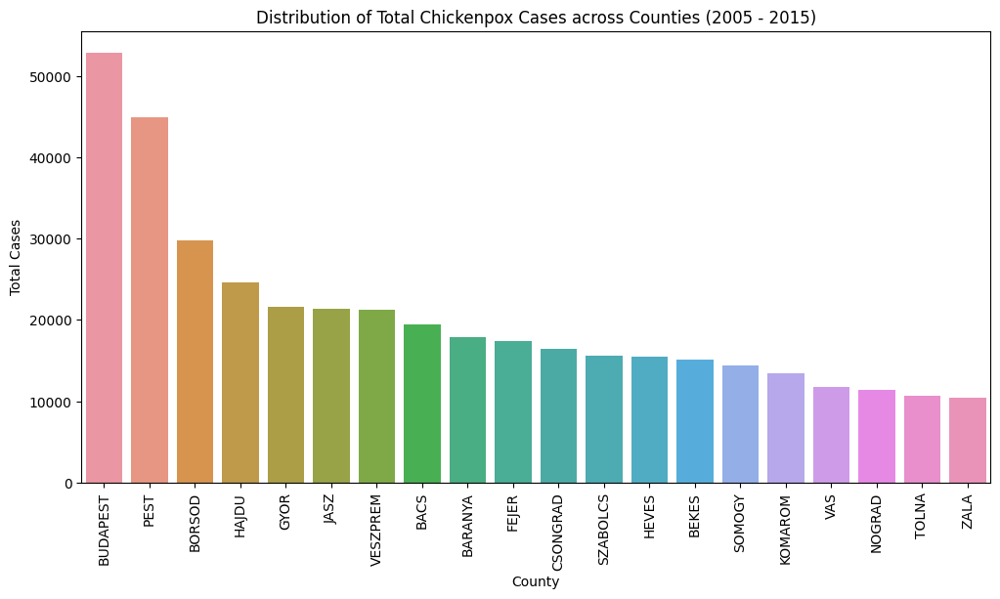

In [17]:
# Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=county_totals.index, y=county_totals.sort_values(ascending=False))
plt.xlabel('County')
plt.ylabel('Total Cases')
plt.title('Distribution of Total Chickenpox Cases across Counties (2005 - 2015)')
plt.xticks(rotation=90)
plt.show()

In [18]:
# Calculate the mean weekly case count per county
mean_weekly_cases_per_county = chickenpox_df.drop(['Date', 'National_Total', 'month', 'Year'], axis=1).mean()

# Sort the county totals in descending order
county_mean_sorted = mean_weekly_cases_per_county.sort_values(ascending=False)

# Create the bar plot
fig = px.bar(x=county_mean_sorted.index, y=county_mean_sorted.values)

# Update the layout
fig.update_layout(
    title='Distribution of the weekly mean Case Count per County',
    xaxis_title='County',
    yaxis_title='Mean Weekly Cases',
    xaxis_tickangle=-45
)

# Show the plot
fig.show()

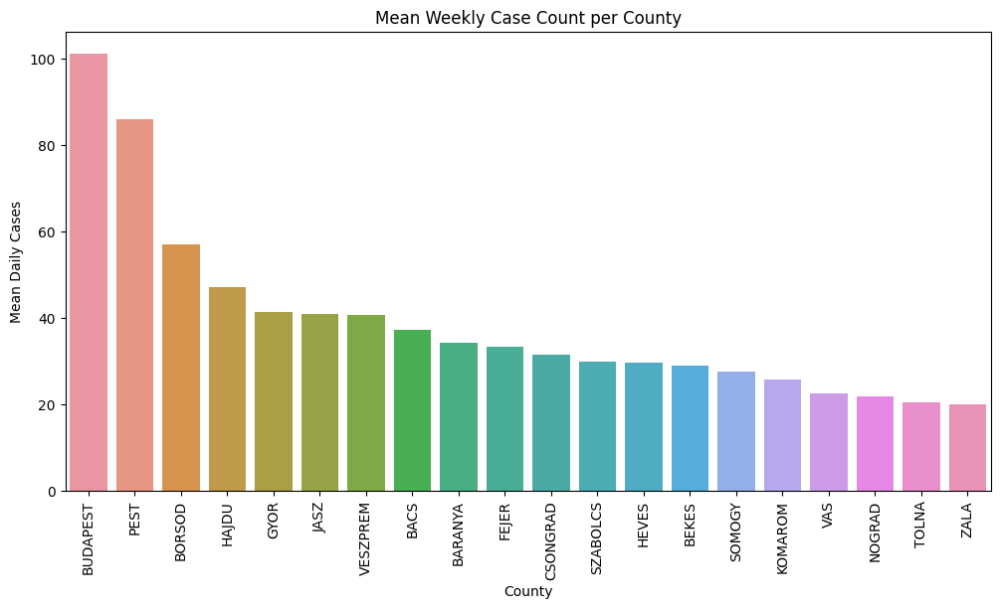

In [19]:
# Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=county_mean_sorted.index, y=county_mean_sorted.values)
plt.title('Mean Weekly Case Count per County')
plt.xlabel('County')
plt.ylabel('Mean Daily Cases')
plt.xticks(rotation=90)
plt.show()

In [20]:
# Mean daily count
national_weekly_mean = chickenpox_df.describe().T['mean'][:-2].sort_values(ascending=False)
national_weekly_mean

National_Total    776.856322
BUDAPEST          101.245211
PEST               86.101533
BORSOD             57.082375
HAJDU              47.097701
GYOR               41.436782
JASZ               40.869732
VESZPREM           40.636015
BACS               37.166667
BARANYA            34.204981
FEJER              33.272031
CSONGRAD           31.488506
SZABOLCS           29.854406
HEVES              29.691571
BEKES              28.911877
SOMOGY             27.609195
KOMAROM            25.643678
VAS                22.467433
NOGRAD             21.850575
TOLNA              20.352490
ZALA               19.873563
Name: mean, dtype: float64

#### Observations:
* `Budapest` has the highest weekly average case counts with a value of 101. This is helped by the fact that it is the most populated county in Hungary being its capotal.
* Followed by `Pest` then `Borsod`.
* The county with the least total and least daily mean count is `Zala`.

### By proportion

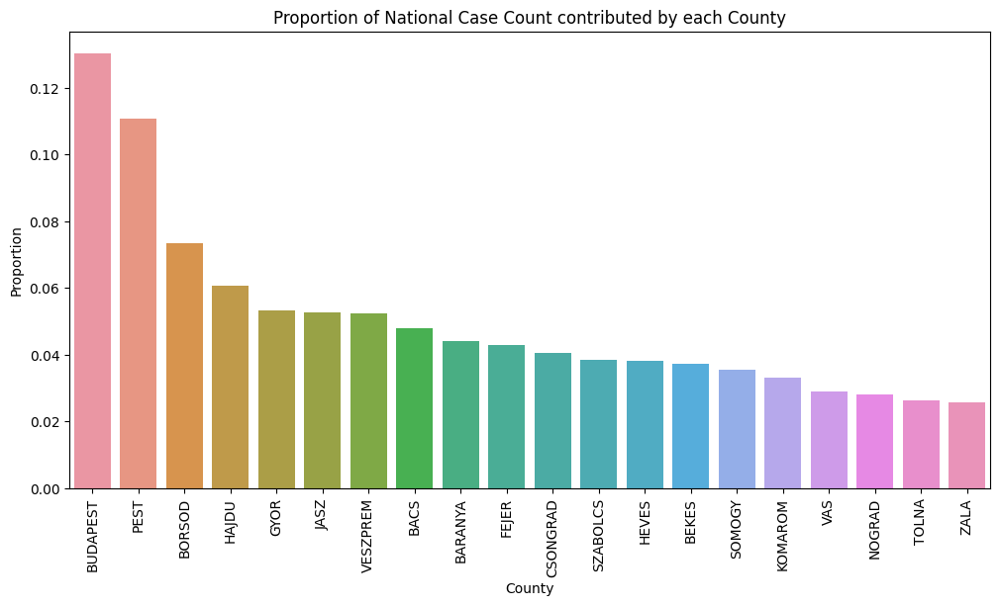

In [21]:
case_count_columns = chickenpox_df.columns.drop(['Date', 'National_Total', 'Year', 'month'])
chickenpox_df[case_count_columns] = chickenpox_df[case_count_columns].apply(pd.to_numeric, errors='coerce')

# Calculate the total national case count
total_cases = chickenpox_df['National_Total'].sum()

# Calculate the proportion of each county's case count
county_proportions = chickenpox_df[case_count_columns].sum() / total_cases

# Sorting in descending order
county_proportions = county_proportions.sort_values(ascending=False)

# Plot the county proportions
plt.figure(figsize=(12, 6))
sns.barplot(x=county_proportions.index, y=county_proportions.values)
plt.xlabel('County')
plt.ylabel('Proportion')
plt.title('Proportion of National Case Count contributed by each County')
plt.xticks(rotation=90)
plt.show()

In [22]:
# Showing the numbers as they are
county_proportions.sort_values(ascending=False)

BUDAPEST    0.130327
PEST        0.110833
BORSOD      0.073479
HAJDU       0.060626
GYOR        0.053339
JASZ        0.052609
VESZPREM    0.052308
BACS        0.047842
BARANYA     0.044030
FEJER       0.042829
CSONGRAD    0.040533
SZABOLCS    0.038430
HEVES       0.038220
BEKES       0.037217
SOMOGY      0.035540
KOMAROM     0.033010
VAS         0.028921
NOGRAD      0.028127
TOLNA       0.026199
ZALA        0.025582
dtype: float64

#### Observations:
Budapest case counts contributes to 13% of the national tally whicg is quite high considering that counties like Zala contribute to just 2% of the national tally.
Generally, the counties with a significantly high percentage of rural population as of 2015 [here](https://en.wikipedia.org/wiki/Ranked_list_of_Hungarian_counties), a threshold of 40% (`Zala, Tolna, Somogy, Nograd and Heves with the exception of Borsod`) each contribute to less than 4% of the national tally.

### Distribution of case counts
> Are they normally distributed?

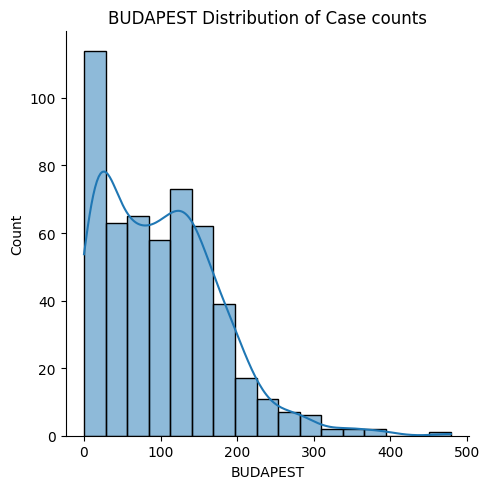

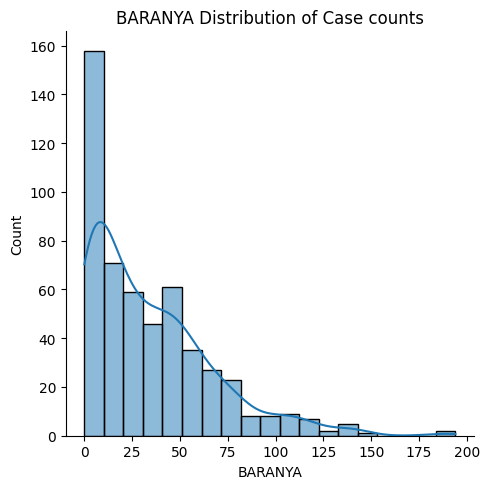

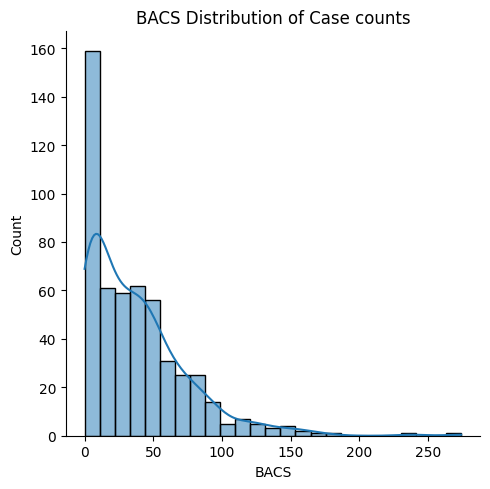

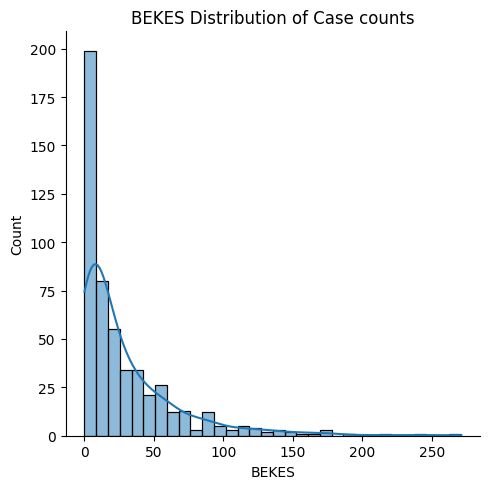

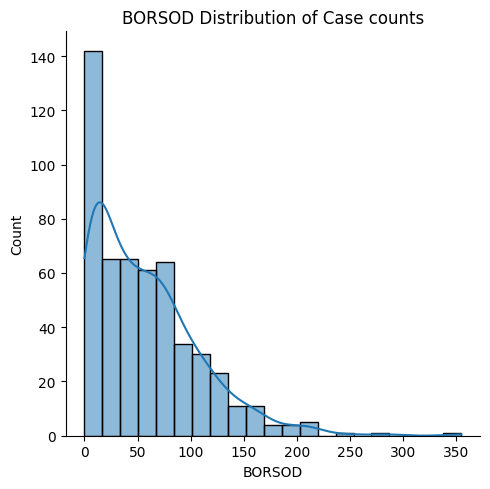

...

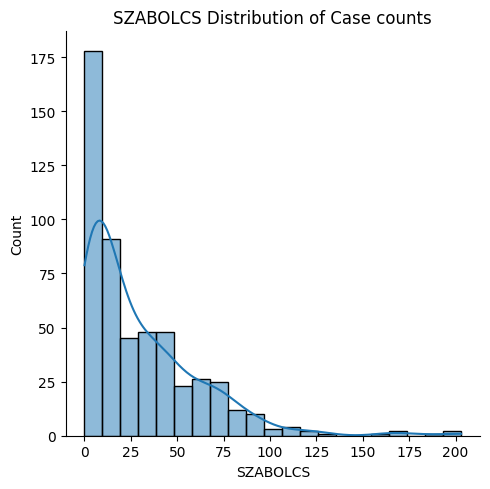

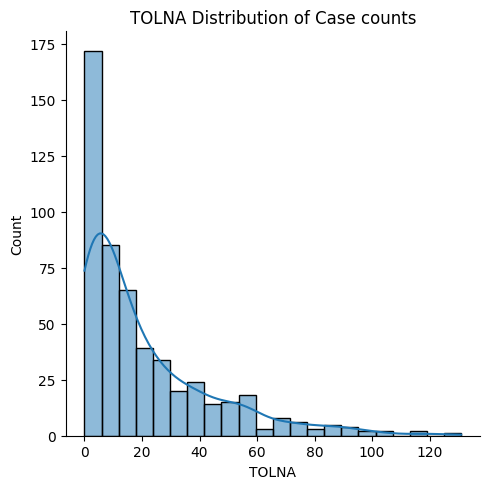

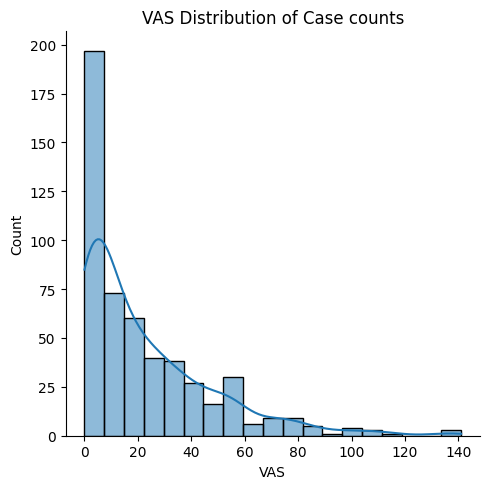

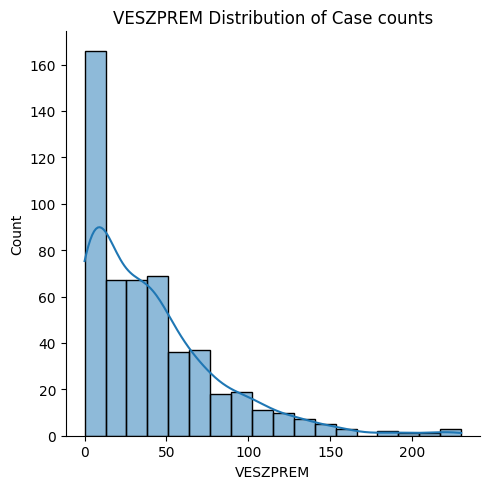

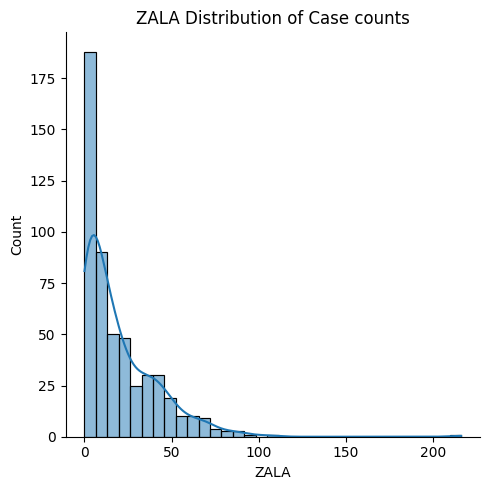

In [23]:
numeric_cols = chickenpox_df.drop(['Year', 'month', 'National_Total', 'Date'], axis = 1).columns

for idx, col in enumerate(numeric_cols):
    sns.displot(data=chickenpox_df, x=col, kde=True)
    plt.title(f"{col} Distribution of Case counts")
    plt.tight_layout()

#### Observations:
* The case counts are not normally distributed thus during modelling, there will be need to scale the data.

### Outliers

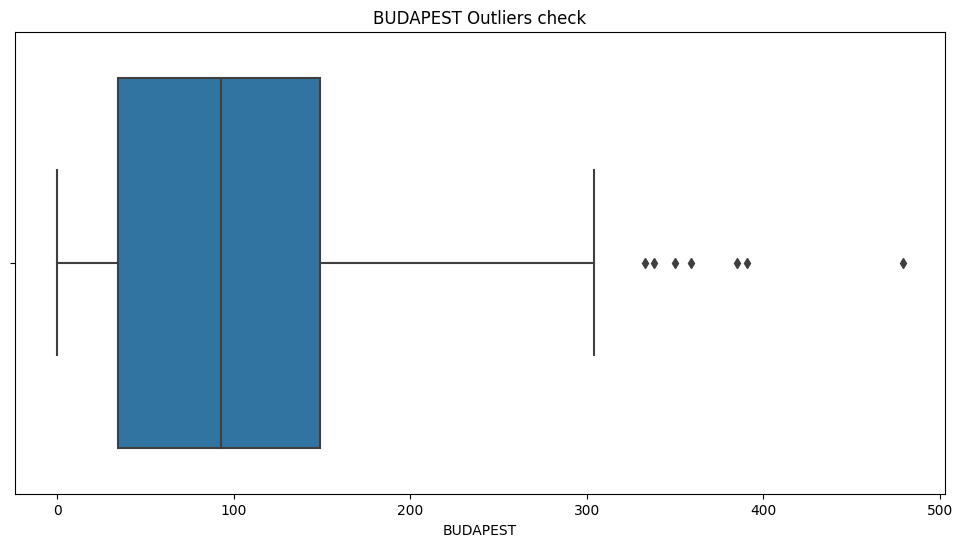

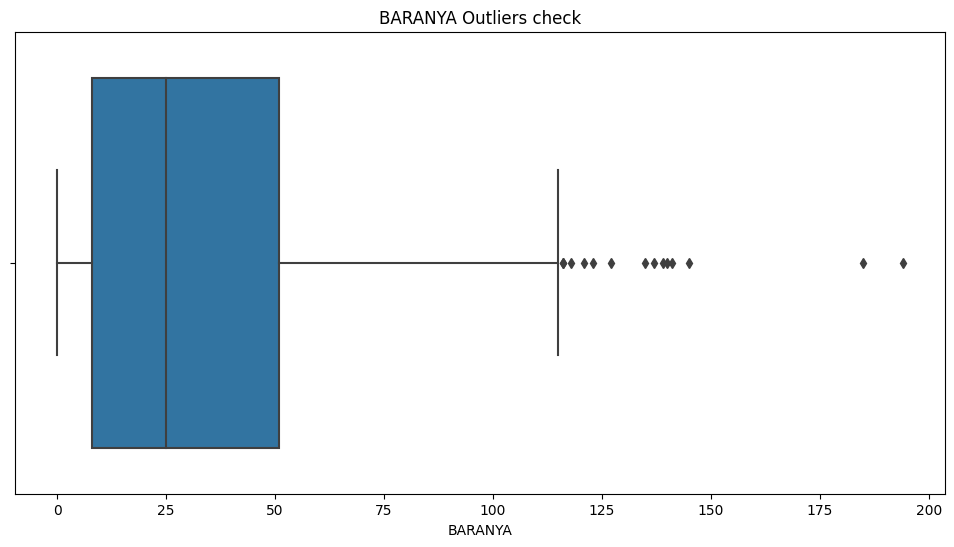

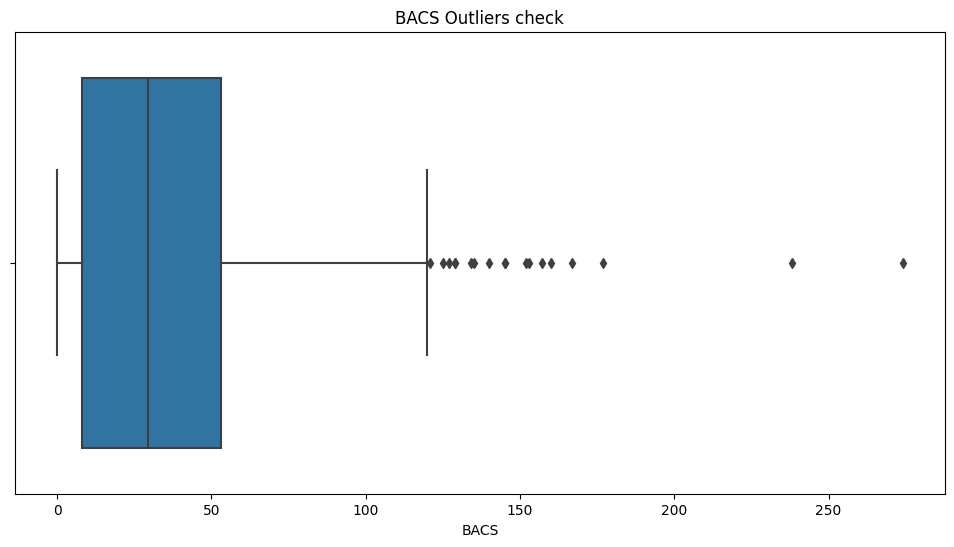

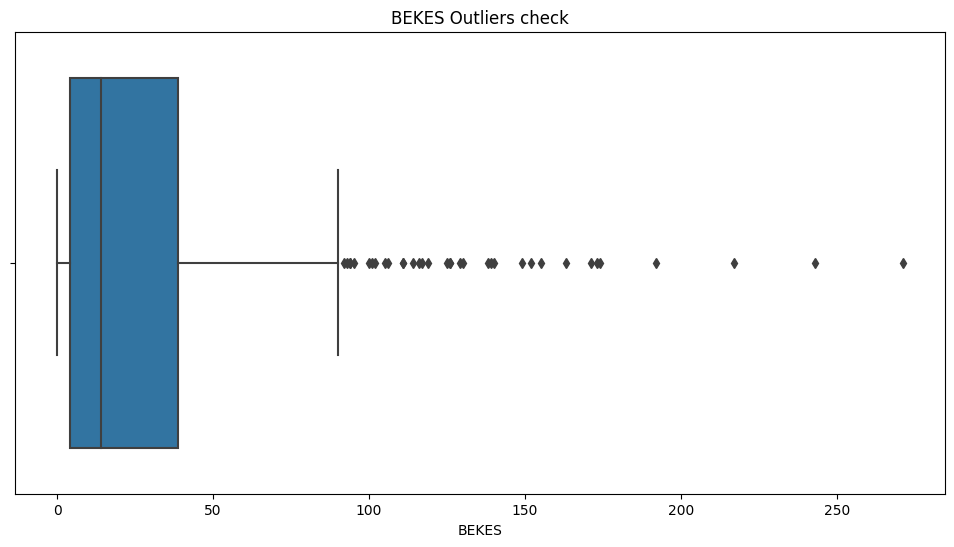

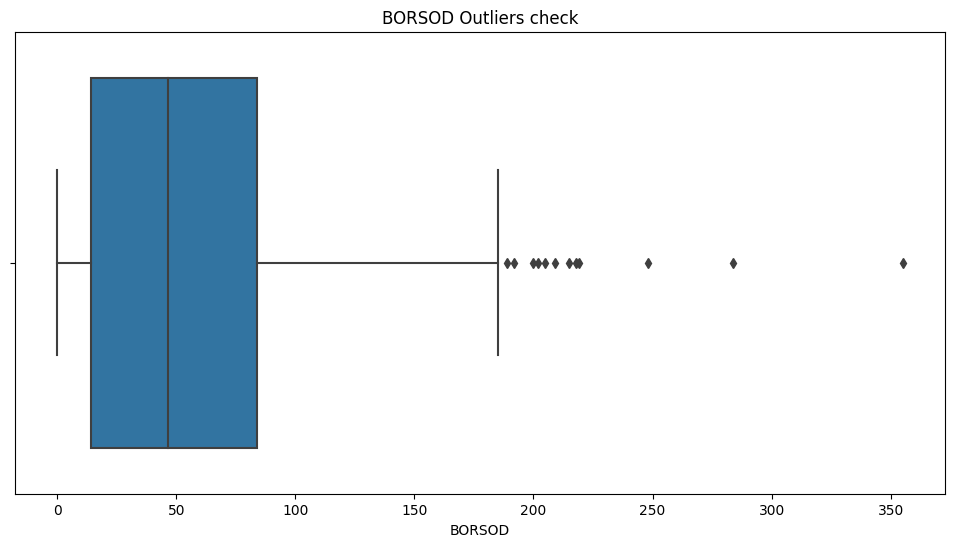

...

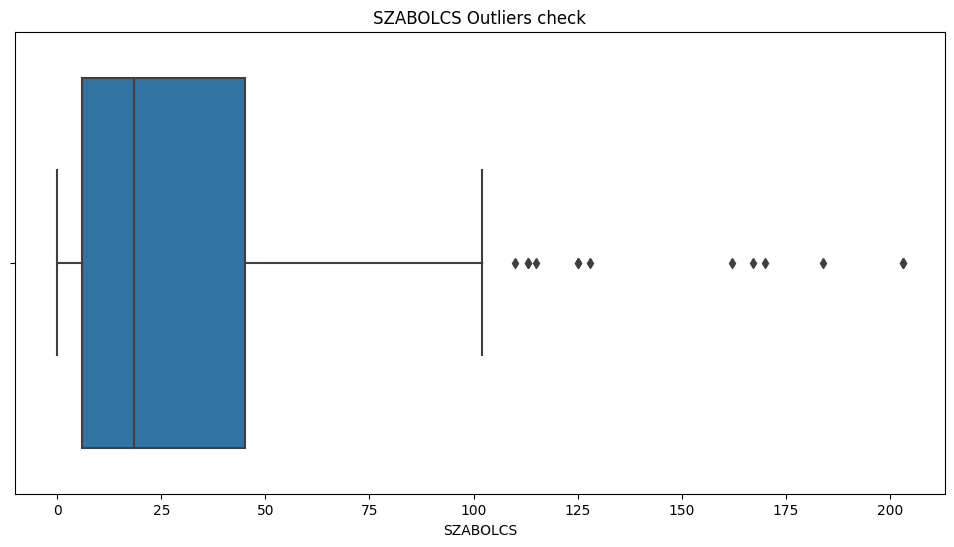

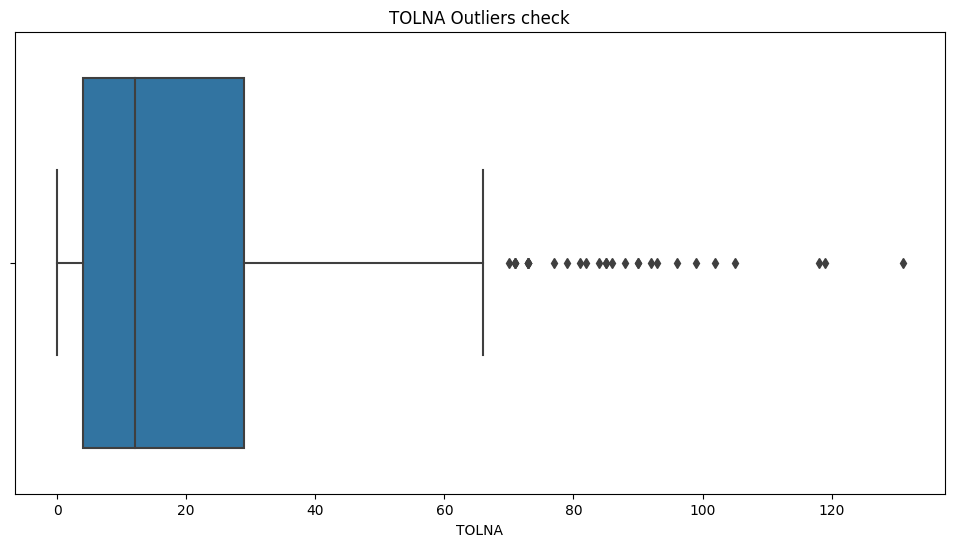

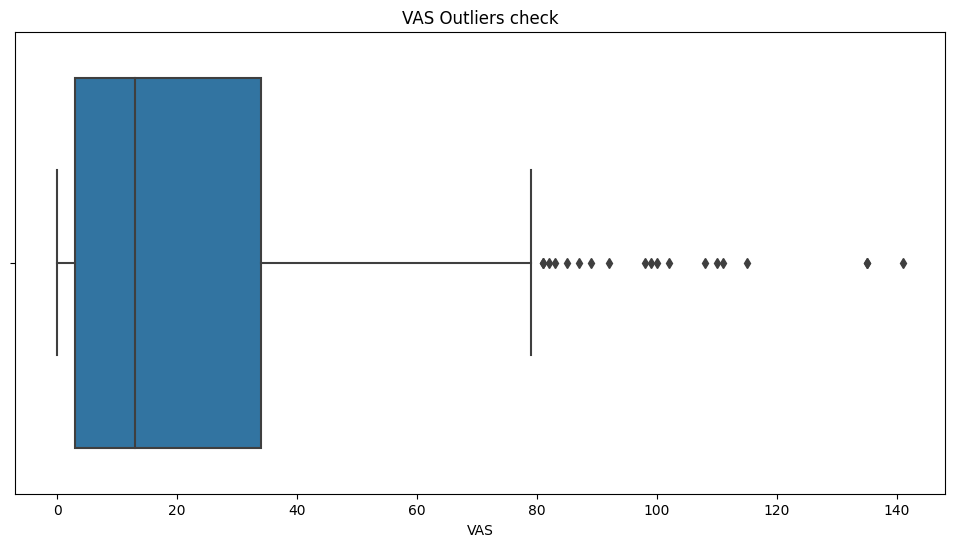

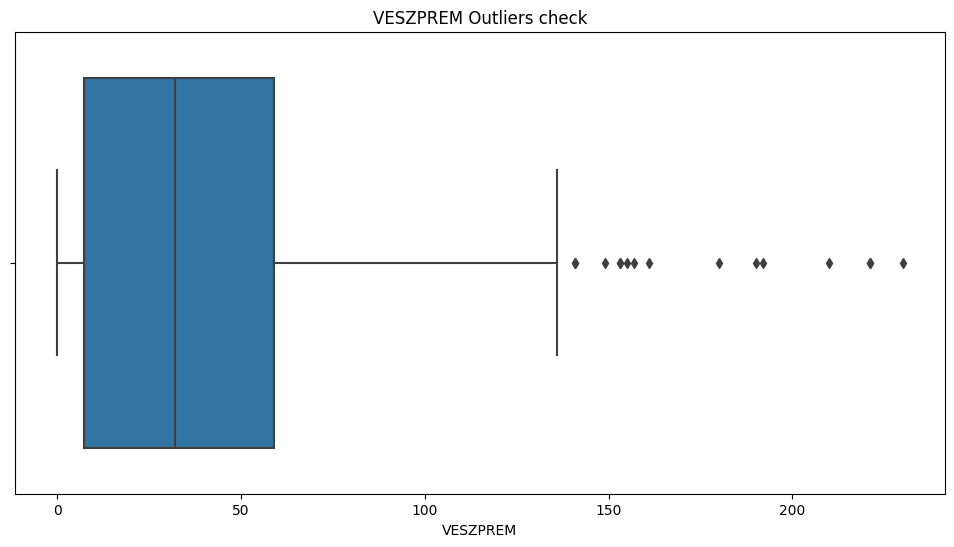

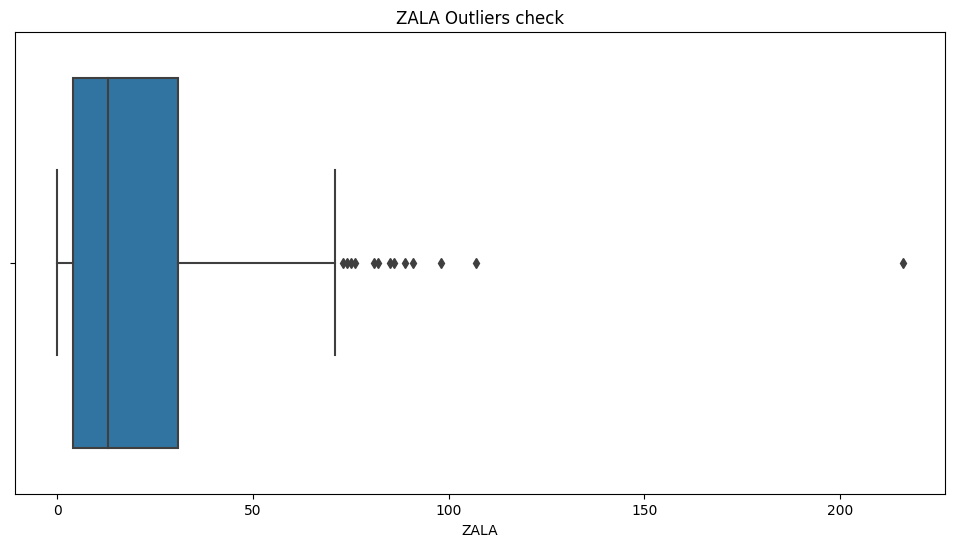

In [24]:
for col in numeric_cols:    
    plt.figure(figsize=(12,6))
    sns.boxplot(x=col,data=chickenpox_df)
    plt.title(f"{col} Outliers check")
    plt.xticks
    plt.show()

There are outliers in this data but the study shall keep them.

## Multivariate Data Analysis
> In this phase the study shall seek to understand the patterns that exist when at least two variables are considered.

The questions to be asked include:
* Are there correlated counties?
* Which year had the most case counts?
* Which month had the most case counts?

### Which year had the most case counts?

In [25]:
# Calculate the sum of cases for each year
yearly_cases = chickenpox_df.groupby('Year').sum()

# We only need the column year
yearly_cases = yearly_cases.drop(['BUDAPEST', 'BARANYA', 'BACS', 'BEKES', 'BORSOD', 'CSONGRAD',
       'FEJER', 'GYOR', 'HAJDU', 'HEVES', 'JASZ', 'KOMAROM', 'NOGRAD', 'PEST',
       'SOMOGY', 'SZABOLCS', 'TOLNA', 'VAS', 'VESZPREM', 'ZALA'], axis=1)

# Create the bar plot
fig = go.Figure(data=[
    go.Scatter(x=yearly_cases.index, y=yearly_cases[column], name='year') for column in yearly_cases.columns
])

# Update the layout
fig.update_layout(
    title='Yearly Distribution of National Total Chickenpox Cases',
    xaxis_title='Year',
    yaxis_title='Total Cases'
)

# Show the plot
fig.show()

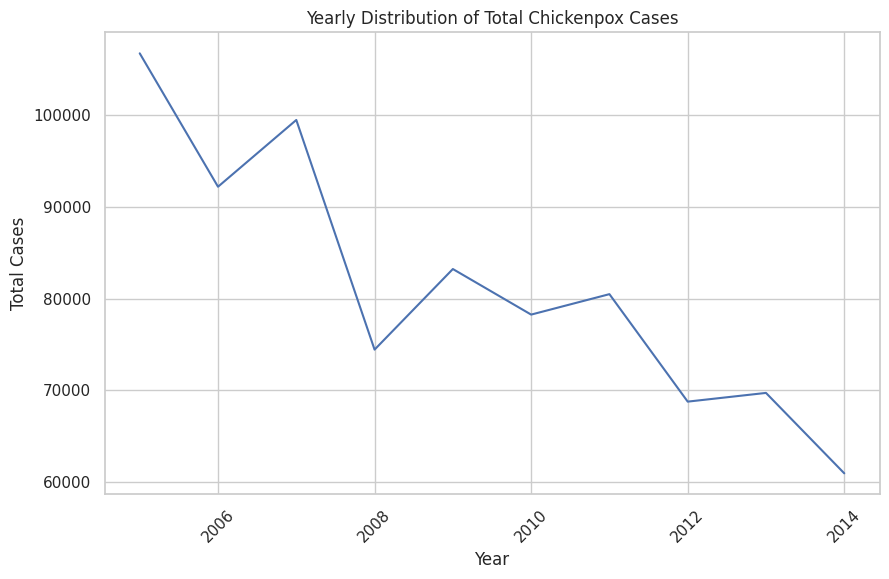

In [26]:
# Aggregate the data on a yearly basis
yearly_totals = chickenpox_df.groupby('Year').sum().sum(axis=1)

# Create a dataframe with the yearly totals
yearly_totals_df = pd.DataFrame({'Year': yearly_totals.index, 'Total Cases': yearly_totals.values})

# Plot the line plot using Seaborn
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_totals_df, x='Year', y='Total Cases')

# Set plot title and labels
plt.title('Yearly Distribution of Total Chickenpox Cases')
plt.xlabel('Year')
plt.ylabel('Total Cases')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

In [27]:
# Calculate the national total weekly mean case count
national_mean_cases = chickenpox_df['National_Total'].mean()

# Create the line plot
fig = go.Figure(data=[
    go.Scatter(x=chickenpox_df['Date'], y=chickenpox_df['National_Total'], mode='lines', name='Weekly Case Count')
])

# Update the layout
fig.update_layout(
    title='National Total Case Count over time (2005 -2015)',
    xaxis_title='Date',
    yaxis_title='Case Count'
)

# Add a line for the national mean case count
fig.add_trace(go.Scatter(x=chickenpox_df['Date'], y=[national_mean_cases] * len(chickenpox_df),
                         name='National Mean', mode='lines', line=dict(color='red')))

# Show the plot
fig.show()

In [28]:
# Decline percentage
decline_pct = (53213 - 30313)/53213 * 100

print(f"There is a {decline_pct:.2f}% percent in chickenpox cases from 2005 to 2015")

There is a 43.03% percent in chickenpox cases from 2005 to 2015


#### Observations:
* There is a general decline in the case counts of chickenpox.
* In 2005, there was a total of about 53,213 while in 2014 there was a total of about 30,313 cases.
* This represents a decline of about 43.03% which shows that the situation is actually better.
* There is an aspect of seasonality whereby the case count starts to decline around June of every year and reaches its trough in August then in October the case counts start to rise again till it reaches its peak which mostly occurs in April and at times in January.
* The peak period is between April and May and the off-peak period is between August and September.

According to this article that performed a spectral analysis of chicken pox in China in 2017 [here](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5541728/), the study revealed that for both Hong Kong and Wuhan, there chickenpox infection had two peaks in a year, one being during Spring and the other during Winter and that there exists a positive correlation between the case count and the mean average temperature and rainfall of each city. The study concluded that mean temperature has a significant influence on chickenpox.

The Hungarian data behaves in a similar manner to the findings from the chickenpox study in China in that the peak periods of chickenpox are in Spring and Winter. Spring in Hungary falls during the months of March, April and May. Winter falls during the months of December, January and February according to [Elte University](https://www.elte.hu/en/about-hungary/climate#:~:text=There%20are%20four%20seasons%20in,September%2C%20October%2C%20November)

### Monthly Case counts

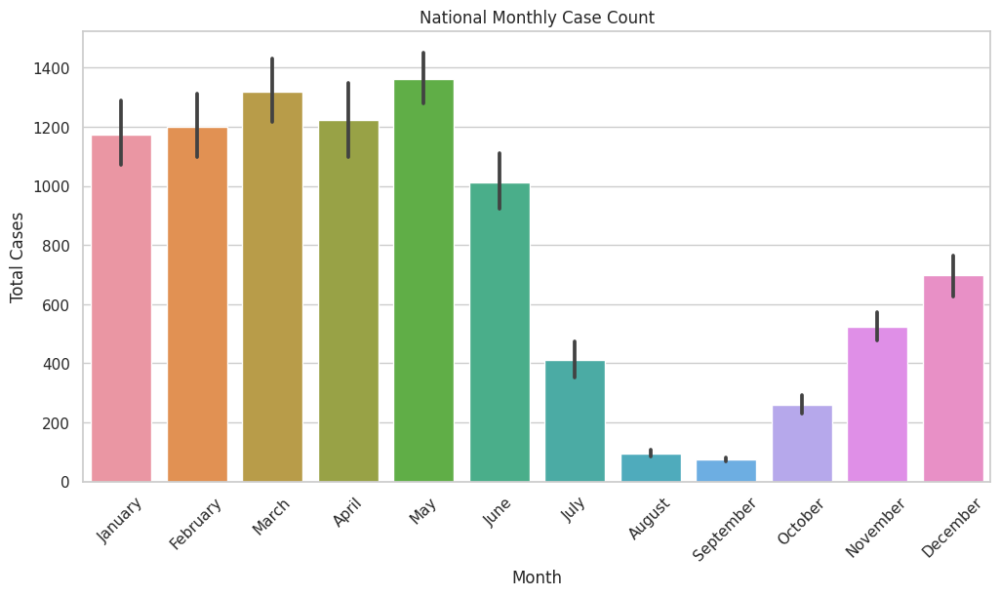

In [29]:
# National monthly
plt.figure(figsize=(12, 6))
sns.barplot(x=chickenpox_df['month'].map(lambda x: calendar.month_name[x]), y=chickenpox_df['National_Total'], data=chickenpox_df)
plt.title('National Monthly Case Count')
plt.xlabel('Month')
plt.ylabel('Total Cases')
plt.xticks(rotation=45)
plt.show()

In [30]:
# Group the data by year and month, and calculate the sum of cases
monthly_cases = chickenpox_df.groupby([chickenpox_df['Date'].dt.year.rename('Year'), chickenpox_df['Date'].dt.month.rename('Month')])['National_Total'].sum().reset_index()

# Map month numbers to month names
monthly_cases['Month'] = monthly_cases['Month'].map(lambda x: calendar.month_name[x])

# Create the bar plot
fig = go.Figure(data=[
    go.Bar(x=monthly_cases['Month'], y=monthly_cases['National_Total'])
])

# Update the layout
fig.update_layout(
    title='National Total Monthly Case Count',
    xaxis_title='Month',
    yaxis_title='Total Cases'
)

# Show the plot
fig.show()

#### Observations:
* The peak period is between April and May and the off-peak period is between August and September.

### Correlation
> Does correlatioin exist among the counties?

> Does Border sharing affect Correlation?

In [31]:
boundary_sharing = {} # Empty dictionary to hold county that share a boundary

# Looping through each county in county list
for county in county_list:
    
    # Finding the bordering counties of each county
    boundary_sharing[county] = county_edge_df.loc[county_edge_df['name_1'] == county, 'name_2'].tolist()

# Preview
boundary_sharing

{'BACS': ['JASZ', 'BACS', 'BARANYA', 'CSONGRAD', 'PEST', 'FEJER', 'TOLNA'],
 'BARANYA': ['BARANYA', 'TOLNA', 'SOMOGY', 'BACS'],
 'BEKES': ['HAJDU', 'BEKES', 'JASZ', 'CSONGRAD'],
 'BORSOD': ['HEVES', 'SZABOLCS', 'HAJDU', 'BORSOD', 'NOGRAD', 'JASZ'],
 'BUDAPEST': ['PEST', 'BUDAPEST'],
 'CSONGRAD': ['JASZ', 'BACS', 'BEKES', 'CSONGRAD'],
 'FEJER': ['FEJER', 'SOMOGY', 'KOMAROM', 'TOLNA', 'BACS', 'PEST', 'VESZPREM'],
 'GYOR': ['VESZPREM', 'KOMAROM', 'GYOR', 'VAS'],
 'HAJDU': ['JASZ', 'HAJDU', 'SZABOLCS', 'BEKES', 'BORSOD'],
 'HEVES': ['NOGRAD', 'JASZ', 'PEST', 'HEVES', 'BORSOD'],
 'JASZ': ['JASZ',
  'CSONGRAD',
  'HEVES',
  'BORSOD',
  'PEST',
  'BEKES',
  'BACS',
  'HAJDU'],
 'KOMAROM': ['GYOR', 'FEJER', 'KOMAROM', 'VESZPREM', 'PEST'],
 'NOGRAD': ['PEST', 'BORSOD', 'HEVES', 'NOGRAD'],
 'PEST': ['NOGRAD',
  'FEJER',
  'BUDAPEST',
  'HEVES',
  'BACS',
  'JASZ',
  'PEST',
  'KOMAROM'],
 'SOMOGY': ['TOLNA', 'VESZPREM', 'BARANYA', 'ZALA', 'SOMOGY', 'FEJER'],
 'SZABOLCS': ['HAJDU', 'BORSOD', 'SZA

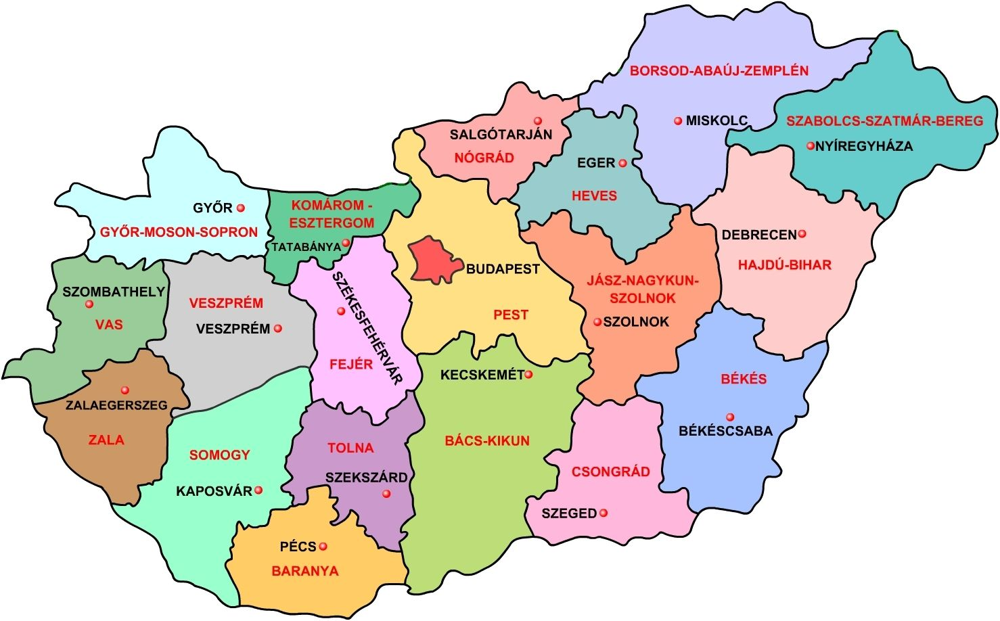

In [32]:
# Showing the map of Hungary
path="/home/teofilo_acholla_ligawa_gafna/Documents/hamoye/mlops/projects/chicken_pox_case_count_prediction/teofizzy/images/hungary.jpg"
display(Image.open(path))

In [33]:
# Looping through the dictionary
for key, val in boundary_sharing.items():
    
    # Accesing the border counties of each county
    for county in val:
        
        # If the key has a similar value in the values, remove the value
        if key == county:
            val.remove(county)
            
boundary_sharing

{'BACS': ['JASZ', 'BARANYA', 'CSONGRAD', 'PEST', 'FEJER', 'TOLNA'],
 'BARANYA': ['TOLNA', 'SOMOGY', 'BACS'],
 'BEKES': ['HAJDU', 'JASZ', 'CSONGRAD'],
 'BORSOD': ['HEVES', 'SZABOLCS', 'HAJDU', 'NOGRAD', 'JASZ'],
 'BUDAPEST': ['PEST'],
 'CSONGRAD': ['JASZ', 'BACS', 'BEKES'],
 'FEJER': ['SOMOGY', 'KOMAROM', 'TOLNA', 'BACS', 'PEST', 'VESZPREM'],
 'GYOR': ['VESZPREM', 'KOMAROM', 'VAS'],
 'HAJDU': ['JASZ', 'SZABOLCS', 'BEKES', 'BORSOD'],
 'HEVES': ['NOGRAD', 'JASZ', 'PEST', 'BORSOD'],
 'JASZ': ['CSONGRAD', 'HEVES', 'BORSOD', 'PEST', 'BEKES', 'BACS', 'HAJDU'],
 'KOMAROM': ['GYOR', 'FEJER', 'VESZPREM', 'PEST'],
 'NOGRAD': ['PEST', 'BORSOD', 'HEVES'],
 'PEST': ['NOGRAD', 'FEJER', 'BUDAPEST', 'HEVES', 'BACS', 'JASZ', 'KOMAROM'],
 'SOMOGY': ['TOLNA', 'VESZPREM', 'BARANYA', 'ZALA', 'FEJER'],
 'SZABOLCS': ['HAJDU', 'BORSOD'],
 'TOLNA': ['SOMOGY', 'BACS', 'BARANYA', 'FEJER'],
 'VAS': ['ZALA', 'GYOR', 'VESZPREM'],
 'VESZPREM': ['KOMAROM', 'ZALA', 'GYOR', 'FEJER', 'VAS', 'SOMOGY'],
 'ZALA': ['VAS', 'S

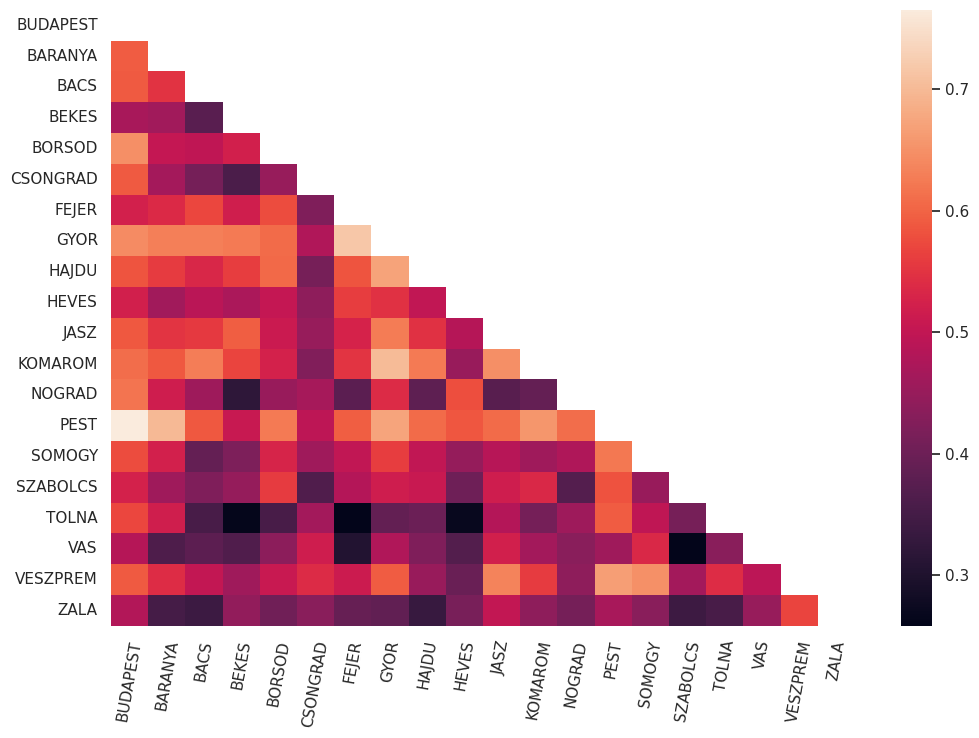

In [34]:
data_matrix = chickenpox_df.drop(['Date', 'National_Total', 'month', 'Year'], axis=1)

data_corr = data_matrix.corr()
# Creating the mask
mask = np.triu(np.ones_like(data_corr, dtype=bool))

# Plotting the correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(data_corr, annot= False, mask=mask)
plt.xticks(rotation=80)
plt.show()

In [35]:
county_corr = data_matrix.corr().abs().stack().reset_index().sort_values(0, ascending = False)
county_corr['pairs'] = list(zip(county_corr['level_0'], county_corr['level_1']))
county_corr.set_index(['pairs'], inplace = True)

#dropping the level_i columns
county_corr.drop(columns = ['level_0', 'level_1'], inplace = True)

#add correlation column
county_corr.columns = ['cc']

#dropping duplicates
county_corr.drop_duplicates(inplace = True)

#correlations over .75, but less than 1. = multicollinarity
county_corr[(county_corr['cc'] > 0.6) & (county_corr['cc'] < 1)]

,cc
pairs,
"(PEST, BUDAPEST)",0.765108
"(FEJER, GYOR)",0.716062
"(GYOR, KOMAROM)",0.700550
"(PEST, BARANYA)",0.698257
"(PEST, GYOR)",0.673638
"(GYOR, HAJDU)",0.671937
"(VESZPREM, PEST)",0.665890
"(PEST, KOMAROM)",0.654311
"(SOMOGY, VESZPREM)",0.649248


#### Observations:
There exists a fairly high correlation between some counties that share a border with each other for example, `PEST~BUDAPEST` and `GYOR~KOMAROM`.

## Time Series Analysis

### Counties
> Performing a county by county analysis

### Seasonality

In [36]:
temporal_df = chickenpox_df.drop(['National_Total', 'Year', 'month'], axis=1)
spatial_df = county_edge_df

In [37]:
def index_date(df):
    """ Ensures that the index of the data is the date column

    Args:
        df (_pandas dataframe_): _data frame_

    Returns:
        _pandas dataframe_: _data frame_
    """
    if isinstance(df.index, pd.DatetimeIndex):
        df.index.name = 'Date'
        
    else:
        df.rename(columns={'index':'Date'}, inplace=True)
        df.set_index('Date', inplace=True)
        
    return df

In [38]:
# Indexing the data
temporal_df = index_date(temporal_df)

# preview
temporal_df.head()

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
Date,,,,,,,,,,,,,,,,,,,,
2005-01-03,168,79,30,173,169,42,136,120,162,36,130,57,2,178,66,64,11,29,87,68
2005-01-10,157,60,30,92,200,53,51,70,84,28,80,50,29,141,48,29,58,53,68,26
2005-01-17,96,44,31,86,93,30,93,84,191,51,64,46,4,157,33,33,24,18,62,44
2005-01-24,163,49,43,126,46,39,52,114,107,42,63,54,14,107,66,50,25,21,43,31
2005-01-31,122,78,53,87,103,34,95,131,172,40,61,49,11,124,63,56,7,47,85,60


In [39]:
# Group the time series into monthly buckets
temporal_monthly = temporal_df.resample('MS')

# Take the mean of each group 
temporal_monthly_mean = temporal_monthly.mean()

# Display the first 10 elements of resulting time series
temporal_monthly_mean.head(10)

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
Date,,,,,,,,,,,,,,,,,,,,
2005-01-01,141.20,62.00,37.40,112.80,122.20,39.60,85.40,103.80,143.20,39.40,79.60,51.20,12.00,141.40,55.20,46.40,25.00,33.60,69.00,45.80
2005-02-01,140.25,84.75,63.00,172.25,141.75,53.00,100.75,144.75,154.50,51.00,90.50,67.25,17.25,138.75,87.25,72.50,18.50,49.25,113.00,56.50
2005-03-01,123.00,69.25,89.75,212.50,133.00,60.25,82.75,125.25,120.75,38.25,96.50,79.50,12.50,136.50,58.50,82.25,30.00,58.50,101.00,42.25
2005-04-01,122.00,65.00,81.25,117.00,112.50,52.25,74.00,112.25,155.25,49.25,123.50,59.75,16.25,132.00,50.75,55.75,13.00,65.00,79.50,28.25
2005-05-01,133.20,70.80,108.00,104.00,97.80,36.00,80.00,129.00,132.40,91.60,138.20,90.00,40.00,139.40,49.20,46.80,21.20,59.60,79.60,35.40
2005-06-01,133.75,56.00,117.50,60.50,99.25,28.75,59.25,90.50,111.50,58.50,116.75,98.00,27.00,104.25,21.00,57.75,28.00,36.50,67.75,43.00
2005-07-01,77.50,14.25,30.75,15.25,37.75,16.50,20.75,39.50,50.25,23.75,48.25,42.00,7.75,42.50,9.75,36.75,9.75,27.50,30.50,16.00
2005-08-01,25.00,2.00,6.00,3.40,3.60,3.60,3.40,7.40,8.00,4.40,8.00,6.60,1.80,16.20,3.60,5.80,2.40,7.20,5.20,2.20
2005-09-01,8.75,2.25,4.75,2.00,16.75,2.00,1.75,2.75,3.50,2.75,6.25,4.00,3.25,12.50,3.50,4.25,3.75,2.75,3.00,4.75


In [40]:
# check for missing values
temporal_monthly_mean.isna().sum()

BUDAPEST    0
BARANYA     0
BACS        0
BEKES       0
BORSOD      0
CSONGRAD    0
FEJER       0
GYOR        0
HAJDU       0
HEVES       0
JASZ        0
KOMAROM     0
NOGRAD      0
PEST        0
SOMOGY      0
SZABOLCS    0
TOLNA       0
VAS         0
VESZPREM    0
ZALA        0
dtype: int64

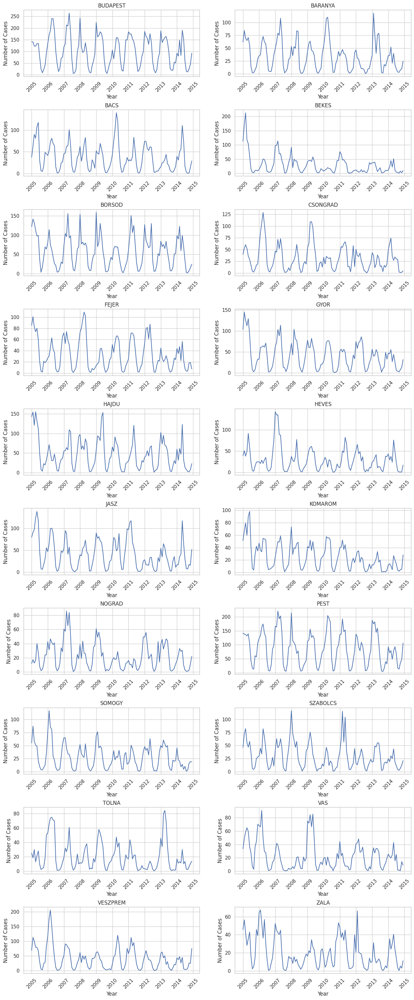

In [41]:
# Calculate the number of rows and columns for subplots
num_rows = (len(temporal_monthly_mean.columns) + 1) // 2  # Round up to the nearest integer
num_cols = min(len(temporal_monthly_mean.columns), 2)

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4*num_rows))
fig.subplots_adjust(hspace=0.5)  # Adjust vertical spacing between subplots

# Plot the time series for each column in subplots
for i, column in enumerate(temporal_monthly_mean.columns):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col] if num_rows > 1 else axes[col]  # Handle single row case
    ax.plot(temporal_monthly_mean.index, temporal_monthly_mean[column])
    ax.set_title(column)
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Cases')
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

# Remove empty subplots if the number of columns is not a multiple of 4
if len(temporal_monthly_mean.columns) % 4 != 0:
    for i in range(len(temporal_monthly_mean.columns), num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        fig.delaxes(axes[row, col])

# Display the plot
plt.show()

#### Observations:
There is an aspect of seasonality in most of the counties, whereby the number of cases peaks during some months and falls off in other months.
The first peak is during the first few months of the year between January to June, where the highest is around May then it begins to fall off in June and reaches the lowest period between August and September. The reasons for this had already been mentioned earlier.

### Testing for Trends

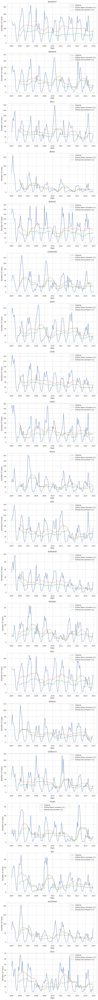

In [42]:
# Calculate rolling statistics for each column
rolling_mean = temporal_monthly_mean.rolling(window=12).mean()  # Rolling mean with window size of 12
rolling_std = temporal_monthly_mean.rolling(window=12).std()  # Rolling standard deviation with window size of 12

# Plot the original data and rolling statistics for each column
fig, axes = plt.subplots(nrows=len(temporal_df.columns), ncols=1, figsize=(10, 5 * len(temporal_df.columns)))

for i, column in enumerate(temporal_monthly_mean.columns):
    ax = axes[i] if len(temporal_monthly_mean.columns) > 1 else axes
    ax.plot(temporal_monthly_mean.index, temporal_monthly_mean[column], label='Original')
    ax.plot(rolling_mean.index, rolling_mean[column], label='Rolling Mean (window=12)')
    ax.plot(rolling_std.index, rolling_std[column], label='Rolling Std (window=12)')
    ax.set_title(column)
    ax.set_xlabel('Date')
    ax.set_ylabel('Number of Cases')
    ax.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

#### Observations:
* The rolling mean of most plots generally exhibit a downward trend, implying that for most of the counties, the number of cases has been decreasing over time.
* The rolling standard deviation of some plots exhibit a pattern of seasonality. This shows that there is seasonality in the data

In [43]:
def stationarity_check(TS, w:int):
    """_Performing an augmented dickey fuller test to check for stationarity_

    Args:
        TS (_type_): _time series data frame_
        w (int): _window(lag periods)_

    Returns:
        _conclusion_:  str__
    """
    # Calculate rolling statistics
    roll_mean = TS.rolling(window=w, center=False).mean()
    roll_std = TS.rolling(window=w, center=False).std()

    # Perform the Dickey Fuller test
    dftest = adfuller(TS)

    # Plot rolling statistics
    fig = plt.figure(figsize=(12, 6))
    orig = plt.plot(TS, color='blue', label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    # Print Dickey-Fuller test results
    print('Results of Dickey-Fuller Test: \n')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput)

    print()
    
    # Initialize an empty string

    # Hypothesis testing
    if dfoutput['p-value'] >= 0.05:
        conclusion = 'The data is non-stationary'
    else:
        conclusion = 'The data is stationary'
        
    return conclusion

Checking stationarity for column: BUDAPEST


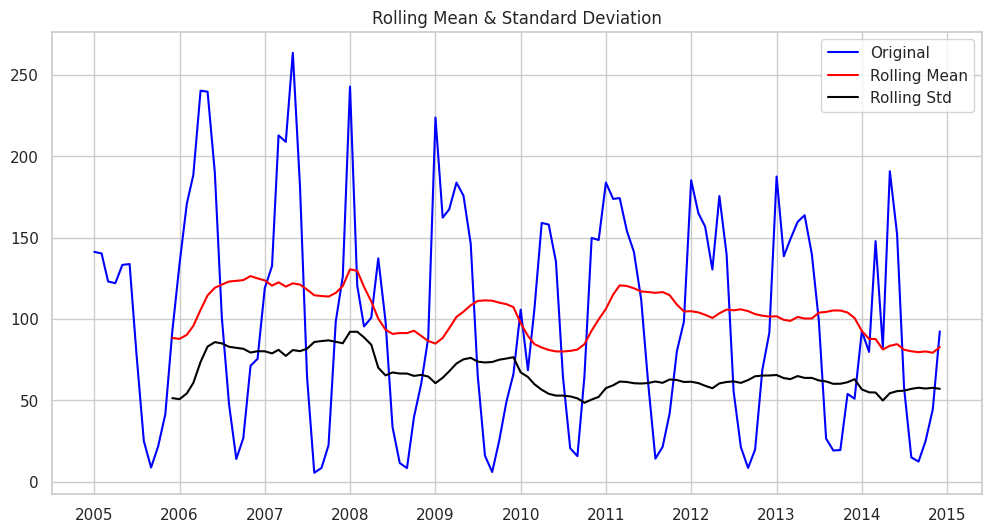

Results of Dickey-Fuller Test: 

Test Statistic                  -3.147497
p-value                          0.023232
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: BARANYA


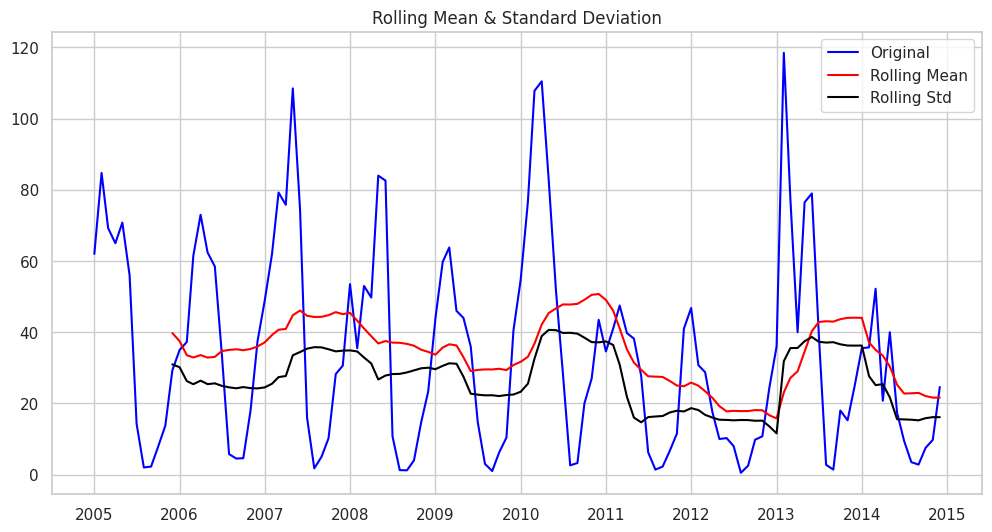

Results of Dickey-Fuller Test: 

Test Statistic                -6.680967e+00
p-value                        4.343380e-09
#Lags Used                     5.000000e+00
Number of Observations Used    1.140000e+02
Critical Value (1%)           -3.489058e+00
Critical Value (5%)           -2.887246e+00
Critical Value (10%)          -2.580481e+00
dtype: float64

Checking stationarity for column: BACS


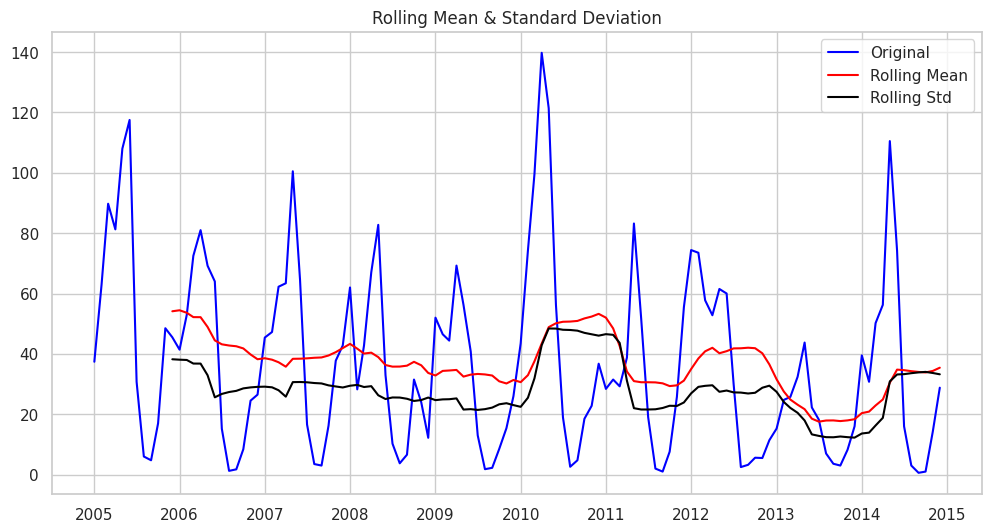

Results of Dickey-Fuller Test: 

Test Statistic                  -2.806121
p-value                          0.057405
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: BEKES


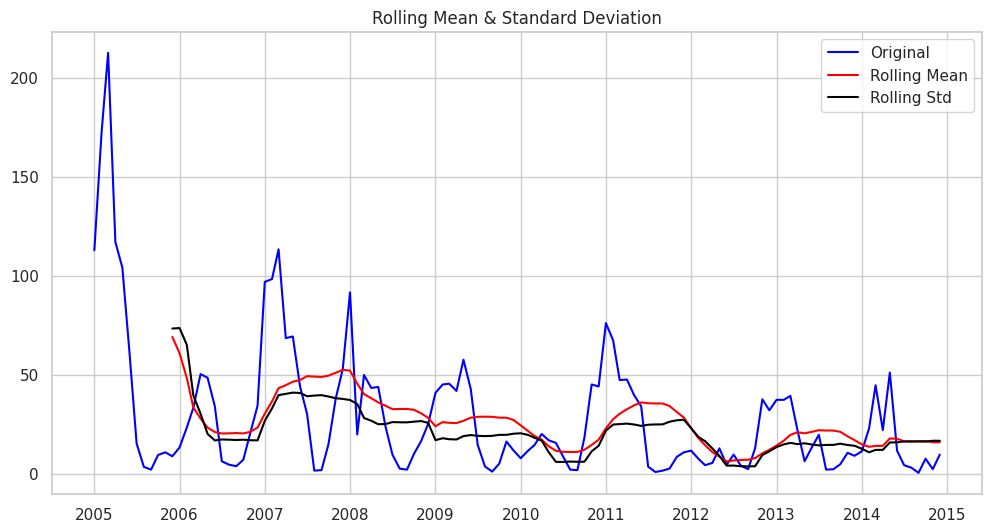

Results of Dickey-Fuller Test: 

Test Statistic                -8.445740e+00
p-value                        1.714830e-13
#Lags Used                     2.000000e+00
Number of Observations Used    1.170000e+02
Critical Value (1%)           -3.487517e+00
Critical Value (5%)           -2.886578e+00
Critical Value (10%)          -2.580124e+00
dtype: float64

Checking stationarity for column: BORSOD


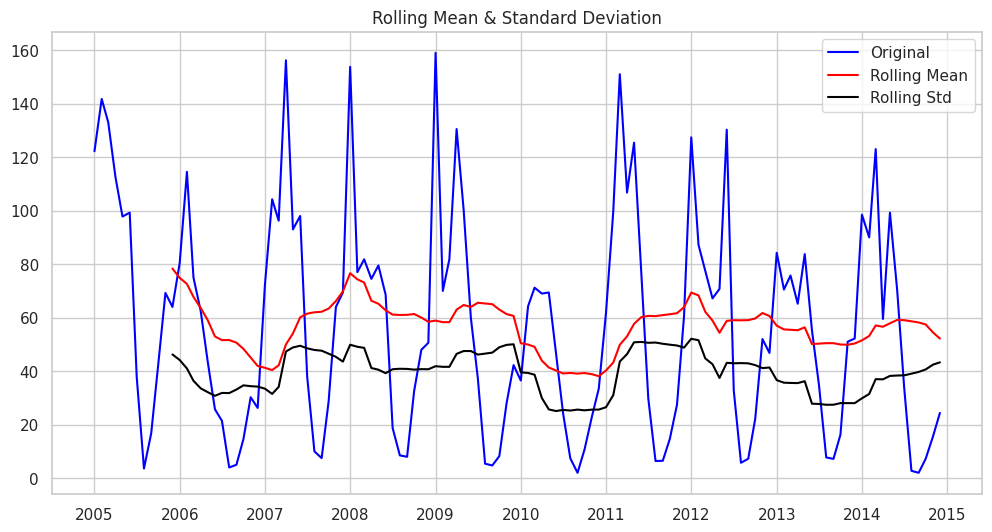

Results of Dickey-Fuller Test: 

Test Statistic                -8.275761e+00
p-value                        4.661423e-13
#Lags Used                     5.000000e+00
Number of Observations Used    1.140000e+02
Critical Value (1%)           -3.489058e+00
Critical Value (5%)           -2.887246e+00
Critical Value (10%)          -2.580481e+00
dtype: float64

Checking stationarity for column: CSONGRAD


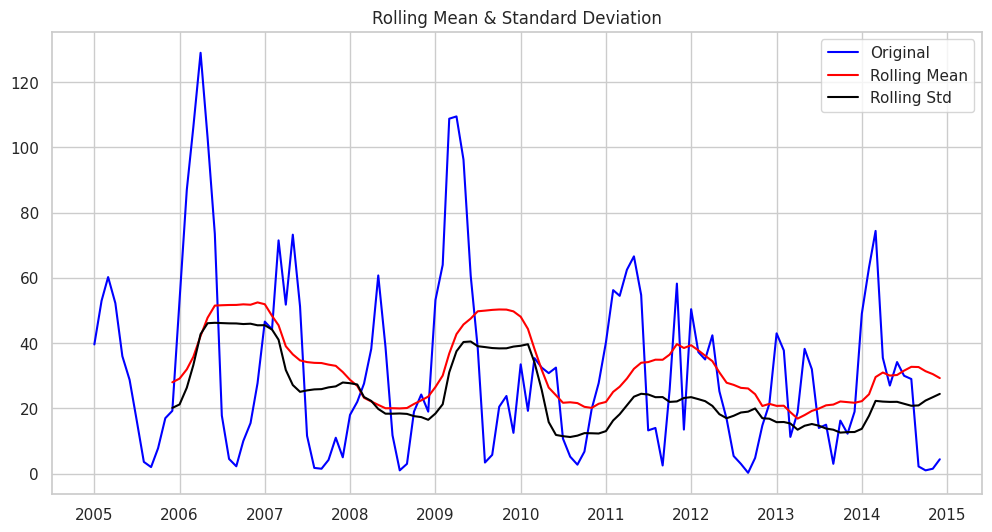

Results of Dickey-Fuller Test: 

Test Statistic                  -2.809682
p-value                          0.056904
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: FEJER


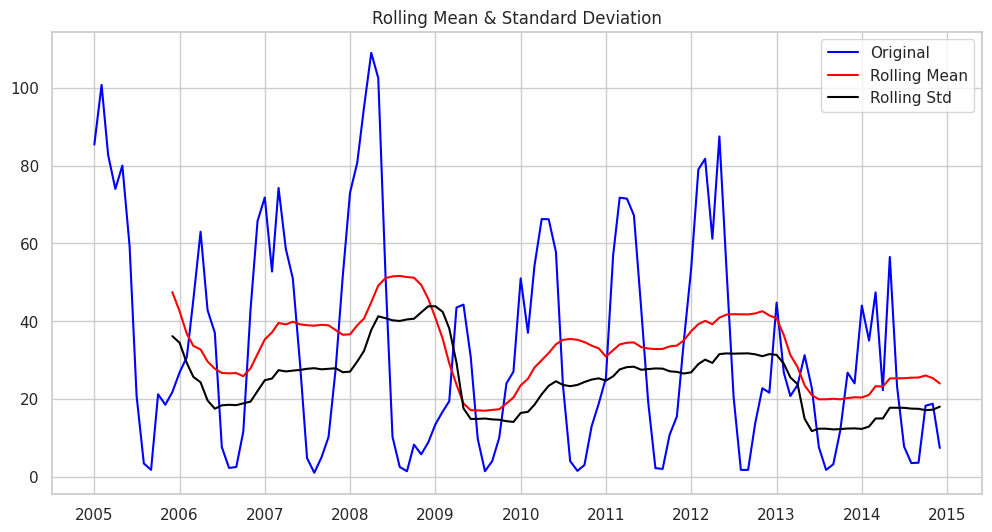

Results of Dickey-Fuller Test: 

Test Statistic                  -2.924263
p-value                          0.042598
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: GYOR


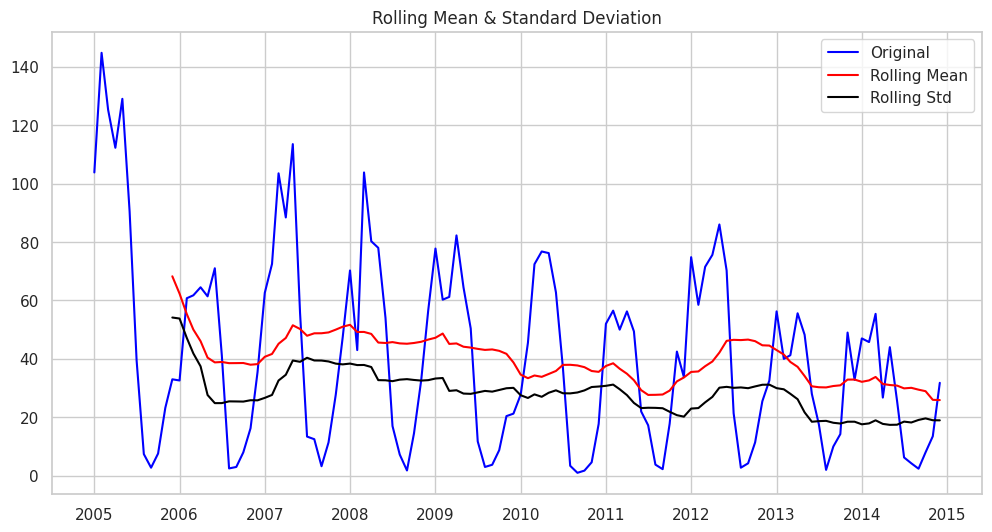

Results of Dickey-Fuller Test: 

Test Statistic                  -2.084972
p-value                          0.250600
#Lags Used                      13.000000
Number of Observations Used    106.000000
Critical Value (1%)             -3.493602
Critical Value (5%)             -2.889217
Critical Value (10%)            -2.581533
dtype: float64

Checking stationarity for column: HAJDU


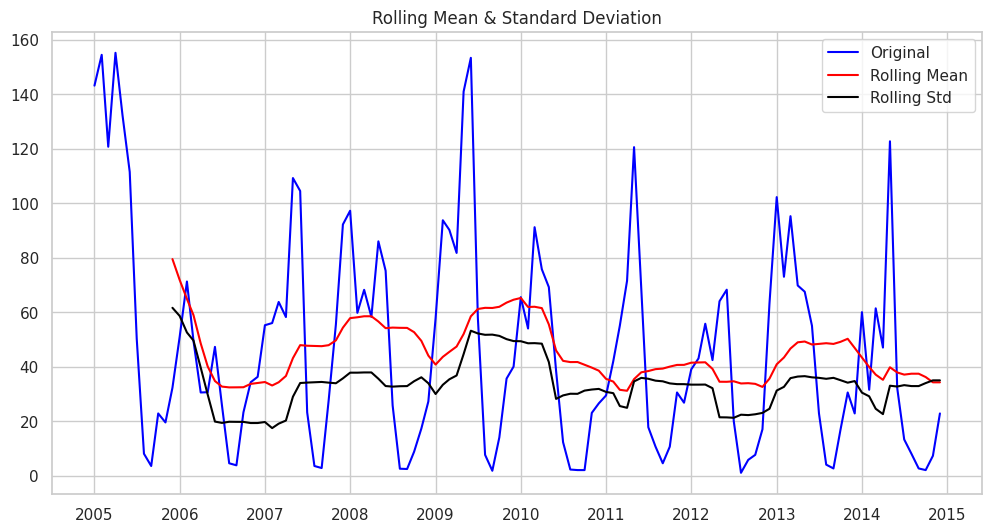

Results of Dickey-Fuller Test: 

Test Statistic                  -3.041217
p-value                          0.031220
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: HEVES


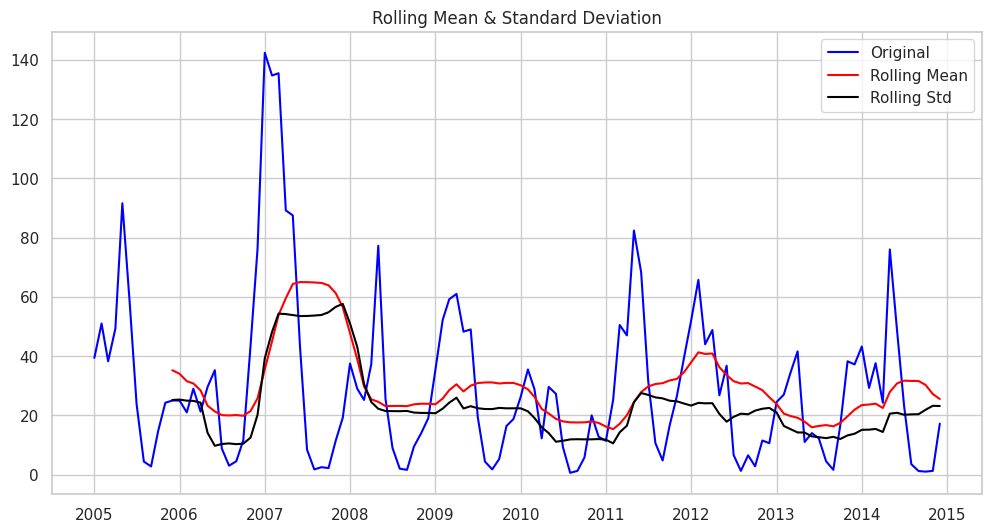

Results of Dickey-Fuller Test: 

Test Statistic                -5.673417e+00
p-value                        8.815532e-07
#Lags Used                     2.000000e+00
Number of Observations Used    1.170000e+02
Critical Value (1%)           -3.487517e+00
Critical Value (5%)           -2.886578e+00
Critical Value (10%)          -2.580124e+00
dtype: float64

Checking stationarity for column: JASZ


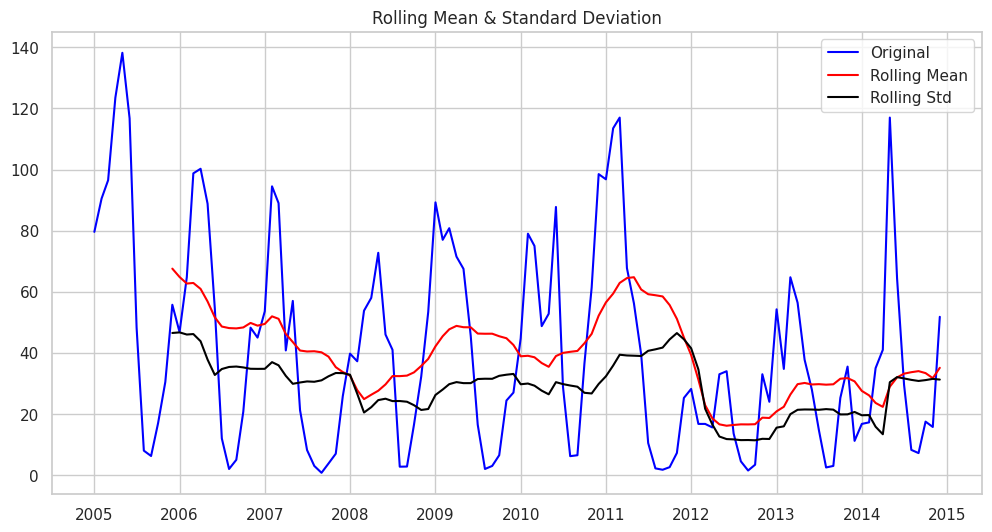

Results of Dickey-Fuller Test: 

Test Statistic                -6.555335e+00
p-value                        8.645014e-09
#Lags Used                     4.000000e+00
Number of Observations Used    1.150000e+02
Critical Value (1%)           -3.488535e+00
Critical Value (5%)           -2.887020e+00
Critical Value (10%)          -2.580360e+00
dtype: float64

Checking stationarity for column: KOMAROM


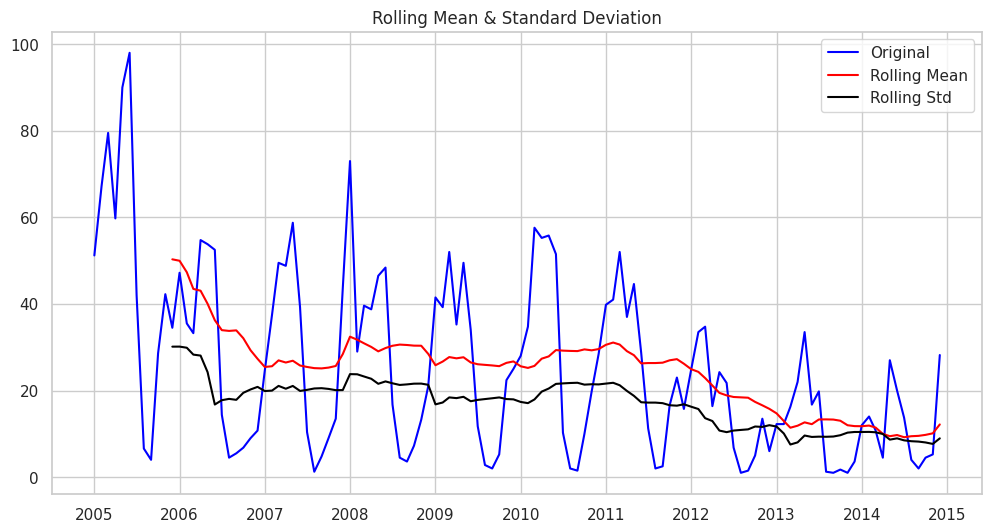

Results of Dickey-Fuller Test: 

Test Statistic                  -2.435062
p-value                          0.132084
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: NOGRAD


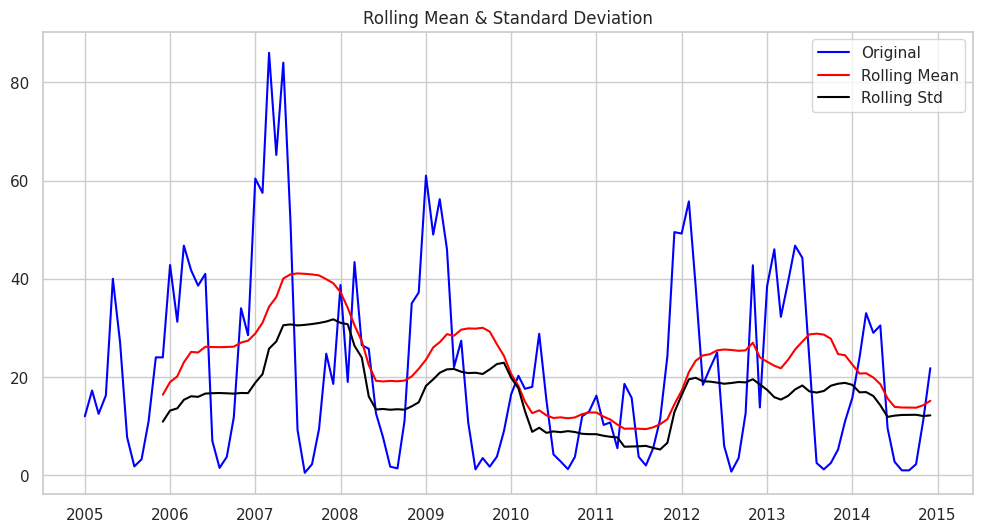

Results of Dickey-Fuller Test: 

Test Statistic                  -2.569375
p-value                          0.099493
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: PEST


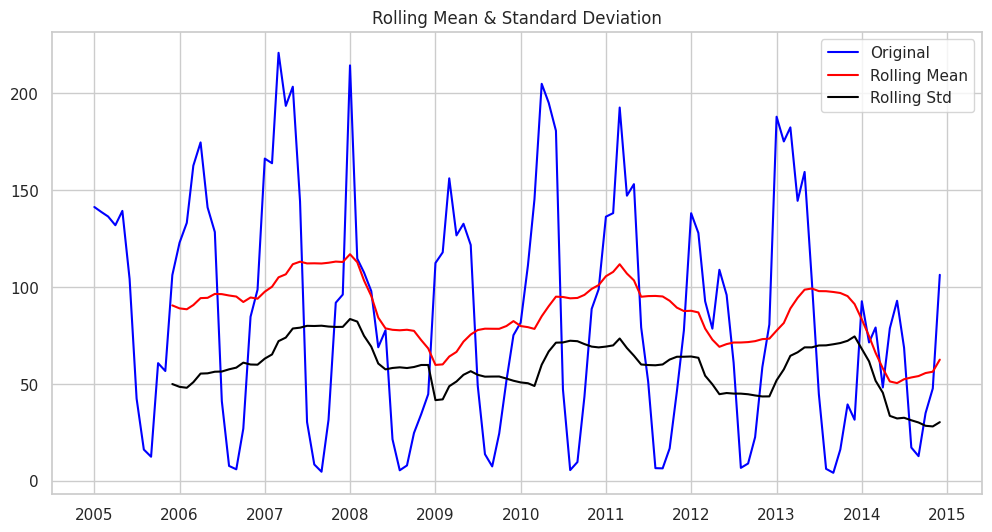

Results of Dickey-Fuller Test: 

Test Statistic                  -2.421780
p-value                          0.135683
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Checking stationarity for column: SOMOGY


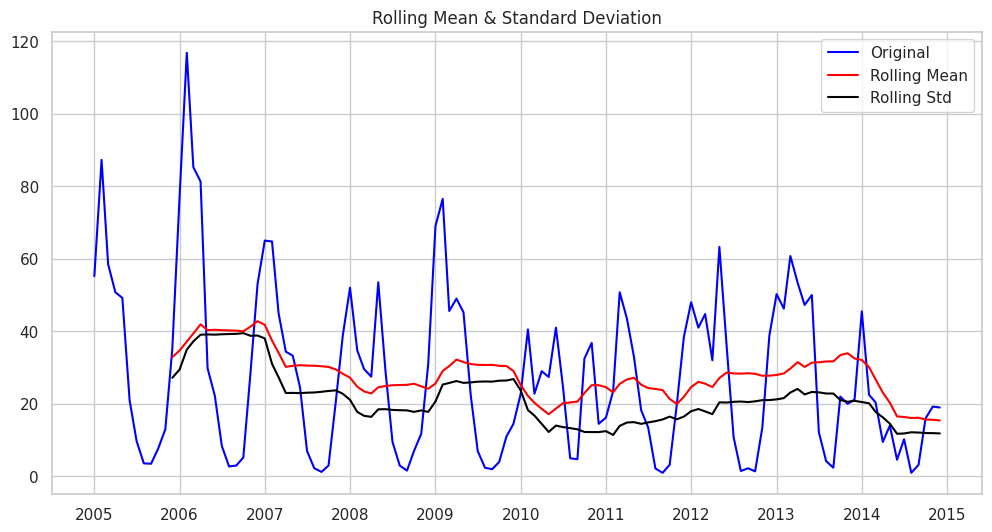

Results of Dickey-Fuller Test: 

Test Statistic                -7.002801e+00
p-value                        7.248808e-10
#Lags Used                     5.000000e+00
Number of Observations Used    1.140000e+02
Critical Value (1%)           -3.489058e+00
Critical Value (5%)           -2.887246e+00
Critical Value (10%)          -2.580481e+00
dtype: float64

Checking stationarity for column: SZABOLCS


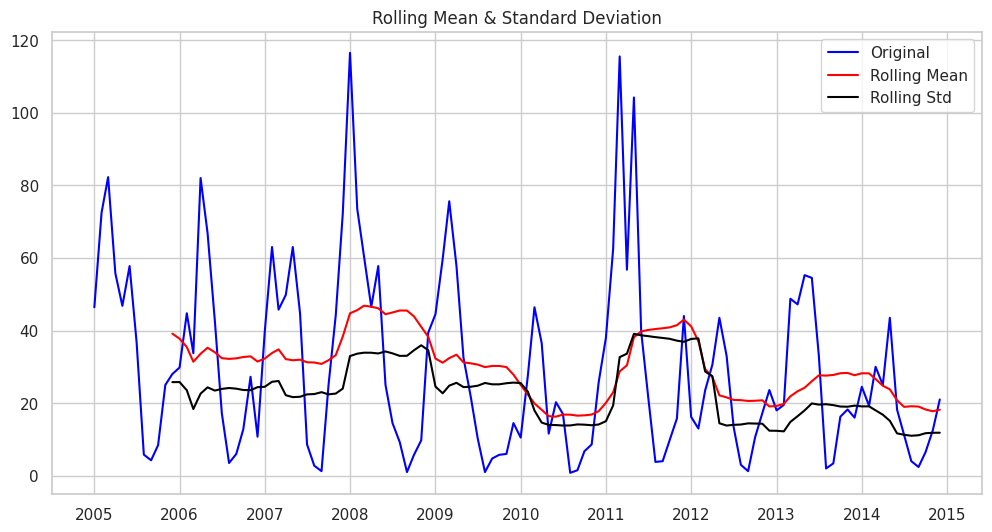

Results of Dickey-Fuller Test: 

Test Statistic                -6.320528e+00
p-value                        3.074148e-08
#Lags Used                     3.000000e+00
Number of Observations Used    1.160000e+02
Critical Value (1%)           -3.488022e+00
Critical Value (5%)           -2.886797e+00
Critical Value (10%)          -2.580241e+00
dtype: float64

Checking stationarity for column: TOLNA


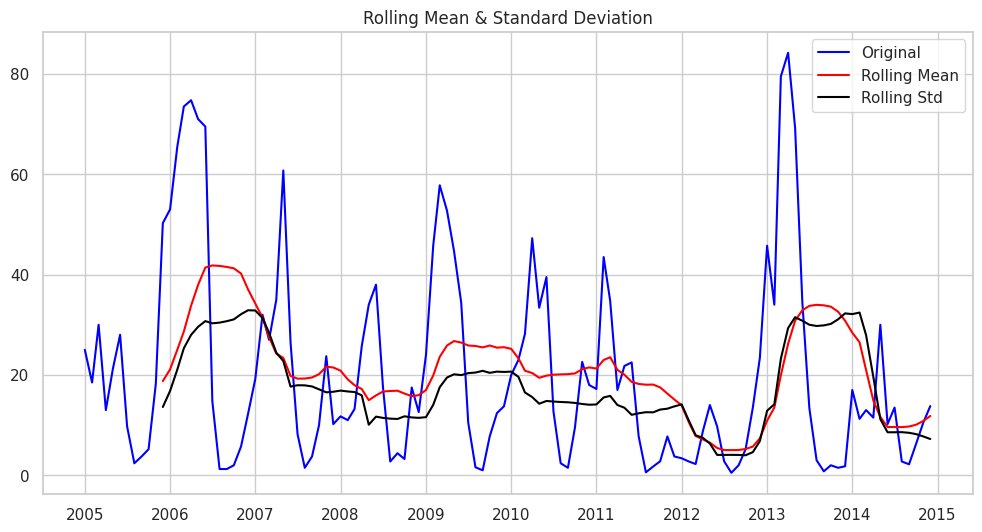

Results of Dickey-Fuller Test: 

Test Statistic                  -5.361079
p-value                          0.000004
#Lags Used                       2.000000
Number of Observations Used    117.000000
Critical Value (1%)             -3.487517
Critical Value (5%)             -2.886578
Critical Value (10%)            -2.580124
dtype: float64

Checking stationarity for column: VAS


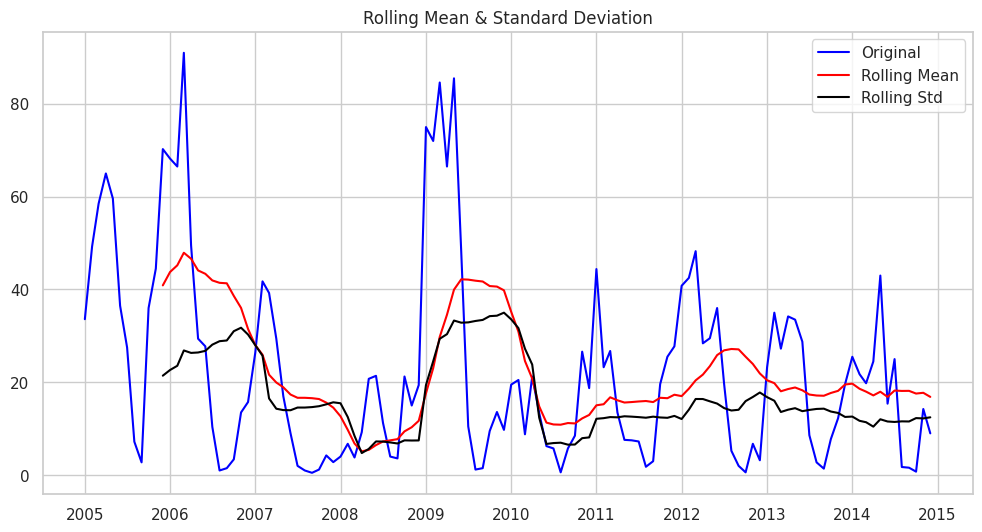

Results of Dickey-Fuller Test: 

Test Statistic                  -2.423996
p-value                          0.135078
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64

Checking stationarity for column: VESZPREM


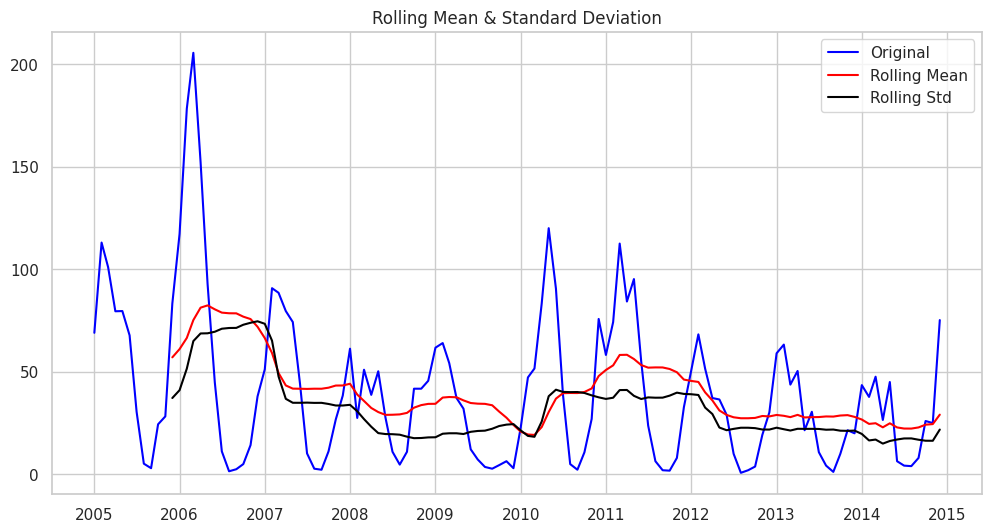

Results of Dickey-Fuller Test: 

Test Statistic                  -2.325385
p-value                          0.163912
#Lags Used                       8.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64

Checking stationarity for column: ZALA


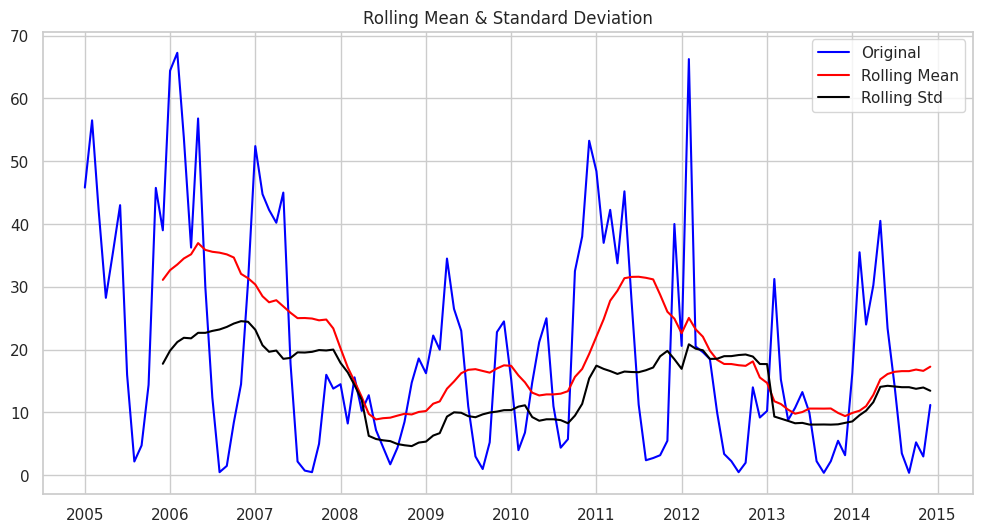

Results of Dickey-Fuller Test: 

Test Statistic                  -2.467671
p-value                          0.123540
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64



In [44]:
verdict_dict = {}
for column in temporal_monthly_mean.columns:
    print(f"Checking stationarity for column: {column}")
    verdict = stationarity_check(temporal_monthly_mean[column], w=12)
    verdict_dict[column] = verdict

In [45]:
# Overall verdicts
verdict_dict

{'BUDAPEST': 'The data is stationary',
 'BARANYA': 'The data is stationary',
 'BACS': 'The data is non-stationary',
 'BEKES': 'The data is stationary',
 'BORSOD': 'The data is stationary',
 'CSONGRAD': 'The data is non-stationary',
 'FEJER': 'The data is stationary',
 'GYOR': 'The data is non-stationary',
 'HAJDU': 'The data is stationary',
 'HEVES': 'The data is stationary',
 'JASZ': 'The data is stationary',
 'KOMAROM': 'The data is non-stationary',
 'NOGRAD': 'The data is non-stationary',
 'PEST': 'The data is non-stationary',
 'SOMOGY': 'The data is stationary',
 'SZABOLCS': 'The data is stationary',
 'TOLNA': 'The data is stationary',
 'VAS': 'The data is non-stationary',
 'VESZPREM': 'The data is non-stationary',
 'ZALA': 'The data is non-stationary'}

In [46]:
stationary = []
non_stationary = []
# Looping through each of the verdicts
for key, val in verdict_dict.items():
    
    # stationary columns
    if val == 'The data is stationary':
        stationary.append(key)
     
    # Non-stationary columns    
    else:
        non_stationary.append(key)
        
        
# Preview
print(f"Counties that have stationary data: {stationary} totalling to {len(stationary)} counties of the {len(verdict_dict)} ")
print(f"Counties that have non-stationary data: {non_stationary} totalling to {len(non_stationary)} counties of the {len(verdict_dict)}")

Counties that have stationary data: ['BUDAPEST', 'BARANYA', 'BEKES', 'BORSOD', 'FEJER', 'HAJDU', 'HEVES', 'JASZ', 'SOMOGY', 'SZABOLCS', 'TOLNA'] totalling to 11 counties of the 20 
Counties that have non-stationary data: ['BACS', 'CSONGRAD', 'GYOR', 'KOMAROM', 'NOGRAD', 'PEST', 'VAS', 'VESZPREM', 'ZALA'] totalling to 9 counties of the 20


The counties that are non-stationary first have to be made stationary for them to undergo data modelling.

## Autocorrelation

In [47]:
# Get the list of column names
column_names = temporal_monthly_mean.columns

# Create an empty dictionary to store the autocorrelation results and conclusions
autocorr_results = {}

# Iterate over each column
for column in column_names:
    # Compute the lagged autocorrelation for the column
    autocorr_values = [temporal_monthly_mean[column].autocorr(lag) for lag in range(1, len(temporal_monthly_mean[column]))]
    
    # Store the autocorrelation values in the dictionary
    autocorr_results[column] = autocorr_values
    
    # Determine the conclusion based on the autocorrelation values
    if all(abs(ac) < 0.5 for ac in autocorr_values):
        conclusion = 'No significant autocorrelation'
    else:
        conclusion = 'Significant autocorrelation'
    
    # Store the conclusion in the dictionary
    autocorr_results[column + '_conclusion'] = conclusion

# Convert the dictionary into a DataFrame
autocorr_df = pd.DataFrame(autocorr_results)

# Print the autocorrelation results and conclusions for each column
autocorr_df

,BUDAPEST,BUDAPEST_conclusion,BARANYA,BARANYA_conclusion,BACS,BACS_conclusion,BEKES,BEKES_conclusion,BORSOD,BORSOD_conclusion,...,SZABOLCS,SZABOLCS_conclusion,TOLNA,TOLNA_conclusion,VAS,VAS_conclusion,VESZPREM,VESZPREM_conclusion,ZALA,ZALA_conclusion
0,0.740744,Significant autocorrelation,0.749663,Significant autocorrelation,0.732218,Significant autocorrelation,0.823320,Significant autocorrelation,0.678384,Significant autocorrelation,...,0.699987,Significant autocorrelation,0.785547,Significant autocorrelation,0.796358,Significant autocorrelation,0.818340,Significant autocorrelation,0.718146,Significant autocorrelation
1,0.384974,Significant autocorrelation,0.408569,Significant autocorrelation,0.328121,Significant autocorrelation,0.628319,Significant autocorrelation,0.414359,Significant autocorrelation,...,0.427565,Significant autocorrelation,0.509947,Significant autocorrelation,0.583141,Significant autocorrelation,0.526689,Significant autocorrelation,0.494839,Significant autocorrelation
2,-0.036616,Significant autocorrelation,0.101510,Significant autocorrelation,-0.021454,Significant autocorrelation,0.348913,Significant autocorrelation,0.055327,Significant autocorrelation,...,0.090294,Significant autocorrelation,0.212818,Significant autocorrelation,0.309928,Significant autocorrelation,0.152208,Significant autocorrelation,0.213449,Significant autocorrelation
3,-0.348372,Significant autocorrelation,-0.204742,Significant autocorrelation,-0.274570,Significant autocorrelation,0.059881,Significant autocorrelation,-0.278491,Significant autocorrelation,...,-0.191646,Significant autocorrelation,-0.056565,Significant autocorrelation,0.040980,Significant autocorrelation,-0.188588,Significant autocorrelation,0.004745,Significant autocorrelation
4,-0.571790,Significant autocorrelation,-0.457300,Significant autocorrelation,-0.400807,Significant autocorrelation,-0.192977,Significant autocorrelation,-0.514905,Significant autocorrelation,...,-0.389064,Significant autocorrelation,-0.258181,Significant autocorrelation,-0.180855,Significant autocorrelation,-0.416056,Significant autocorrelation,-0.166844,Significant autocorrelation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,-0.252943,Significant autocorrelation,-0.124939,Significant autocorrelation,0.682921,Significant autocorrelation,-0.009296,Significant autocorrelation,-0.900929,Significant autocorrelation,...,-0.502496,Significant autocorrelation,-0.300054,Significant autocorrelation,0.647592,Significant autocorrelation,-0.215548,Significant autocorrelation,-0.499757,Significant autocorrelation
115,-0.843493,Significant autocorrelation,-0.186412,Significant autocorrelation,0.726879,Significant autocorrelation,-0.155198,Significant autocorrelation,-0.484179,Significant autocorrelation,...,0.149009,Significant autocorrelation,-0.383780,Significant autocorrelation,0.720051,Significant autocorrelation,-0.096941,Significant autocorrelation,-0.616898,Significant autocorrelation
116,-0.971675,Significant autocorrelation,-0.084909,Significant autocorrelation,0.999898,Significant autocorrelation,0.169483,Significant autocorrelation,0.533038,Significant autocorrelation,...,0.937060,Significant autocorrelation,0.367124,Significant autocorrelation,0.716325,Significant autocorrelation,0.236946,Significant autocorrelation,-0.859341,Significant autocorrelation
117,-1.000000,Significant autocorrelation,1.000000,Significant autocorrelation,1.000000,Significant autocorrelation,1.000000,Significant autocorrelation,1.000000,Significant autocorrelation,...,1.000000,Significant autocorrelation,-1.000000,Significant autocorrelation,-1.000000,Significant autocorrelation,1.000000,Significant autocorrelation,1.000000,Significant autocorrelation


Significant autocorrelation suggests that the past values of the series have an influence on the current values. This can indicate the presence of a trend or a seasonal pattern in the data. It implies that the values are not independent and there is some persistence or pattern in the time series.

The presence of significant autocorrelation can impact the modeling process. It indicates that the time series data may not satisfy the assumption of independence, which is commonly assumed in many statistical models.

It is important that the study deals with this non-stationarity issue.

### Dealing with Non-Stationarity
#### Seasonal Decompose


In [48]:
def decompose_and_store(data):
    decomposition_dict = {}

    # Iterate over each column in the data
    for column in data.columns:
        # Perform STL decomposition
        stl = STL(data[column], seasonal=13)
        result = stl.fit()

        # Store the components in the dictionary for the column
        decomposition_dict[column] = {
            'trend': result.trend,
            'seasonal': result.seasonal,
            'residual': result.resid
        }

    return decomposition_dict

# Usage
decomposition_results = decompose_and_store(temporal_monthly_mean)

print(decomposition_results)

{'BUDAPEST': {'trend': Date
2005-01-01    64.401096
2005-02-01    68.406192
2005-03-01    72.498653
2005-04-01    76.630606
2005-05-01    80.754545
                ...    
2014-08-01    86.693038
2014-09-01    88.144784
2014-10-01    89.643846
2014-11-01    91.170234
2014-12-01    92.711379
Freq: MS, Name: trend, Length: 120, dtype: float64, 'seasonal': Date
2005-01-01    49.473413
2005-02-01    48.212246
2005-03-01    59.175995
2005-04-01    76.777076
2005-05-01    94.197889
                ...    
2014-08-01   -70.447856
2014-09-01   -74.289033
2014-10-01   -65.127363
2014-11-01   -33.208764
2014-12-01   -10.504551
Freq: MS, Name: season, Length: 120, dtype: float64, 'residual': Date
2005-01-01    27.325492
2005-02-01    23.631562
2005-03-01    -8.674647
2005-04-01   -31.407682
2005-05-01   -41.752434
                ...    
2014-08-01    -1.245181
2014-09-01    -1.455751
2014-10-01     0.483517
2014-11-01   -13.461470
2014-12-01    10.193172
Freq: MS, Name: resid, Length: 120, dtype

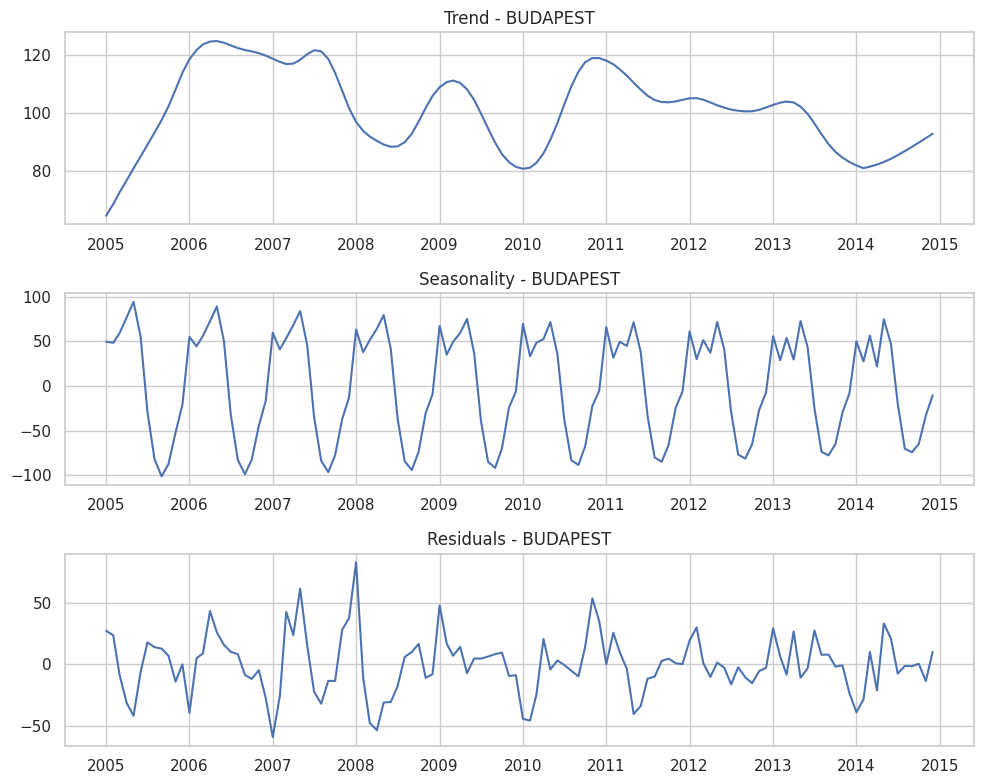

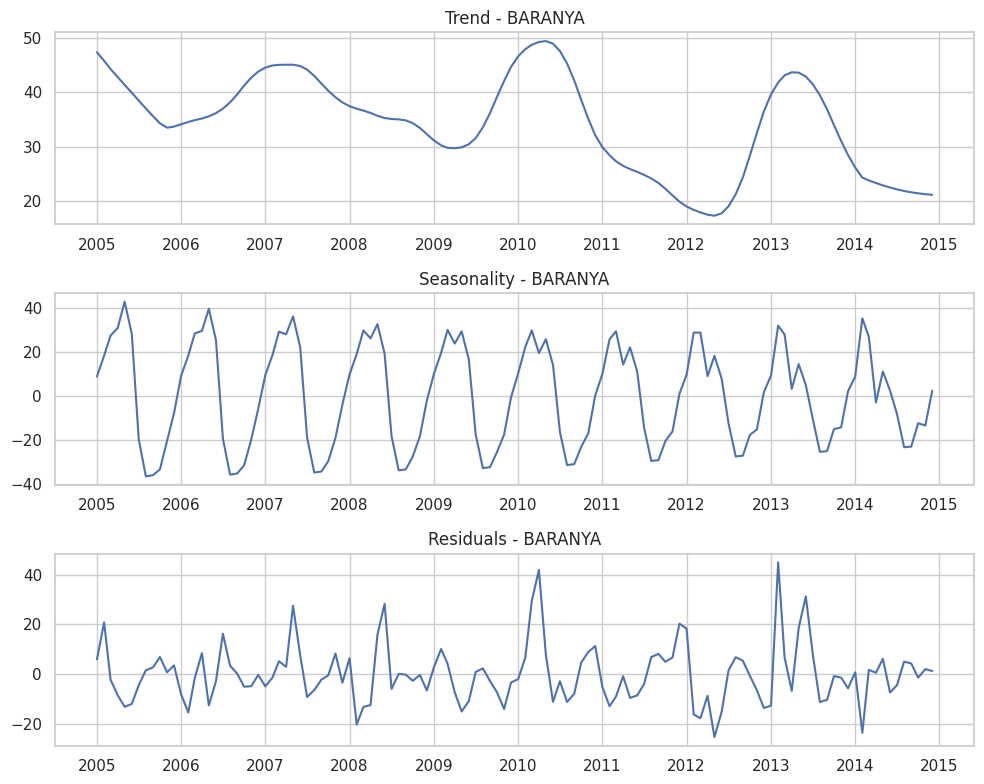

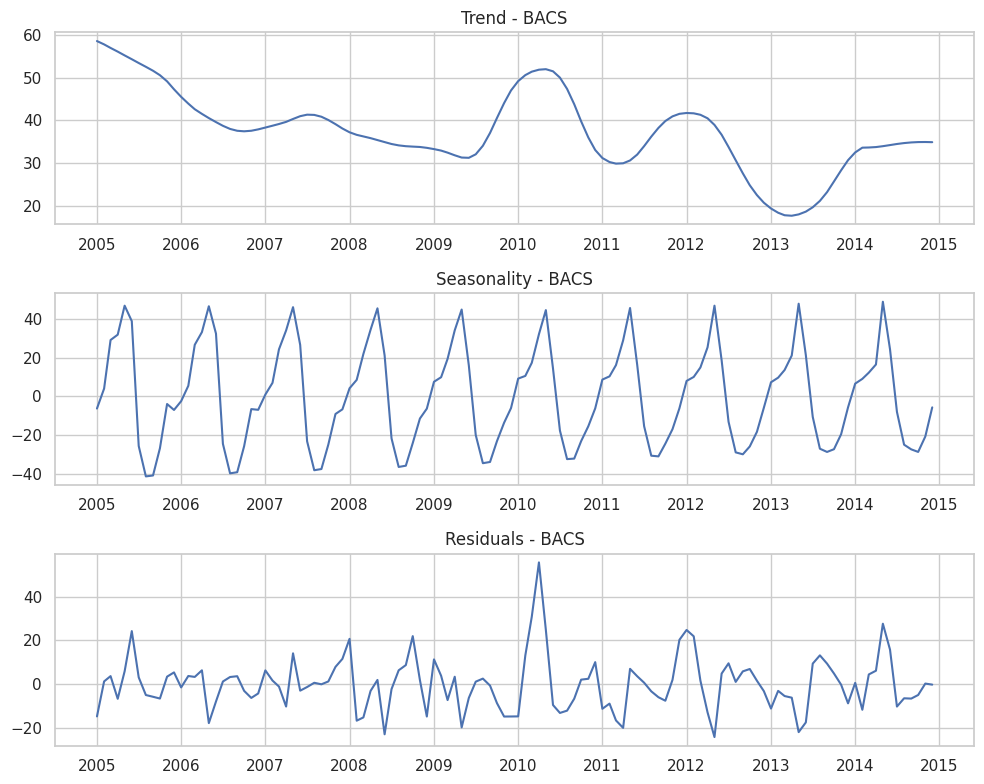

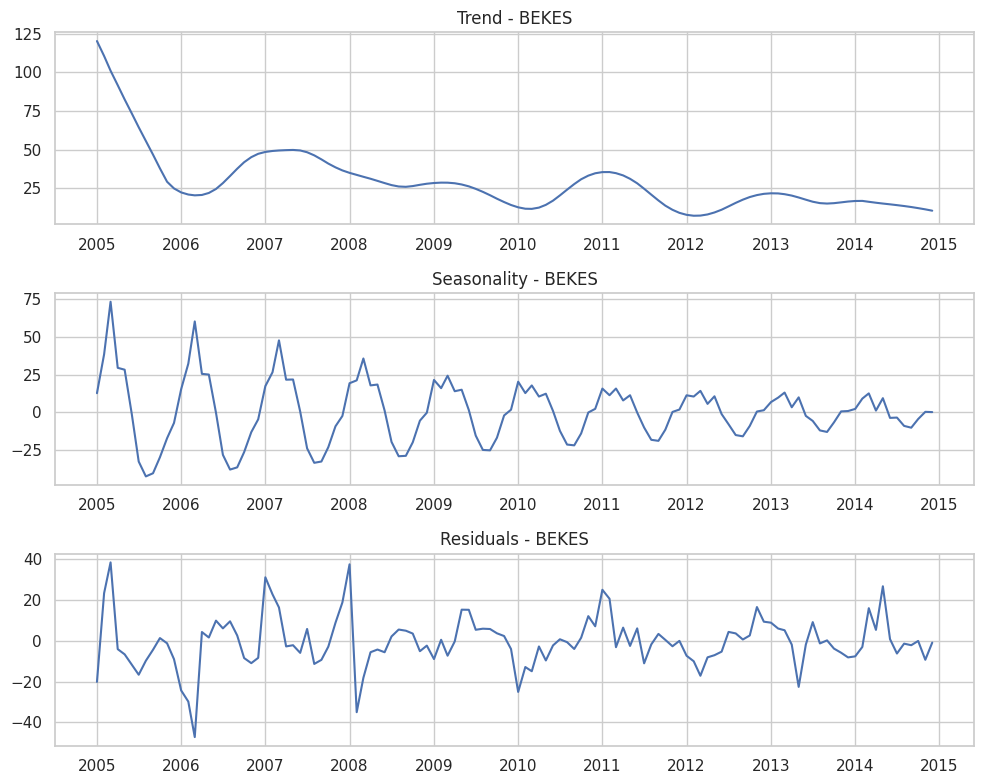

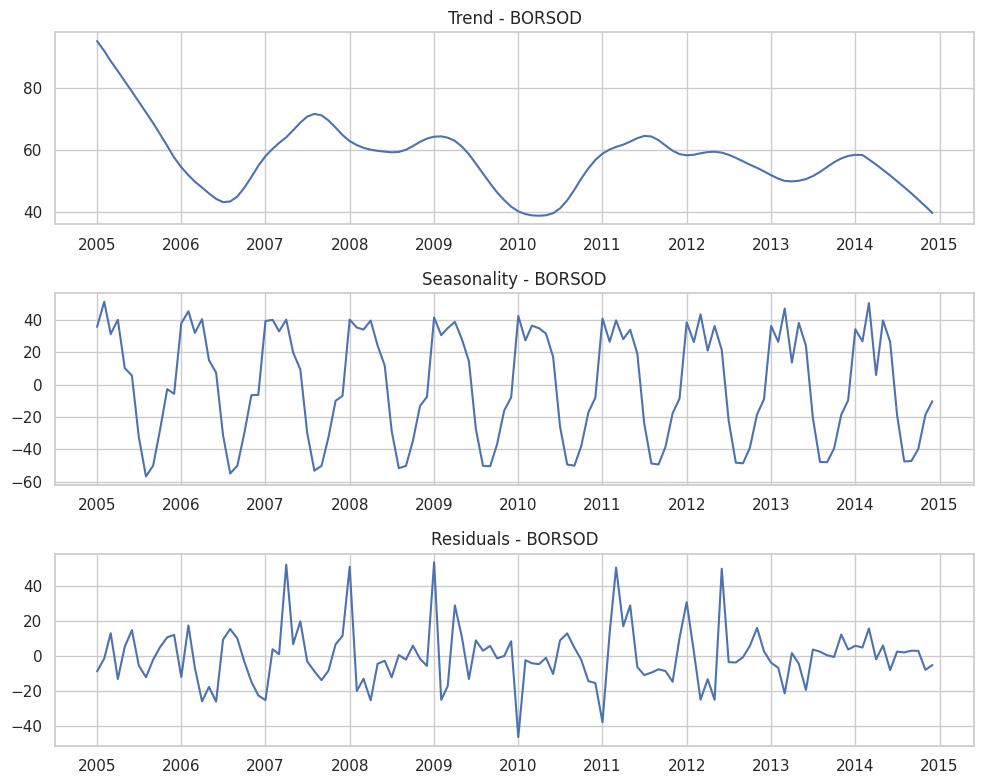

...

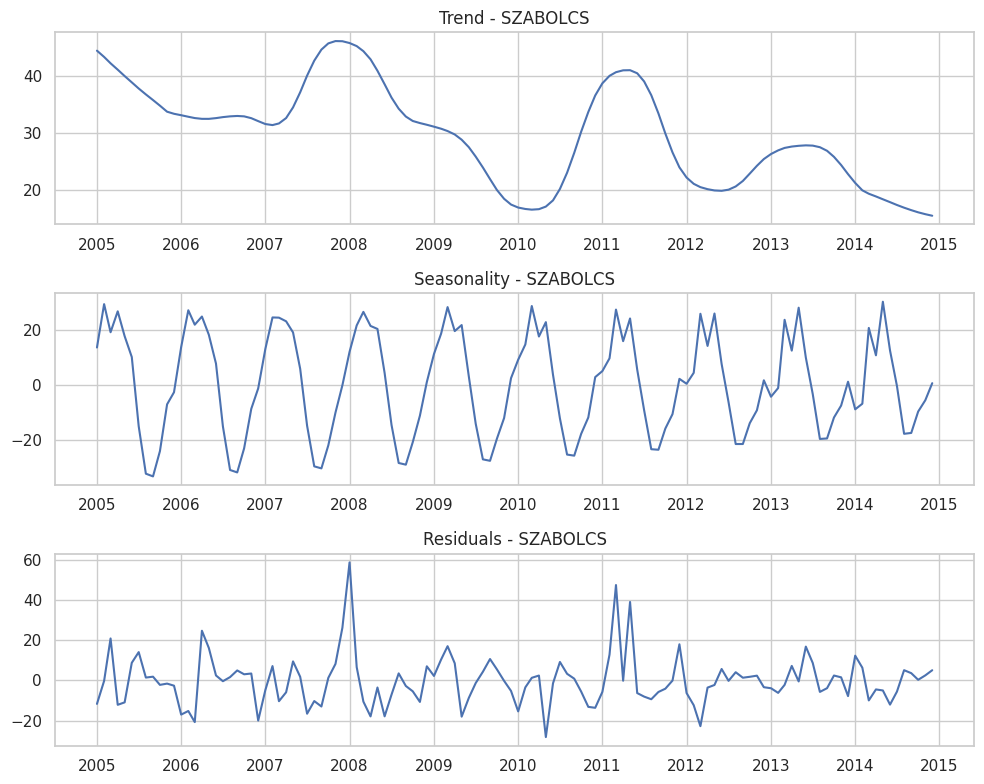

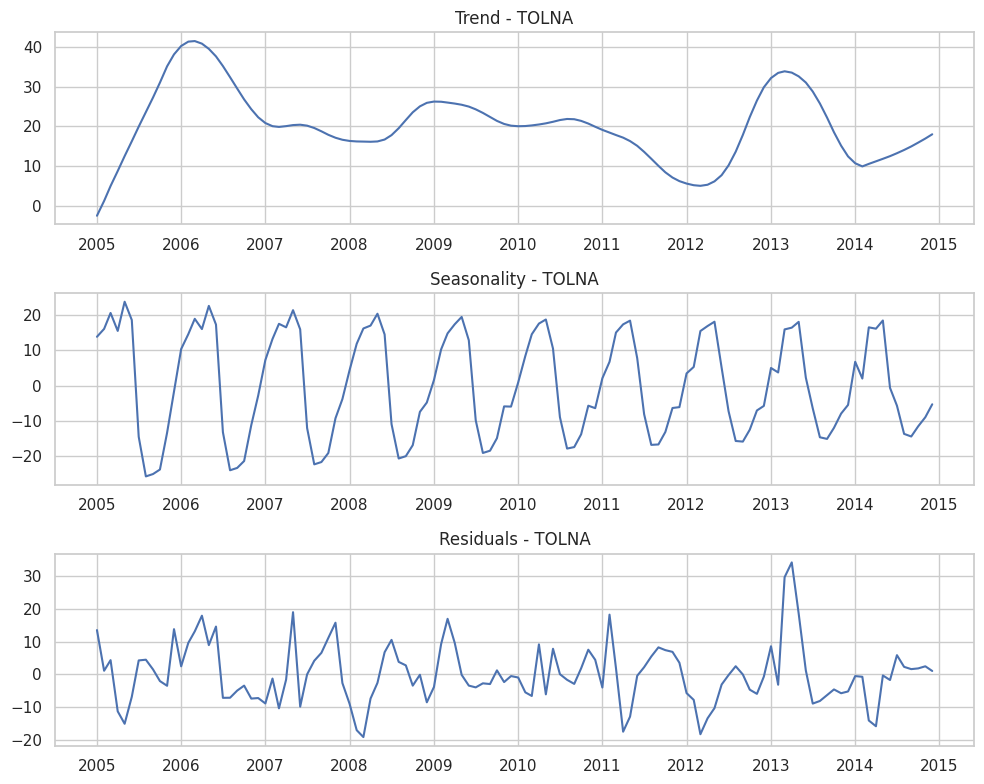

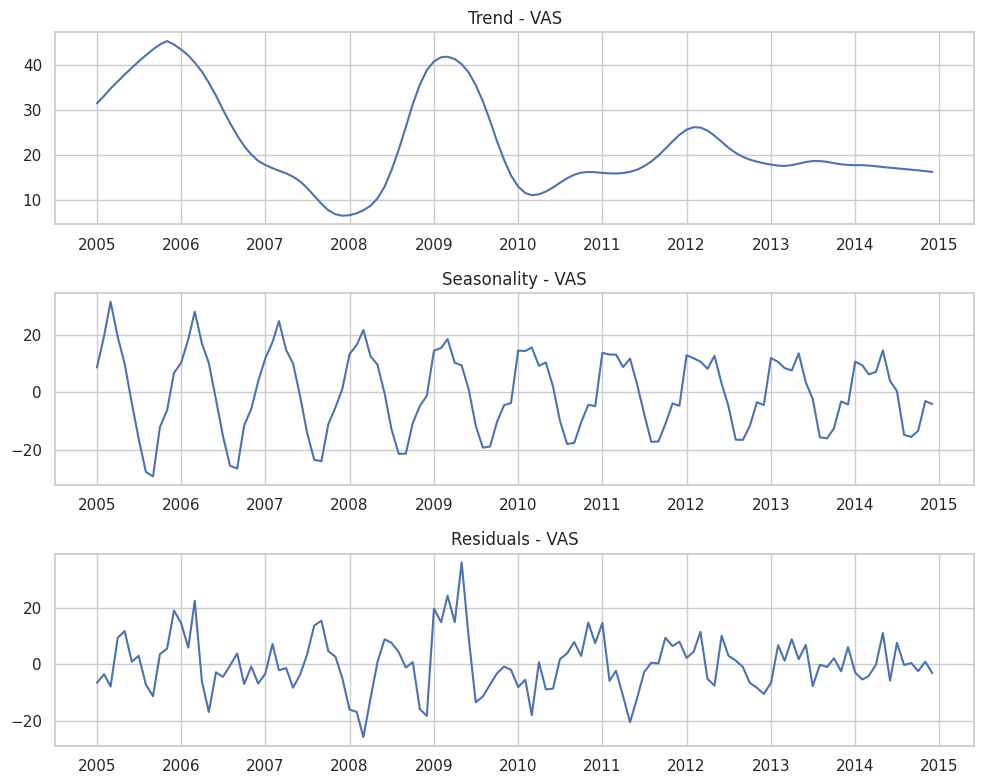

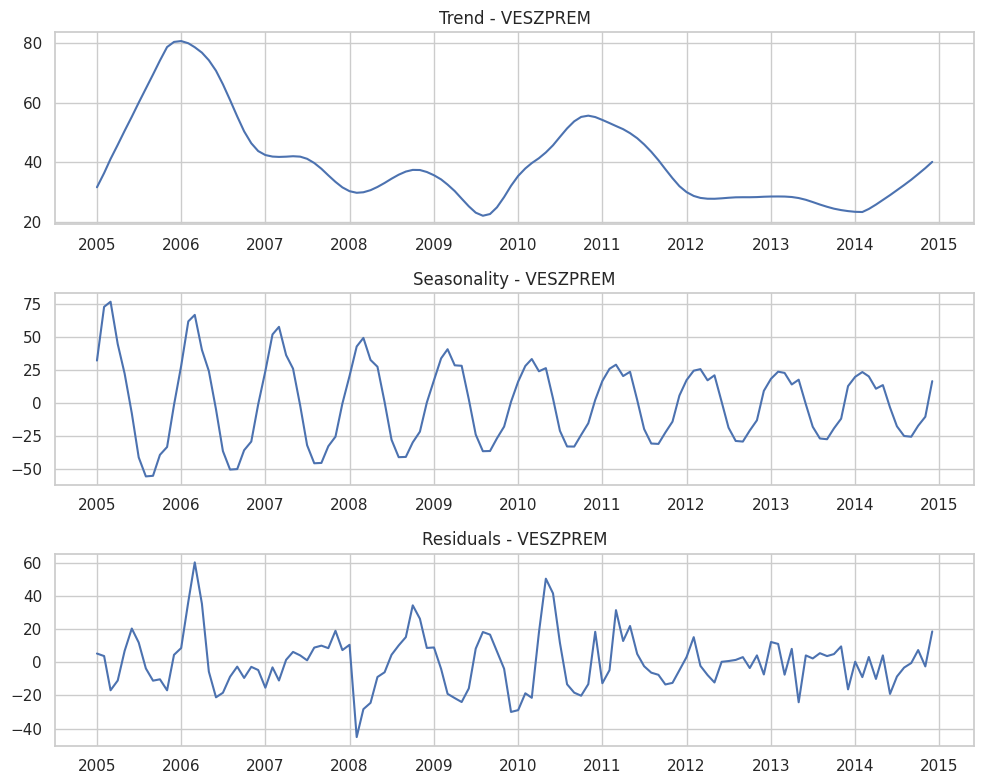

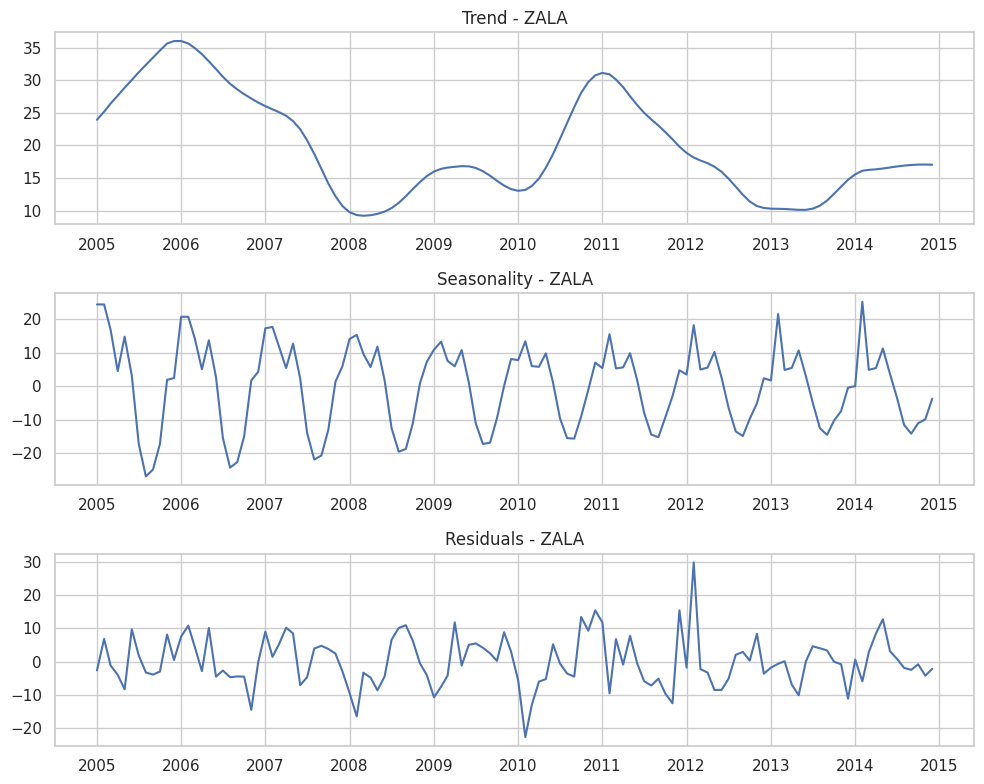

In [49]:
# Iterate through the dictionary of decomposition results
for column, decomposition in decomposition_results.items():
    # Extract the components
    trend = decomposition['trend']
    seasonal = decomposition['seasonal']
    residuals = decomposition['residual']
    
    # Create subplots for each component
    fig, axes = plt.subplots(3, 1, figsize=(10, 8))
    
    # Plot the trend component
    axes[0].plot(trend)
    axes[0].set_title(f"Trend - {column}")
    
    # Plot the seasonal component
    axes[1].plot(seasonal)
    axes[1].set_title(f"Seasonality - {column}")
    
    # Plot the residuals component
    axes[2].plot(residuals)
    axes[2].set_title(f"Residuals - {column}")
    
    # Adjust spacing between subplots
    plt.tight_layout()
    
    # Show the plot
    plt.show()


#### Check for stationarity of the residual component

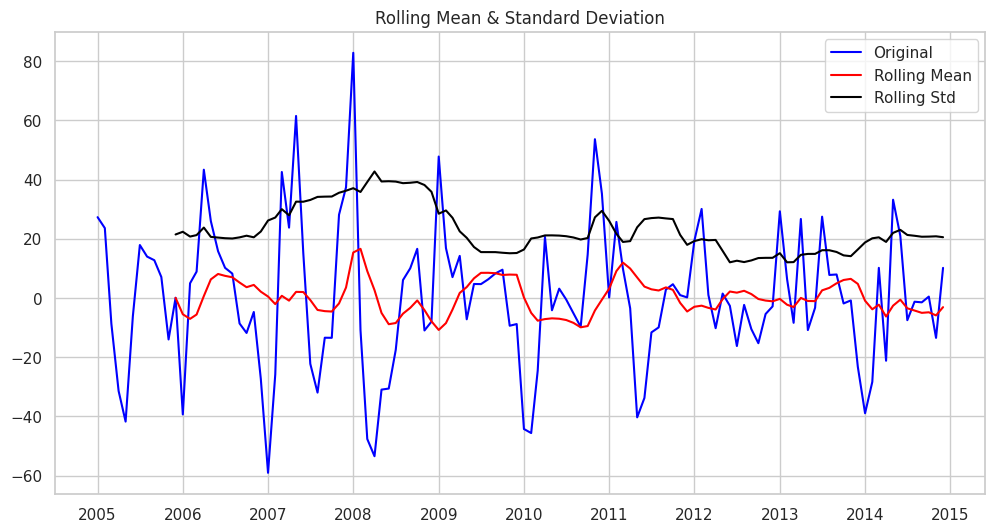

Results of Dickey-Fuller Test: 

Test Statistic                -5.679964e+00
p-value                        8.531085e-07
#Lags Used                     1.100000e+01
Number of Observations Used    1.080000e+02
Critical Value (1%)           -3.492401e+00
Critical Value (5%)           -2.888697e+00
Critical Value (10%)          -2.581255e+00
dtype: float64

Stationarity check for BUDAPEST: The data is stationary


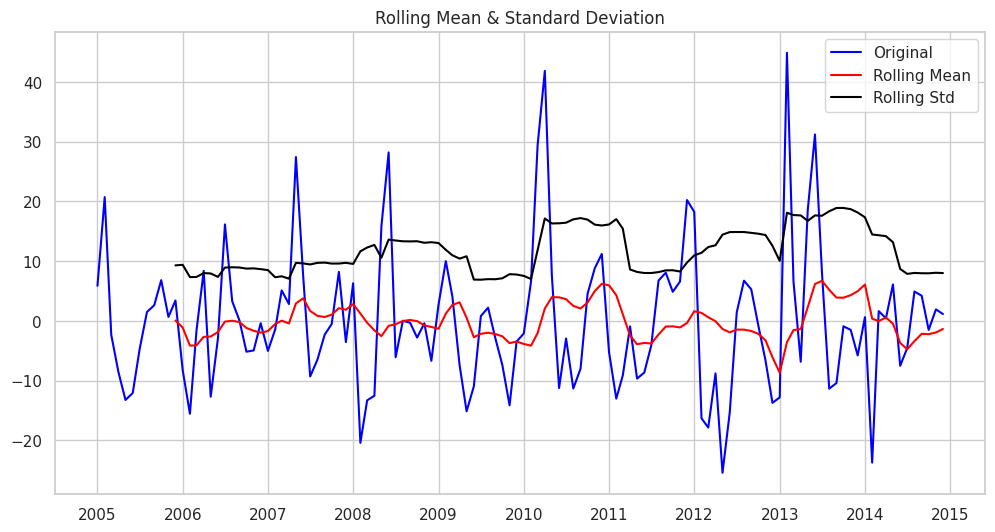

Results of Dickey-Fuller Test: 

Test Statistic                -8.278541e+00
p-value                        4.585876e-13
#Lags Used                     1.000000e+00
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64

Stationarity check for BARANYA: The data is stationary


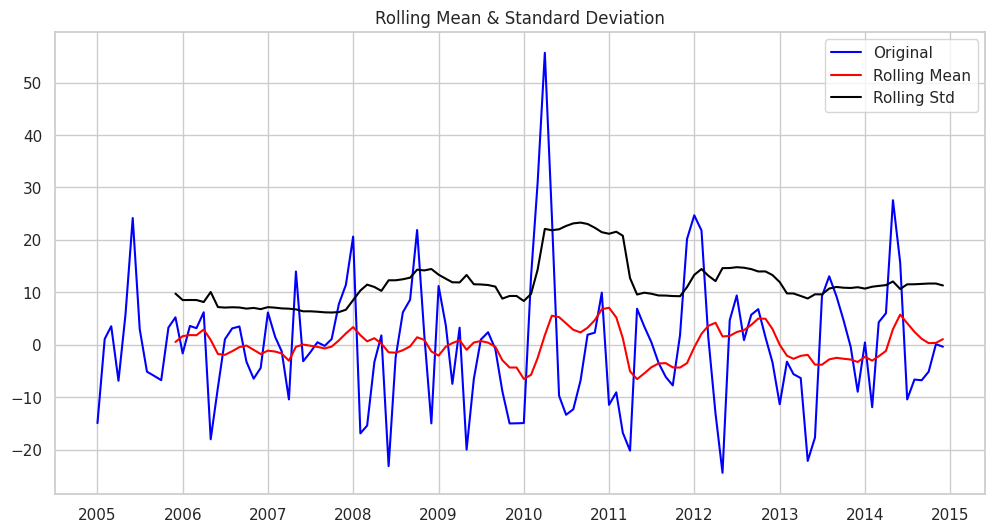

Results of Dickey-Fuller Test: 

Test Statistic                -7.429631e+00
p-value                        6.411434e-11
#Lags Used                     3.000000e+00
Number of Observations Used    1.160000e+02
Critical Value (1%)           -3.488022e+00
Critical Value (5%)           -2.886797e+00
Critical Value (10%)          -2.580241e+00
dtype: float64

Stationarity check for BACS: The data is stationary


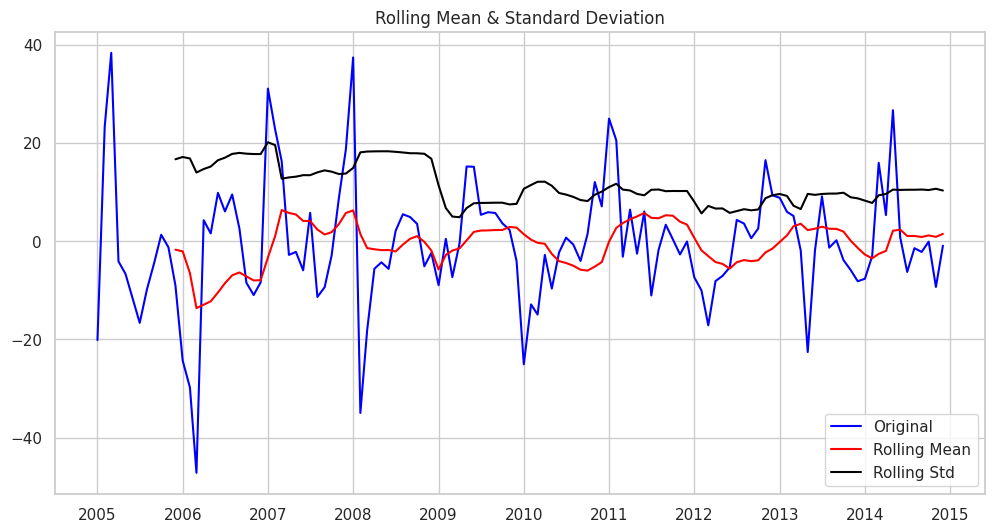

Results of Dickey-Fuller Test: 

Test Statistic                  -5.204817
p-value                          0.000009
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for BEKES: The data is stationary


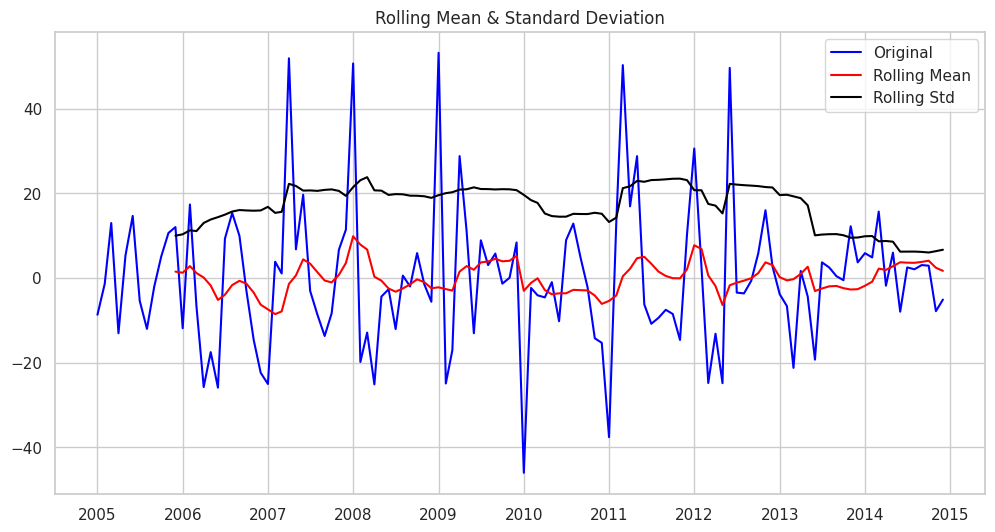

Results of Dickey-Fuller Test: 

Test Statistic                -7.707489e+00
p-value                        1.289968e-11
#Lags Used                     3.000000e+00
Number of Observations Used    1.160000e+02
Critical Value (1%)           -3.488022e+00
Critical Value (5%)           -2.886797e+00
Critical Value (10%)          -2.580241e+00
dtype: float64

Stationarity check for BORSOD: The data is stationary


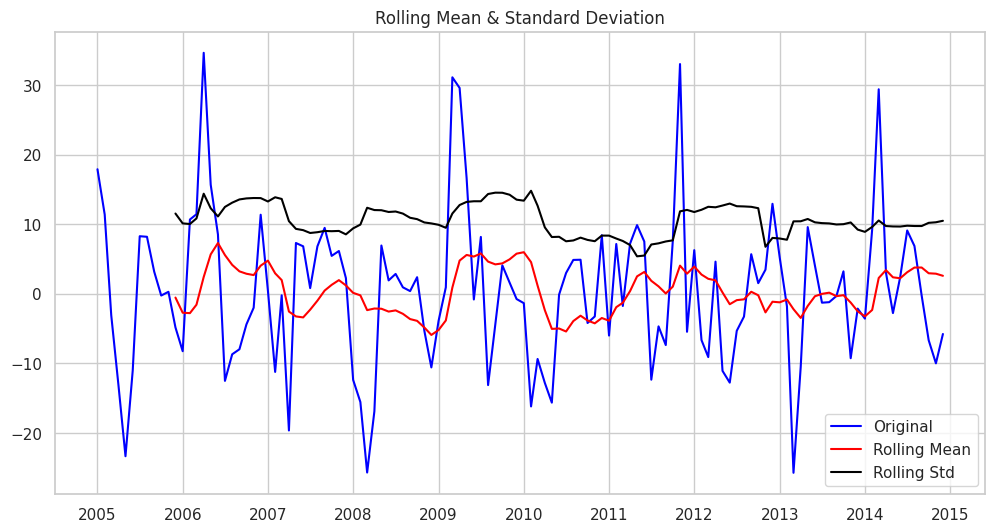

Results of Dickey-Fuller Test: 

Test Statistic                  -5.093480
p-value                          0.000014
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for CSONGRAD: The data is stationary


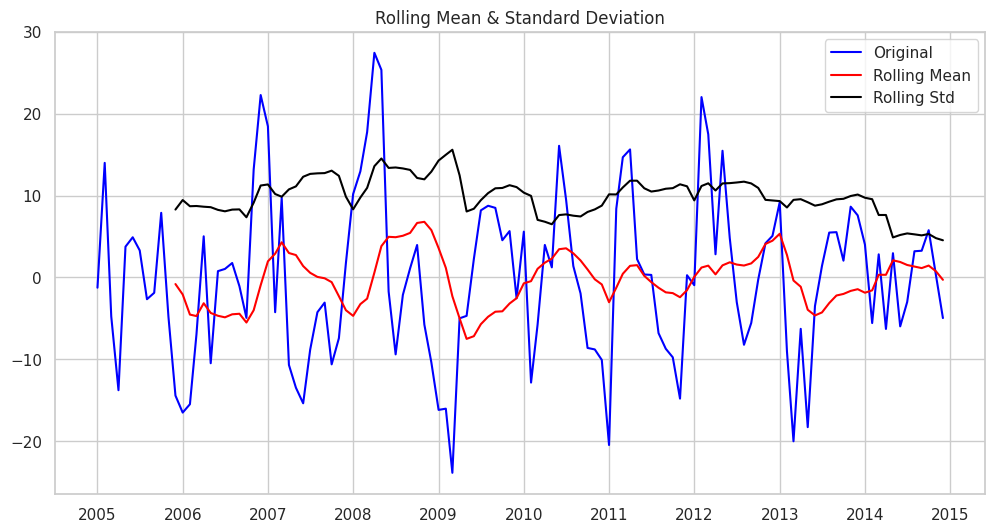

Results of Dickey-Fuller Test: 

Test Statistic                  -5.574438
p-value                          0.000001
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for FEJER: The data is stationary


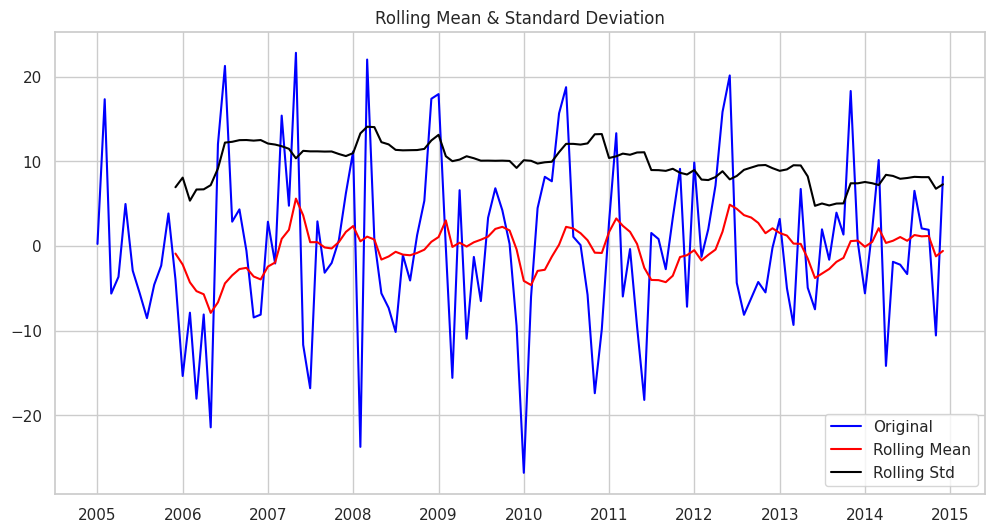

Results of Dickey-Fuller Test: 

Test Statistic                  -4.667303
p-value                          0.000097
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for GYOR: The data is stationary


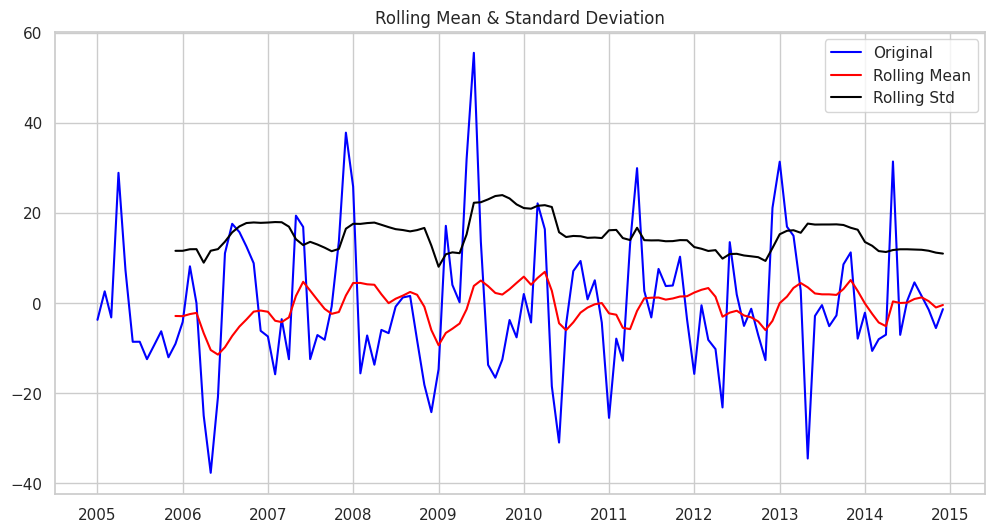

Results of Dickey-Fuller Test: 

Test Statistic                  -5.297174
p-value                          0.000006
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for HAJDU: The data is stationary


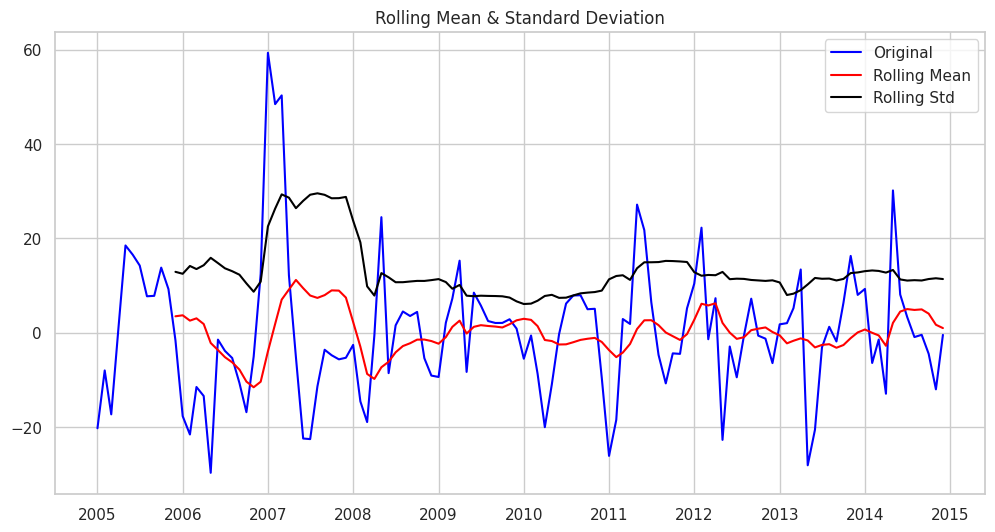

Results of Dickey-Fuller Test: 

Test Statistic                -6.004461e+00
p-value                        1.627967e-07
#Lags Used                     1.100000e+01
Number of Observations Used    1.080000e+02
Critical Value (1%)           -3.492401e+00
Critical Value (5%)           -2.888697e+00
Critical Value (10%)          -2.581255e+00
dtype: float64

Stationarity check for HEVES: The data is stationary


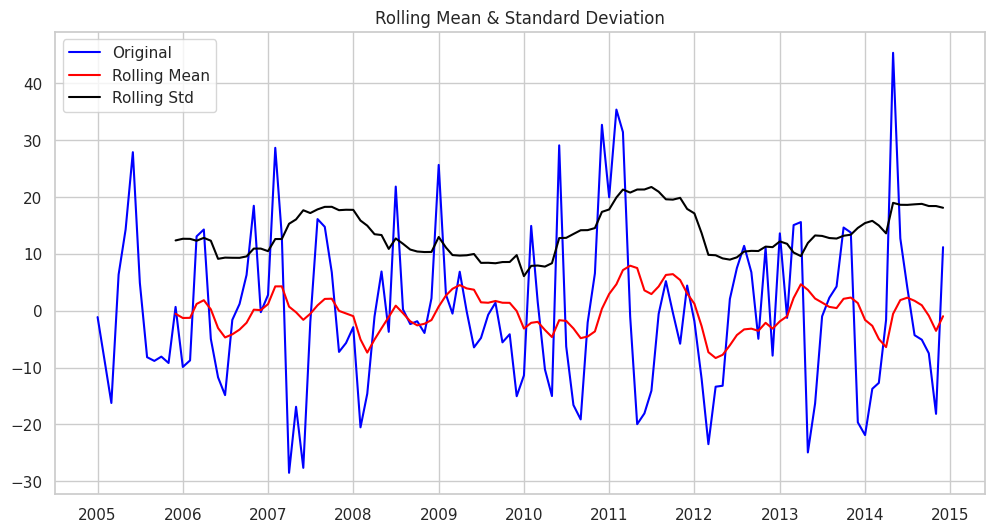

Results of Dickey-Fuller Test: 

Test Statistic                -7.273854e+00
p-value                        1.562914e-10
#Lags Used                     4.000000e+00
Number of Observations Used    1.150000e+02
Critical Value (1%)           -3.488535e+00
Critical Value (5%)           -2.887020e+00
Critical Value (10%)          -2.580360e+00
dtype: float64

Stationarity check for JASZ: The data is stationary


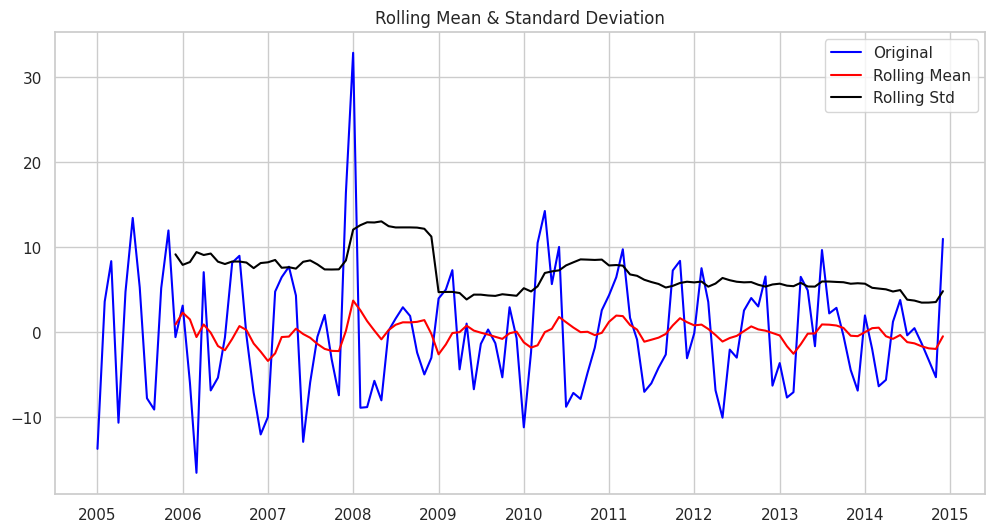

Results of Dickey-Fuller Test: 

Test Statistic                -7.053911e+00
p-value                        5.437058e-10
#Lags Used                     6.000000e+00
Number of Observations Used    1.130000e+02
Critical Value (1%)           -3.489590e+00
Critical Value (5%)           -2.887477e+00
Critical Value (10%)          -2.580604e+00
dtype: float64

Stationarity check for KOMAROM: The data is stationary


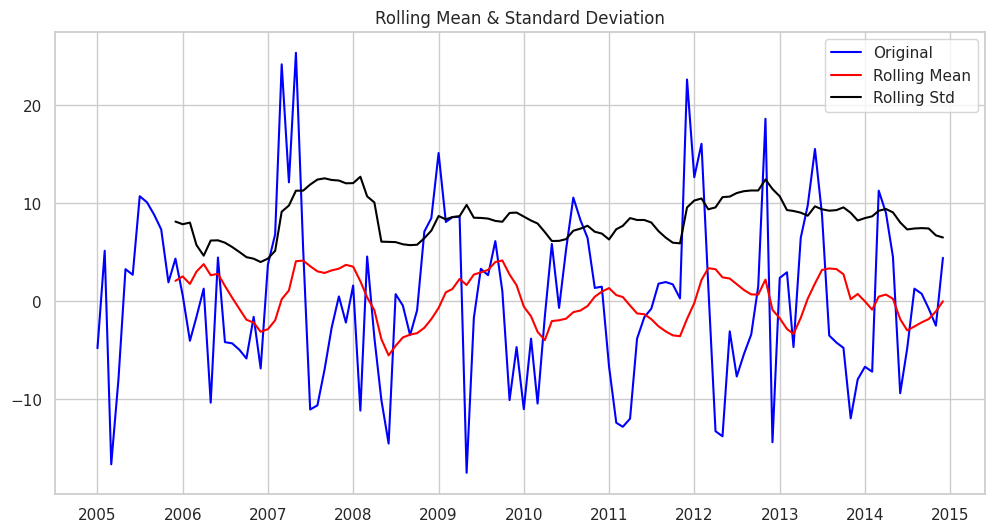

Results of Dickey-Fuller Test: 

Test Statistic                -5.999935e+00
p-value                        1.666685e-07
#Lags Used                     1.100000e+01
Number of Observations Used    1.080000e+02
Critical Value (1%)           -3.492401e+00
Critical Value (5%)           -2.888697e+00
Critical Value (10%)          -2.581255e+00
dtype: float64

Stationarity check for NOGRAD: The data is stationary


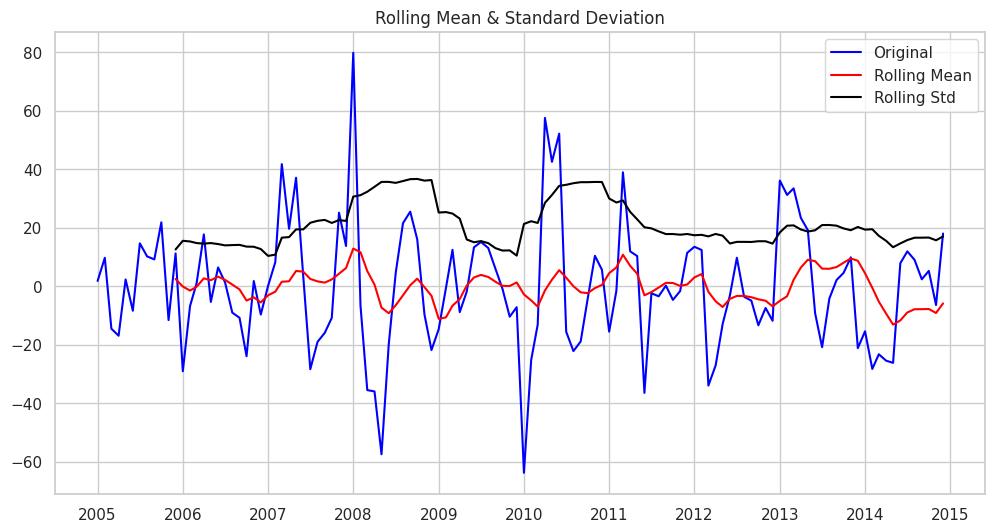

Results of Dickey-Fuller Test: 

Test Statistic                -8.810533e+00
p-value                        1.996992e-14
#Lags Used                     2.000000e+00
Number of Observations Used    1.170000e+02
Critical Value (1%)           -3.487517e+00
Critical Value (5%)           -2.886578e+00
Critical Value (10%)          -2.580124e+00
dtype: float64

Stationarity check for PEST: The data is stationary


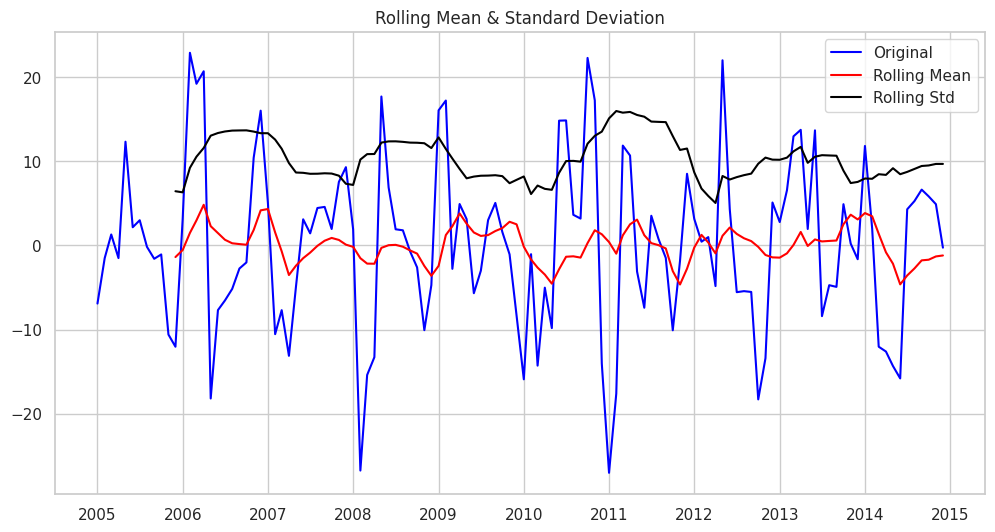

Results of Dickey-Fuller Test: 

Test Statistic                -7.248856e+00
p-value                        1.802091e-10
#Lags Used                     5.000000e+00
Number of Observations Used    1.140000e+02
Critical Value (1%)           -3.489058e+00
Critical Value (5%)           -2.887246e+00
Critical Value (10%)          -2.580481e+00
dtype: float64

Stationarity check for SOMOGY: The data is stationary


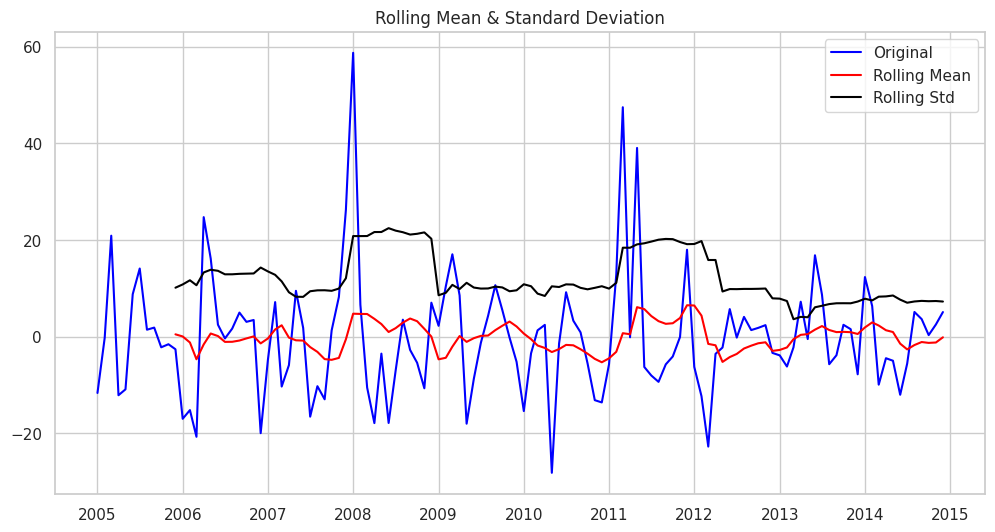

Results of Dickey-Fuller Test: 

Test Statistic                  -5.055787
p-value                          0.000017
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for SZABOLCS: The data is stationary


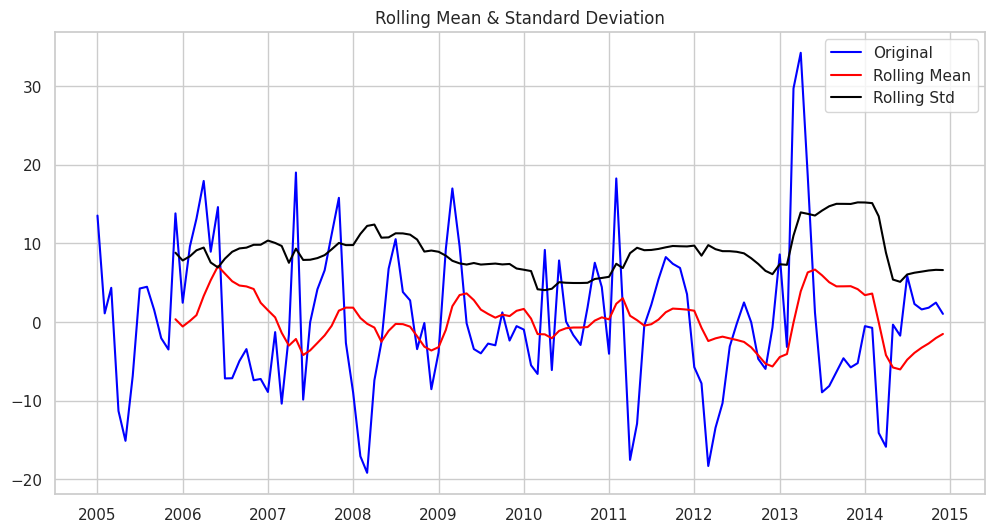

Results of Dickey-Fuller Test: 

Test Statistic                -6.049266e+00
p-value                        1.289298e-07
#Lags Used                     1.100000e+01
Number of Observations Used    1.080000e+02
Critical Value (1%)           -3.492401e+00
Critical Value (5%)           -2.888697e+00
Critical Value (10%)          -2.581255e+00
dtype: float64

Stationarity check for TOLNA: The data is stationary


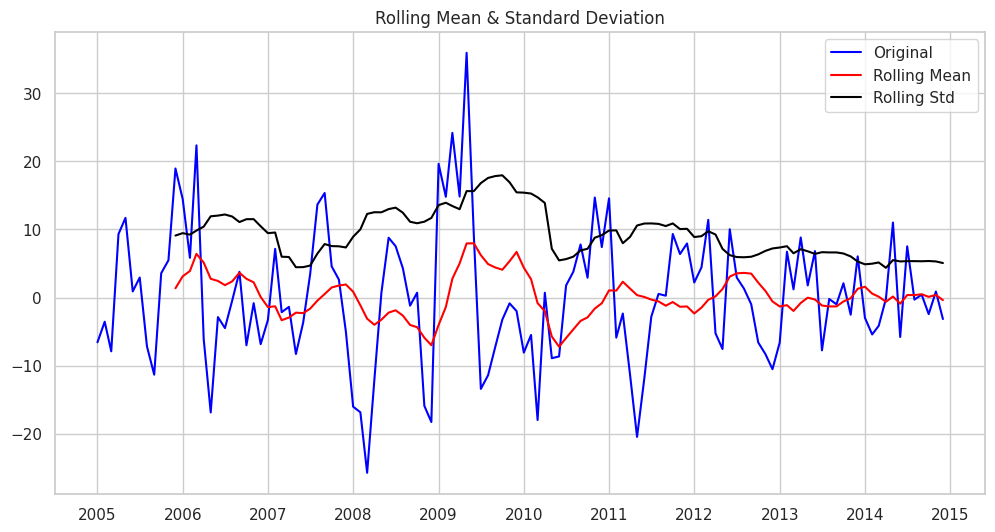

Results of Dickey-Fuller Test: 

Test Statistic                  -5.426235
p-value                          0.000003
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Stationarity check for VAS: The data is stationary


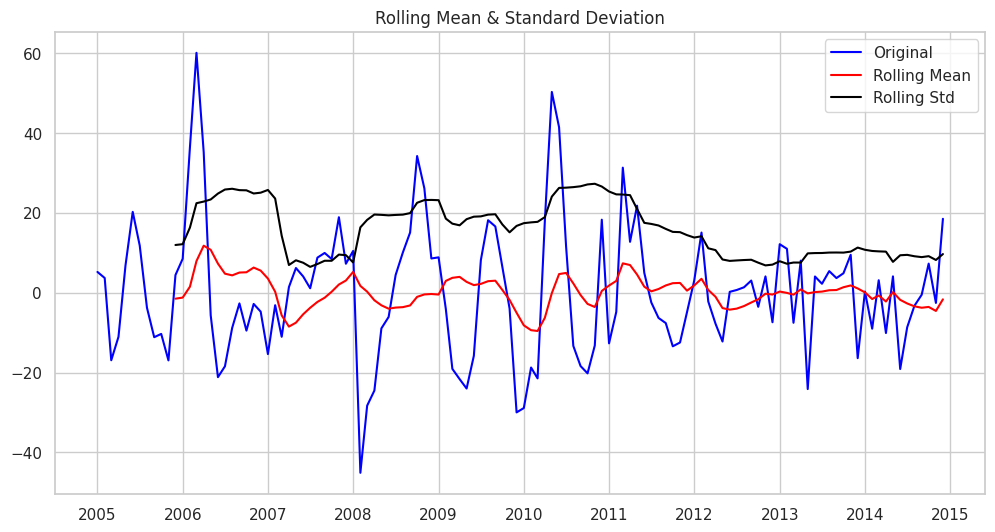

Results of Dickey-Fuller Test: 

Test Statistic                  -4.020250
p-value                          0.001308
#Lags Used                      13.000000
Number of Observations Used    106.000000
Critical Value (1%)             -3.493602
Critical Value (5%)             -2.889217
Critical Value (10%)            -2.581533
dtype: float64

Stationarity check for VESZPREM: The data is stationary


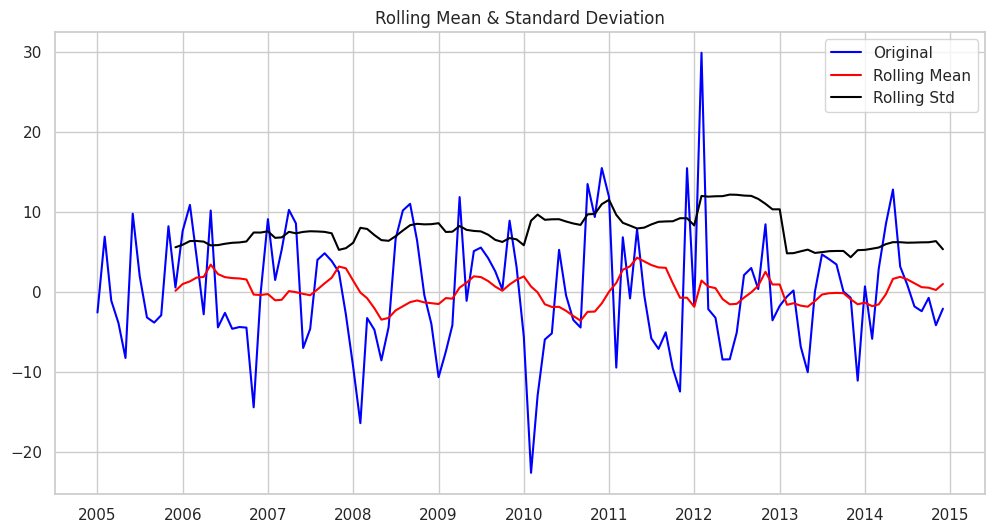

Results of Dickey-Fuller Test: 

Test Statistic                  -4.924106
p-value                          0.000031
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64

Stationarity check for ZALA: The data is stationary


In [50]:
# Iterate through the dictionary of decomposition results
new_verdict = {}
for column, decomposition in decomposition_results.items():
    # Extract the components
    trend = decomposition['trend']
    seasonal = decomposition['seasonal']
    residuals = decomposition['residual']
    
    # Check for stationarity of the residuals
    stationarity_result = stationarity_check(residuals, w=12)
    new_verdict[column] = stationarity_result
    print(f"Stationarity check for {column}: {stationarity_result}")

In [51]:
# Preview the new verdict
new_verdict

{'BUDAPEST': 'The data is stationary',
 'BARANYA': 'The data is stationary',
 'BACS': 'The data is stationary',
 'BEKES': 'The data is stationary',
 'BORSOD': 'The data is stationary',
 'CSONGRAD': 'The data is stationary',
 'FEJER': 'The data is stationary',
 'GYOR': 'The data is stationary',
 'HAJDU': 'The data is stationary',
 'HEVES': 'The data is stationary',
 'JASZ': 'The data is stationary',
 'KOMAROM': 'The data is stationary',
 'NOGRAD': 'The data is stationary',
 'PEST': 'The data is stationary',
 'SOMOGY': 'The data is stationary',
 'SZABOLCS': 'The data is stationary',
 'TOLNA': 'The data is stationary',
 'VAS': 'The data is stationary',
 'VESZPREM': 'The data is stationary',
 'ZALA': 'The data is stationary'}

All the values that were non-stationary have now been made stationary.

## County Modelling
### SARIMAX

In [52]:
# Train_test_split
train_data = temporal_df.loc['2005-01-01':'2011-12-31']
test_data = temporal_df.loc['2012-01-01':'2015-12-31']

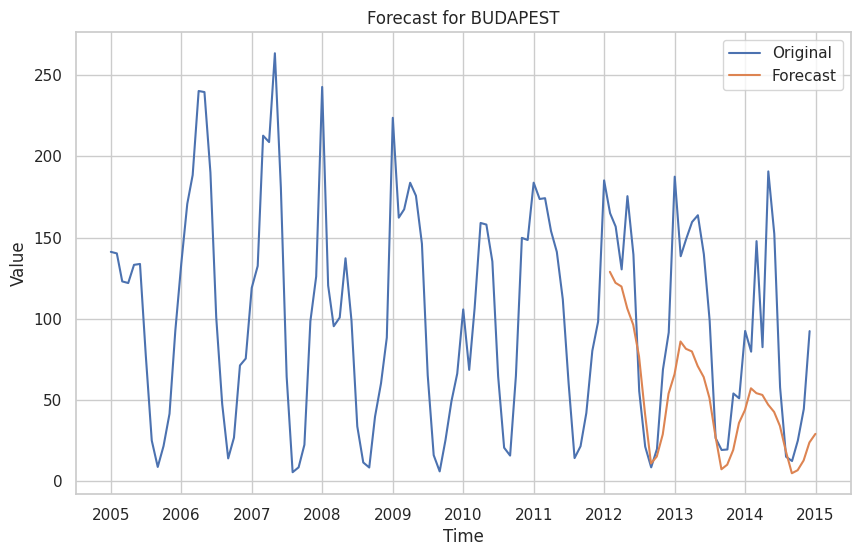

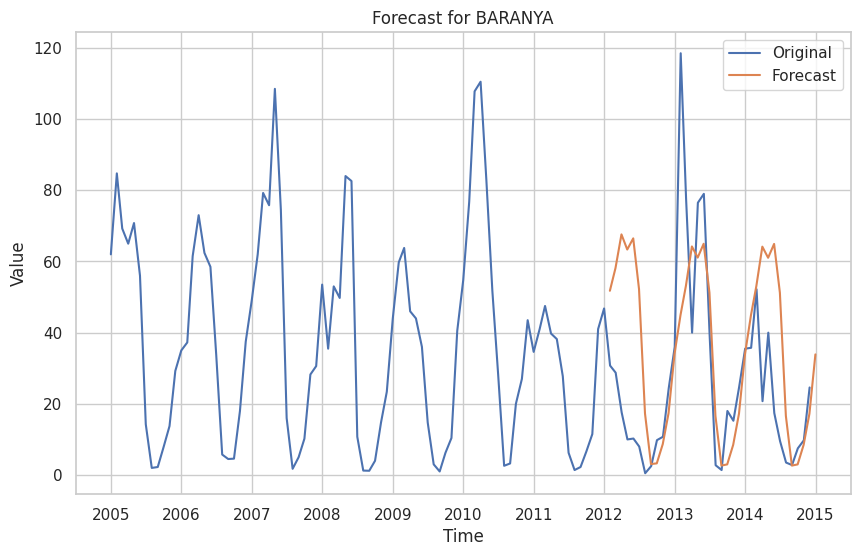

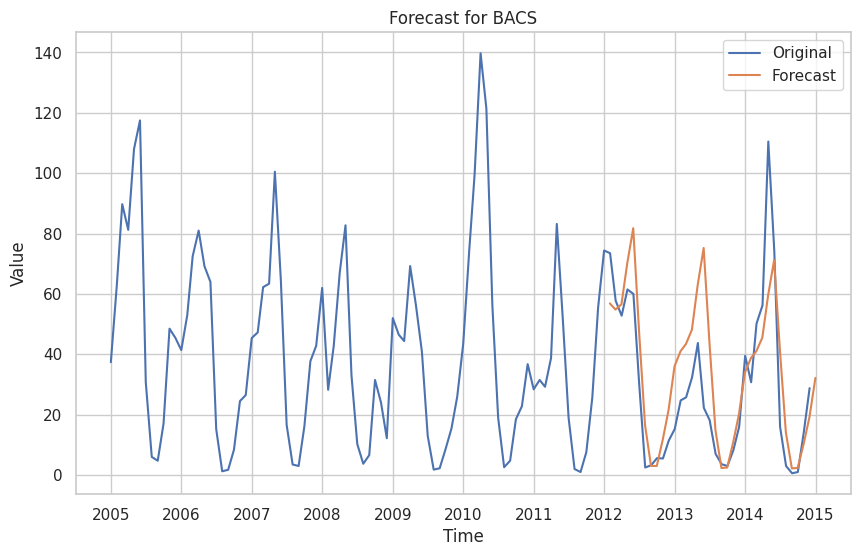

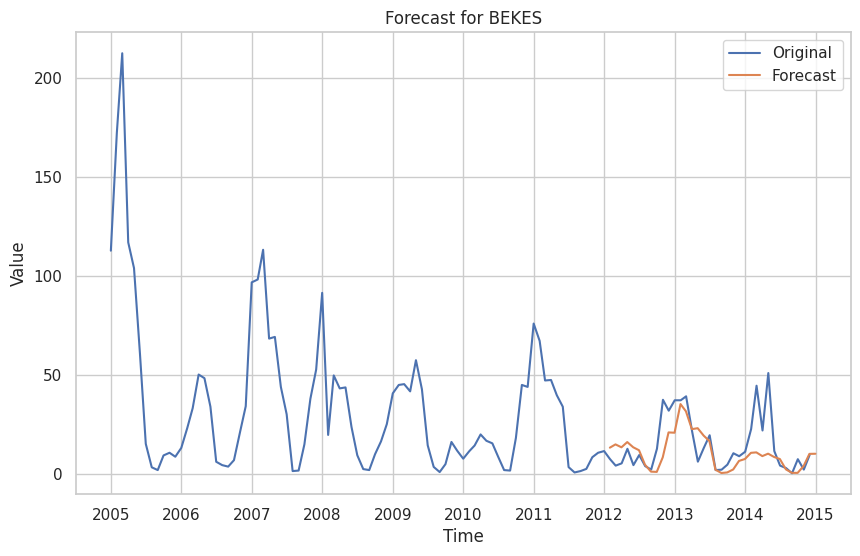

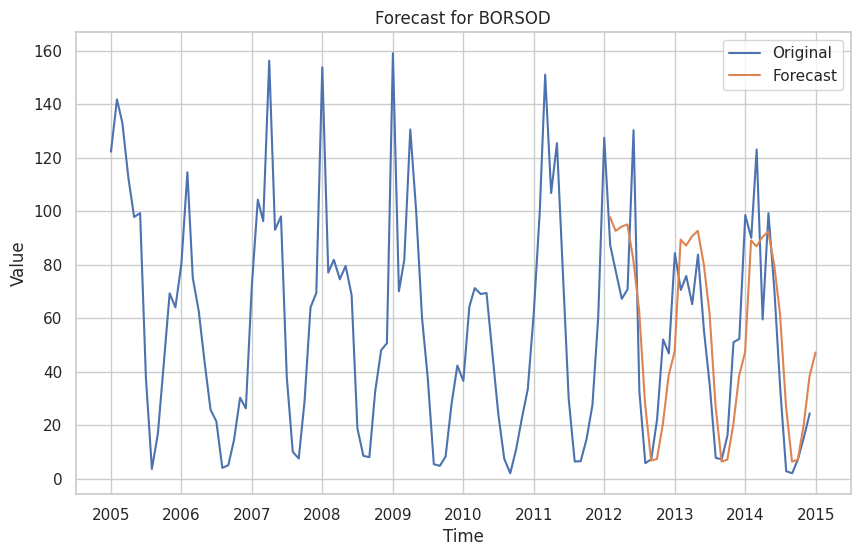

...

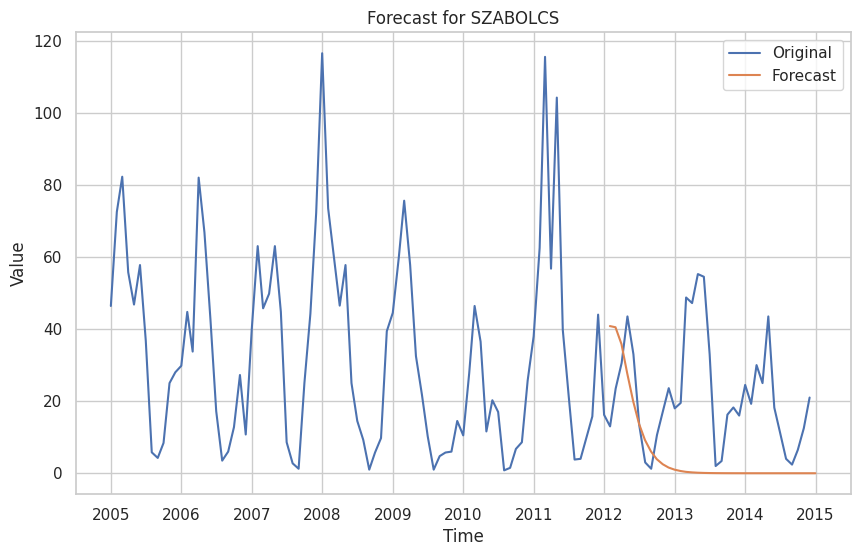

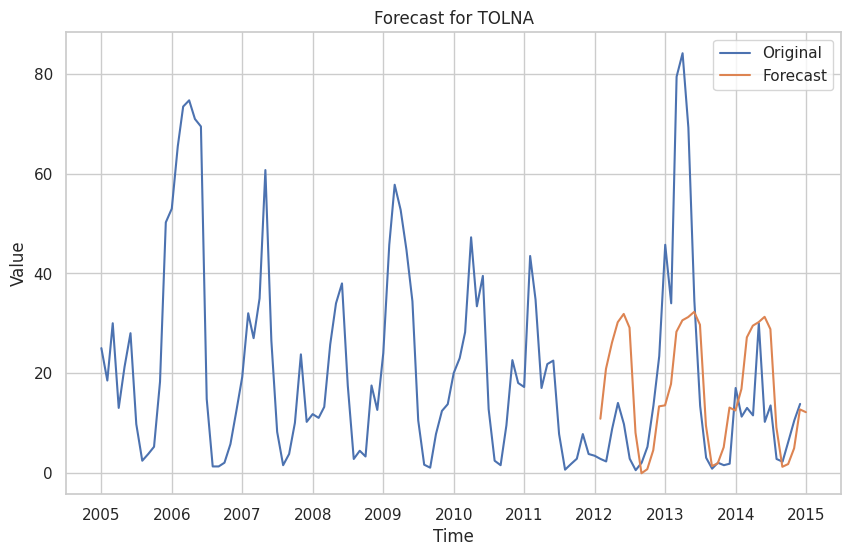

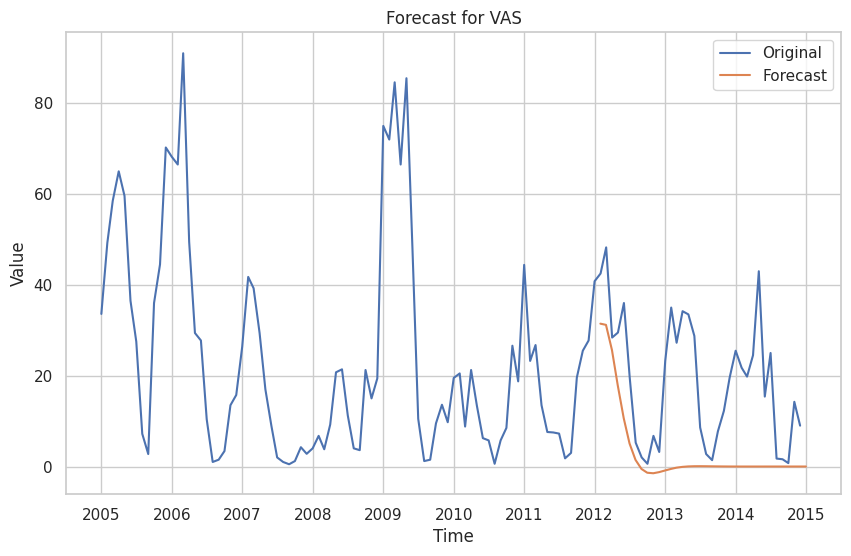

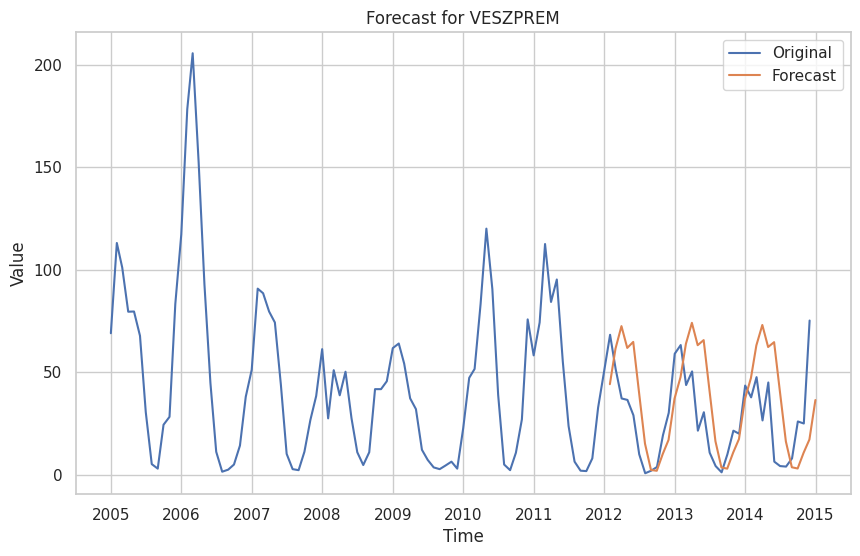

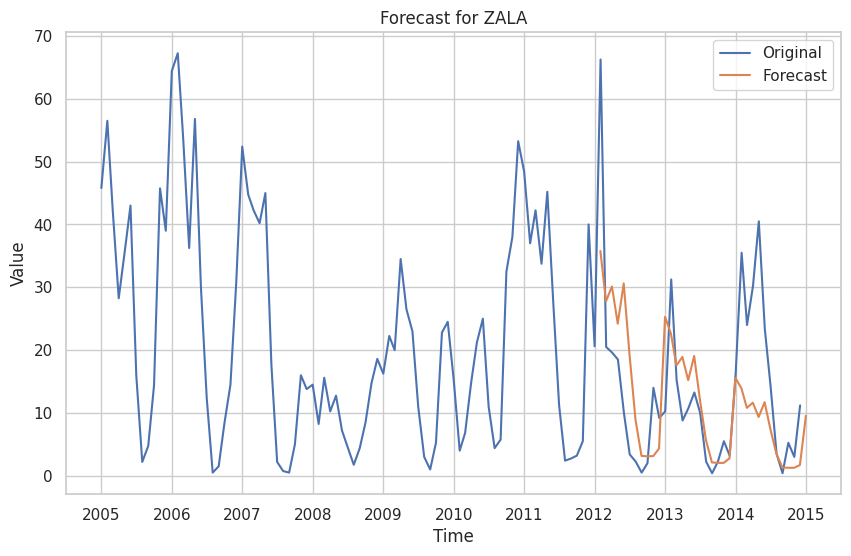

In [53]:
# Specify the range of values to search for order and seasonal order
p_values = range(0, 3)  # Autoregressive order
d_values = range(0, 2)  # Differencing order
q_values = range(0, 3)  # Moving average order
P_values = range(0, 3)  # Seasonal autoregressive order
D_values = range(0, 2)  # Seasonal differencing order
Q_values = range(0, 3)  # Seasonal moving average order
s_values = [12]  # Seasonal cycle length

# Loop over each column in the dataset
sarimax_results = {}  # Dictionary to store model results
sarimax_performance_metrics = {}  # Dictionary to store performance metrics
sarimax_forecast = {}  # Dictionary to store forecast data

for column in decomposition_results:
    trend = decomposition_results[column]['trend']
    seasonal = decomposition_results[column]['seasonal']
    residual = decomposition_results[column]['residual']

    # Combine the components to get the original series
    data = trend + seasonal + residual
    
    # Split the data into training and testing sets
    train_data = data.loc['2005-01-01':'2011-12-31']
    test_data = data.loc['2012-01-01':'2015-12-31']

    # Perform grid search to find the best order and seasonal order
    model = pm.auto_arima(train_data, seasonal=True, m=12, suppress_warnings=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Fit SARIMAX model with the best parameters
    model = SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
    model_result = model.fit(disp=False)

    # Store the model results
    sarimax_results[column] = model_result

    # Obtain forecasts for the test data
    forecast_start = test_data.index[0]
    forecast_end = test_data.index[-1]
    forecast = model_result.predict(start=forecast_start, end=forecast_end)

    # Calculate performance metrics
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(test_data, forecast)

    # Store the performance metrics
    sarimax_performance_metrics[column] = {
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    }

    # Generate forecast dates
    forecast_dates = pd.date_range(start='2012-01-01', end='2015-12-31', freq='M')

    # Trim the forecasted values to match the length of the test data
    forecast_values = forecast[:len(test_data)]
    forecast_dates = forecast_dates[:len(test_data)]
    sarimax_forecast[column] = {
        'dates': forecast_dates,
        'values': forecast_values
    }

    # Plot the forecast
    plt.figure(figsize=(10, 6))
    plt.plot(data, label='Original')
    plt.plot(sarimax_forecast[column]['dates'], sarimax_forecast[column]['values'], label='Forecast')
    plt.title(f'Forecast for {column}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

### Evaluate SARIMA

BUDAPEST


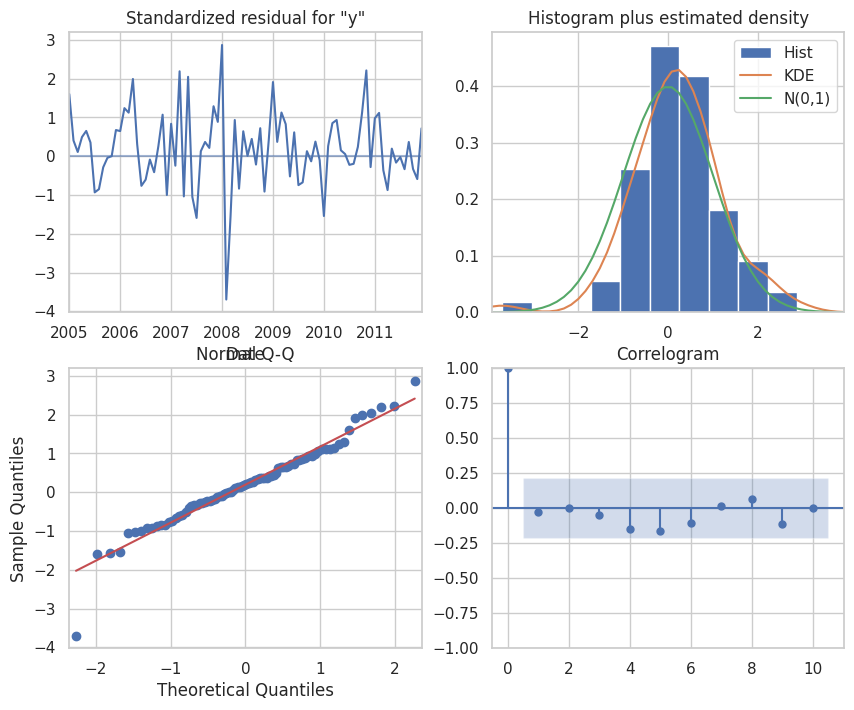

BARANYA


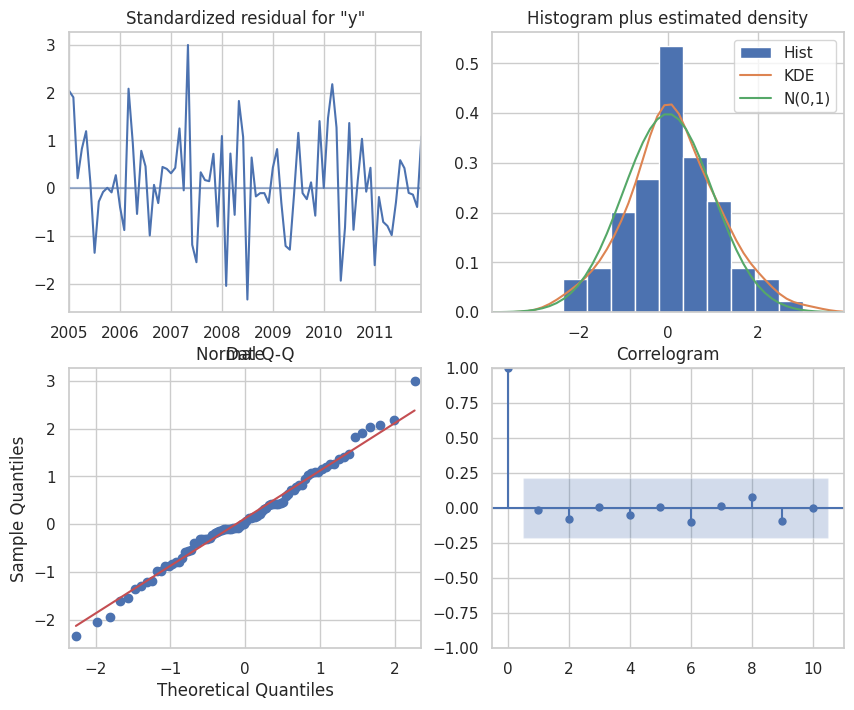

BACS


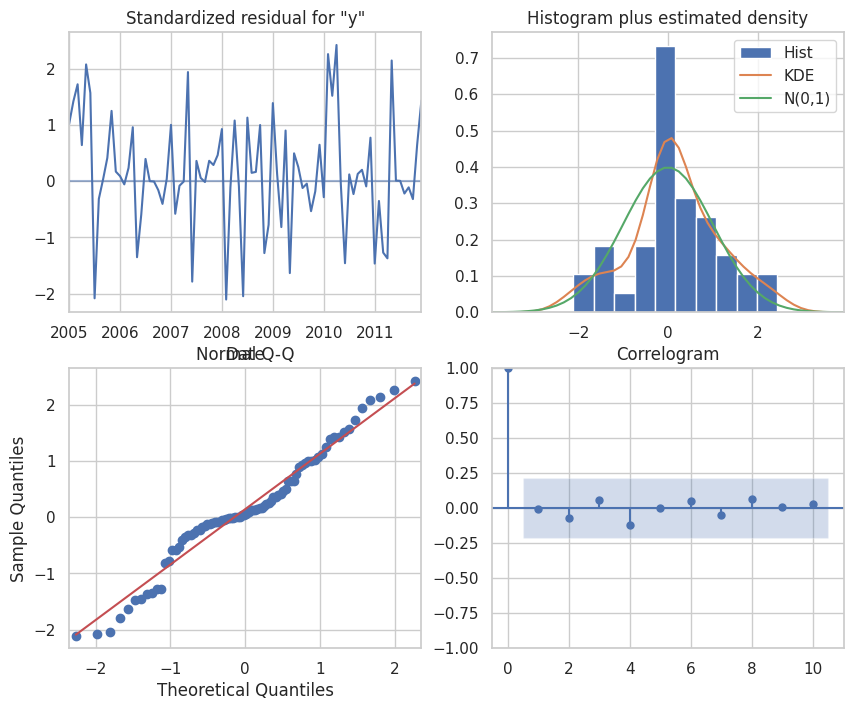

BEKES


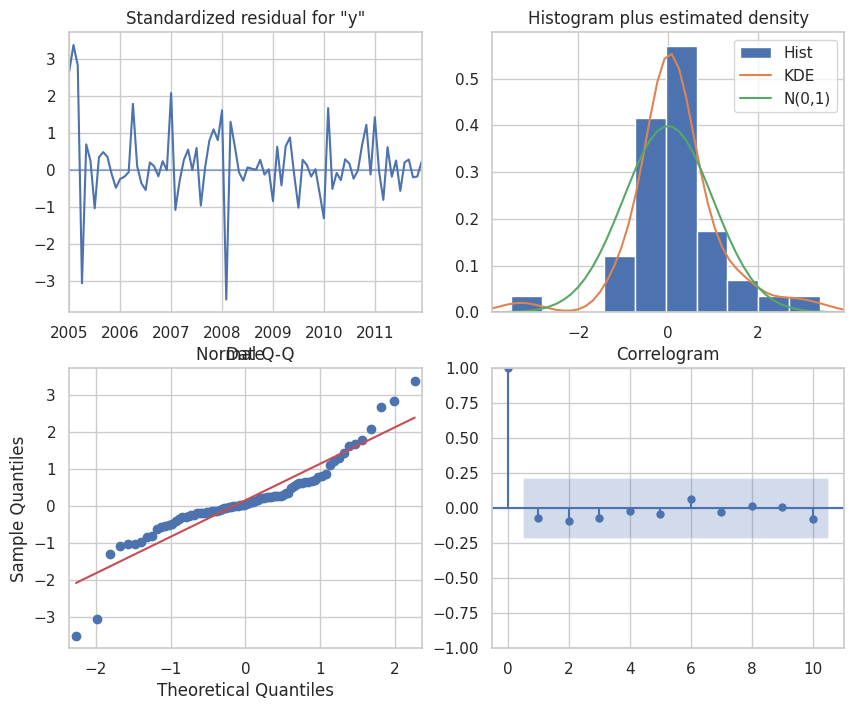

BORSOD


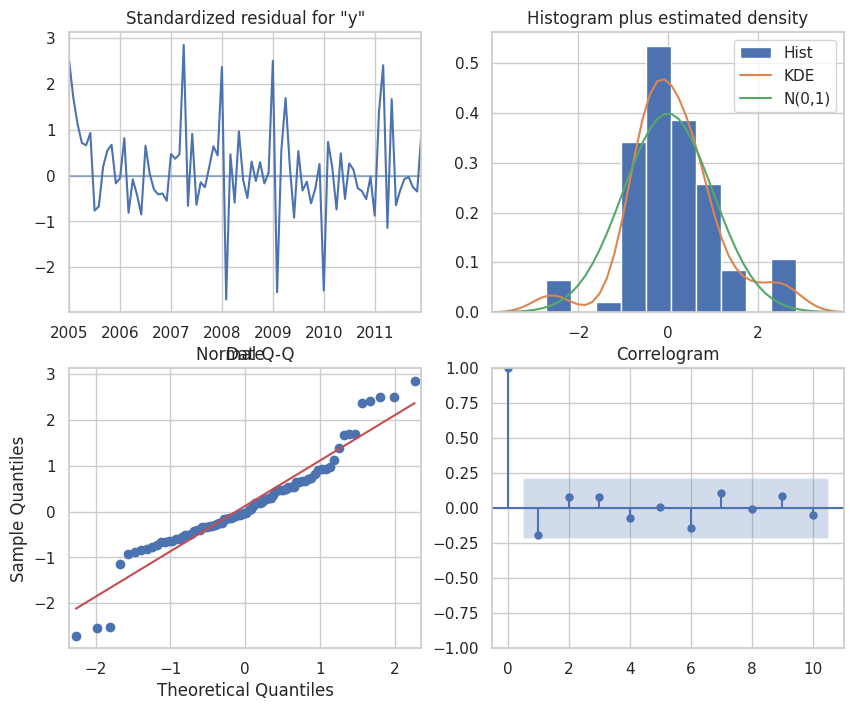

CSONGRAD


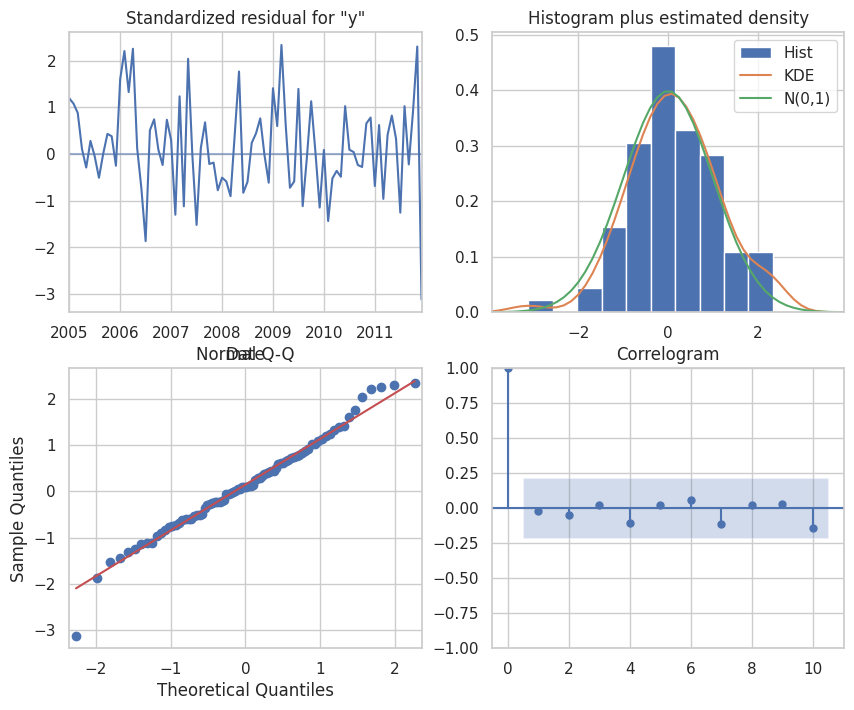

FEJER


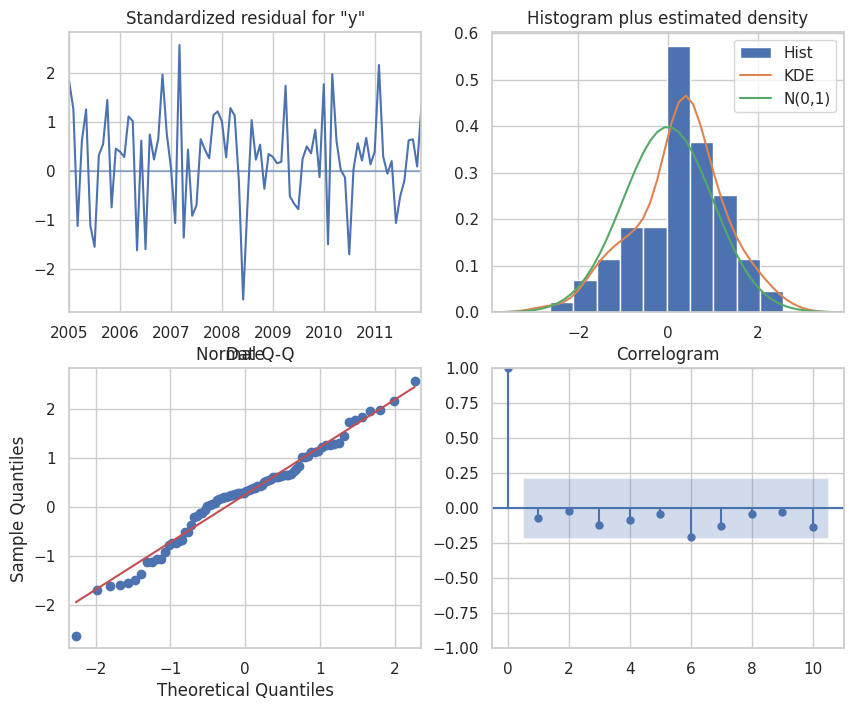

GYOR


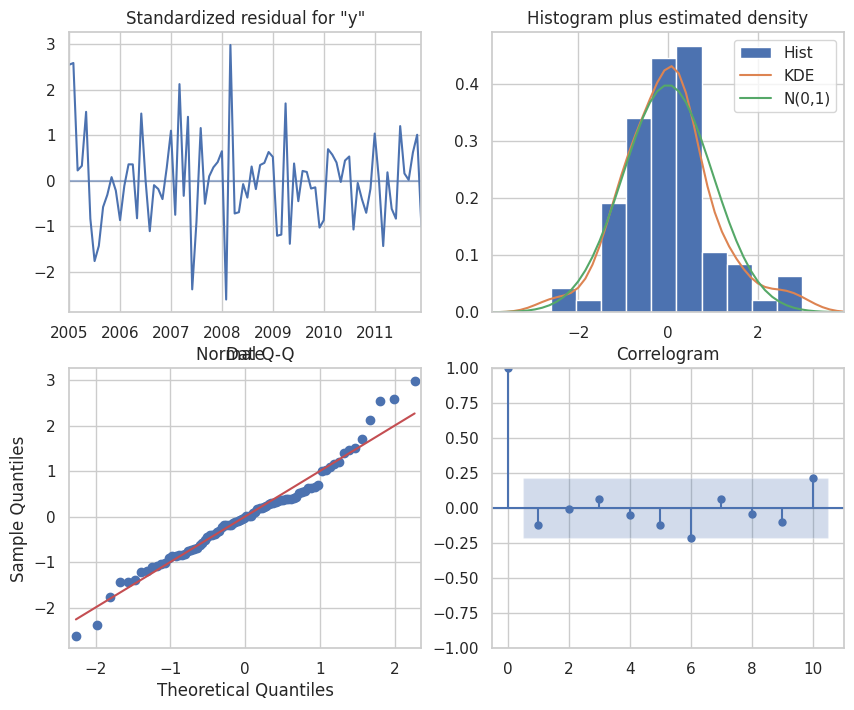

HAJDU


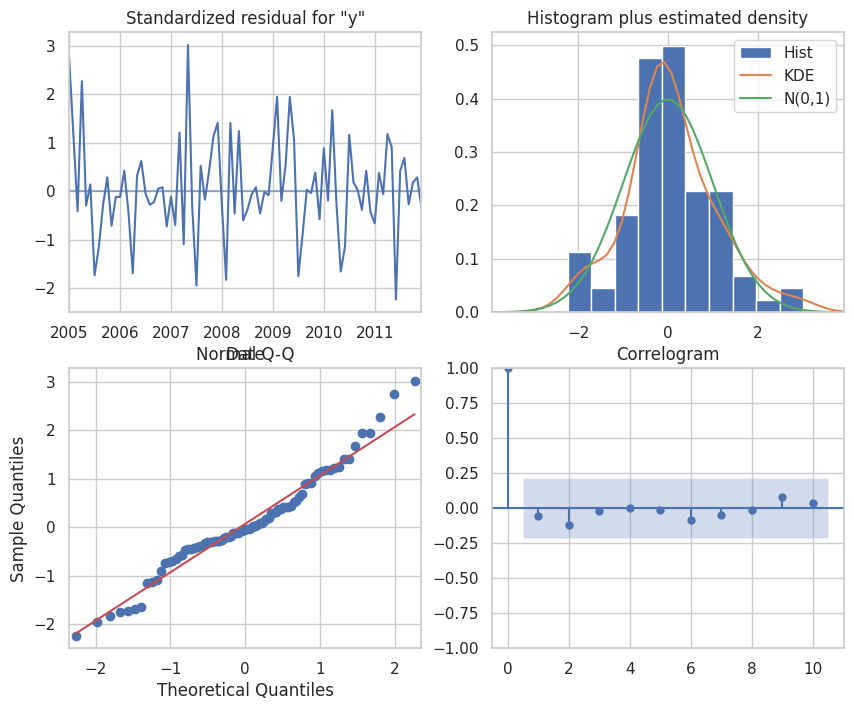

HEVES


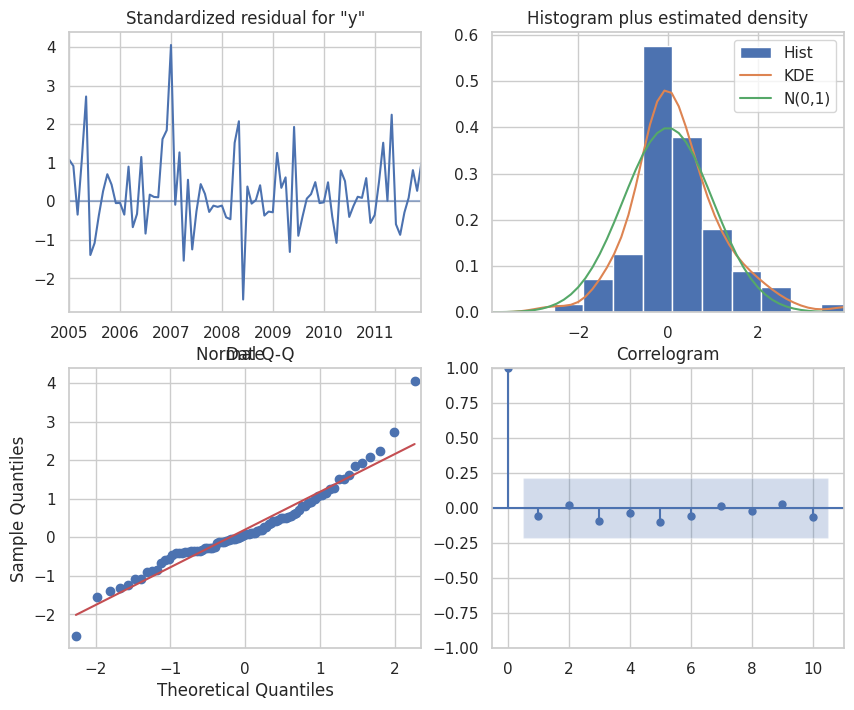

JASZ


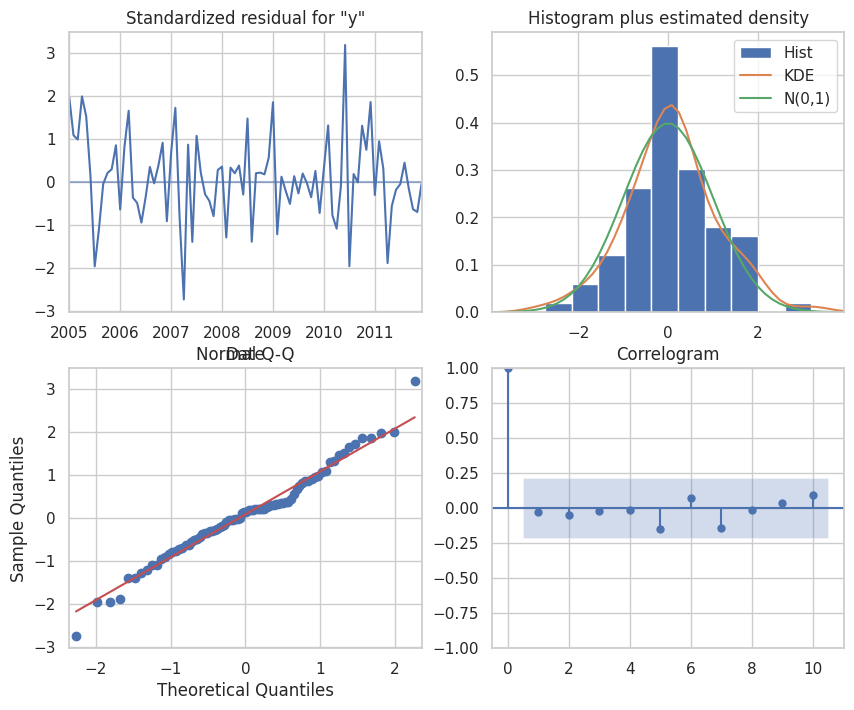

KOMAROM


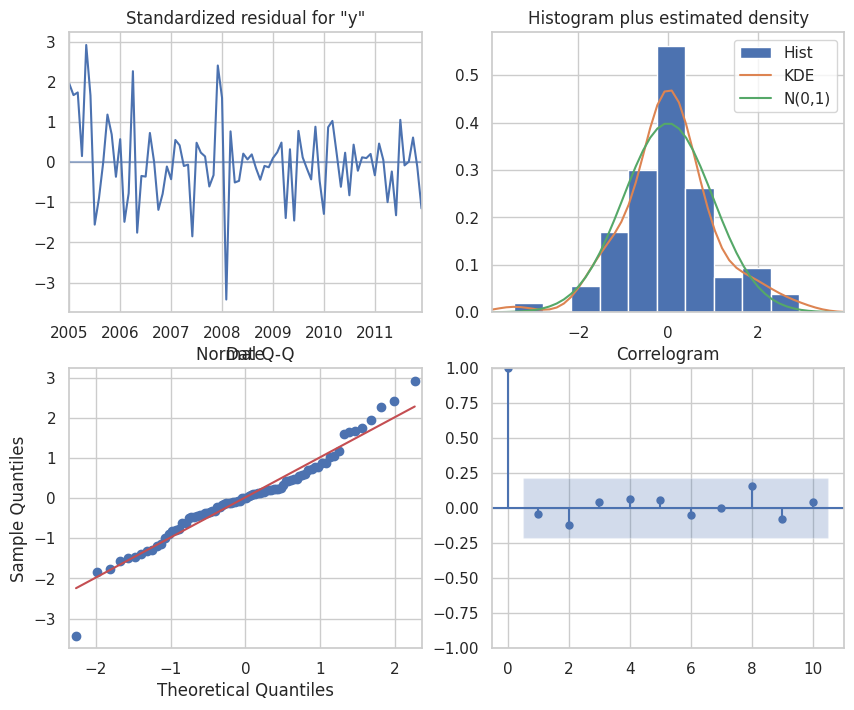

NOGRAD


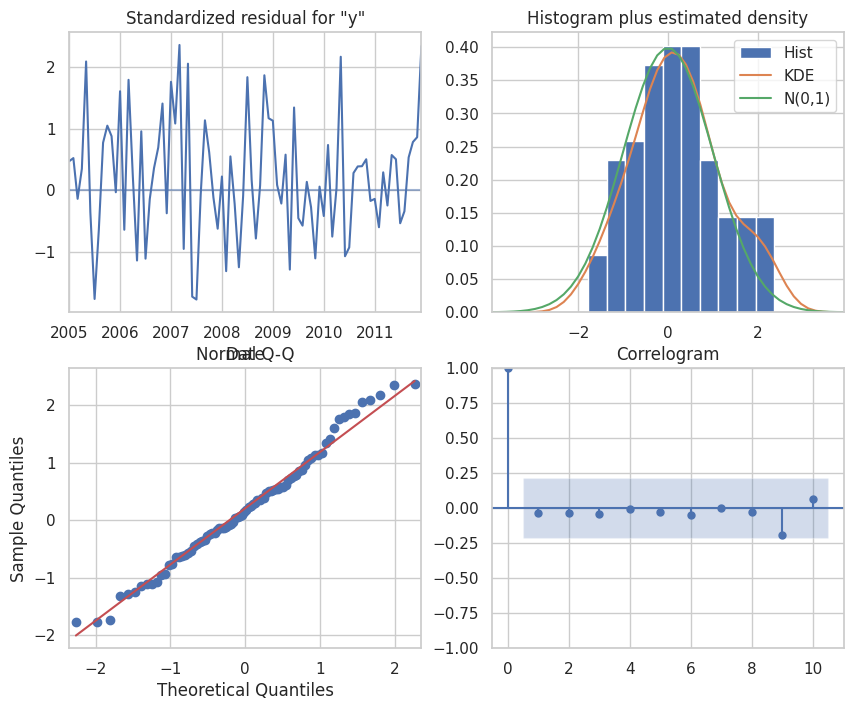

PEST


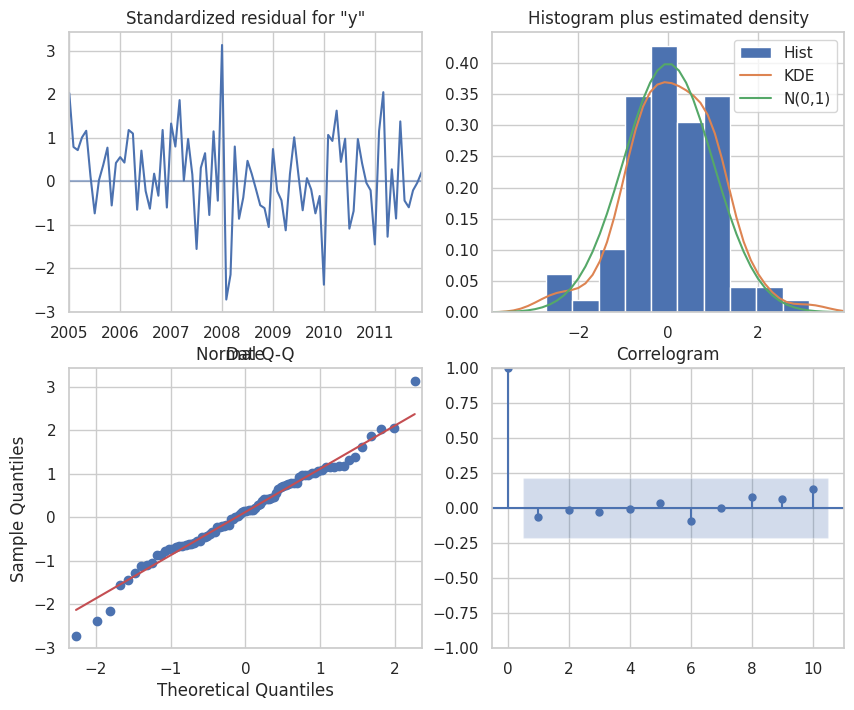

SOMOGY


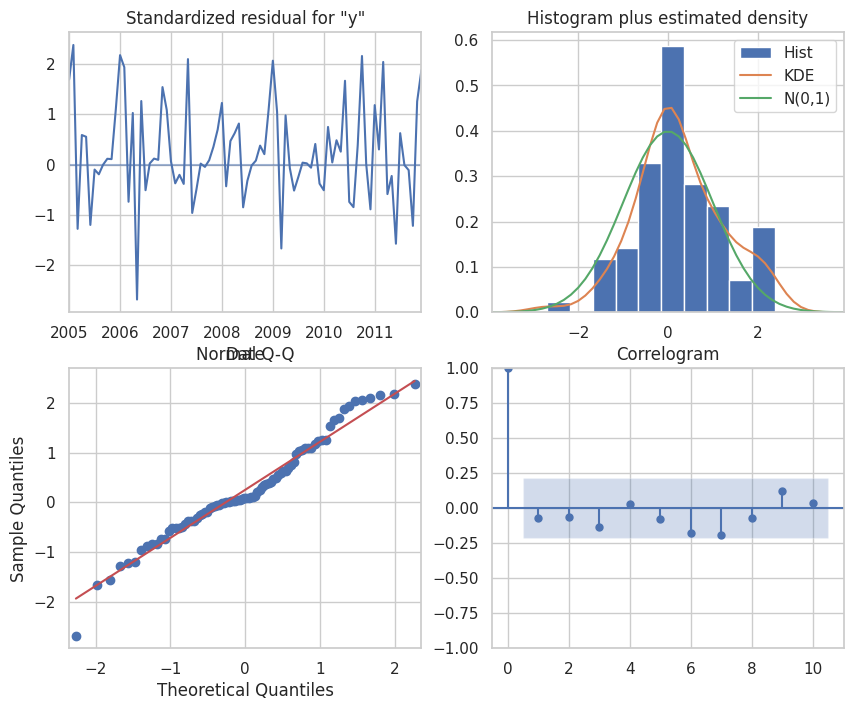

SZABOLCS


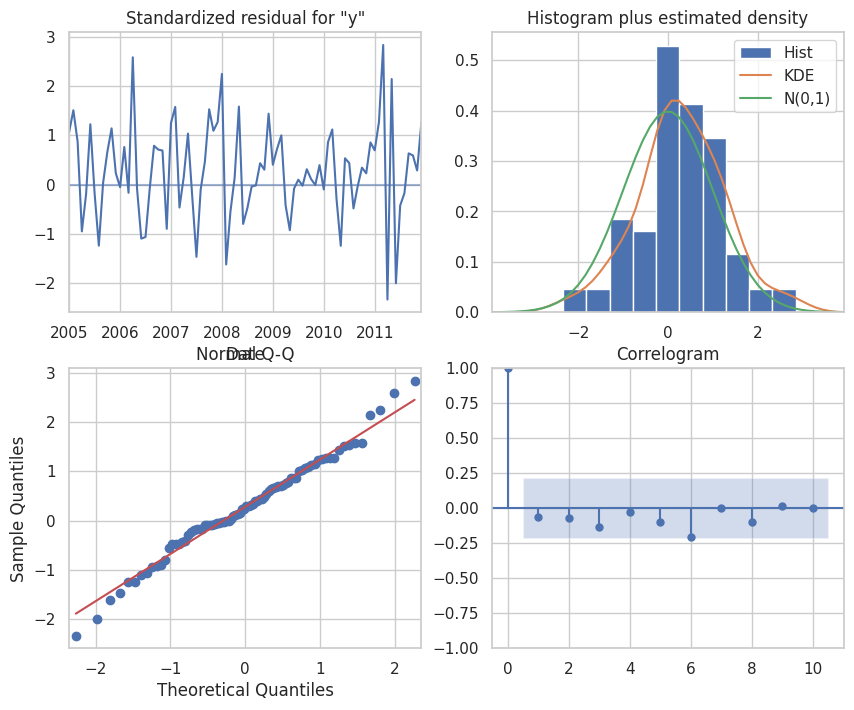

TOLNA


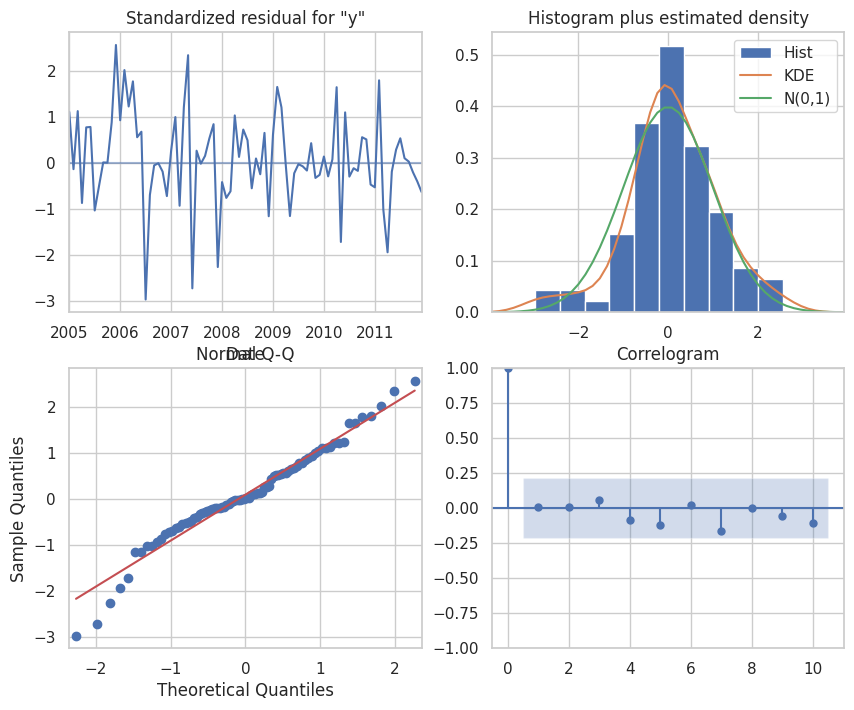

VAS


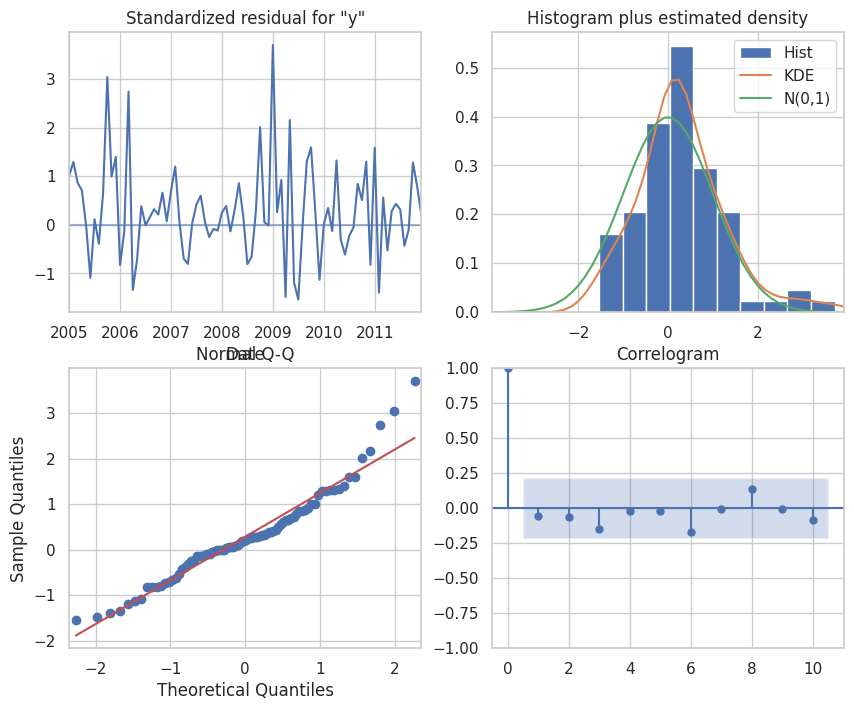

VESZPREM


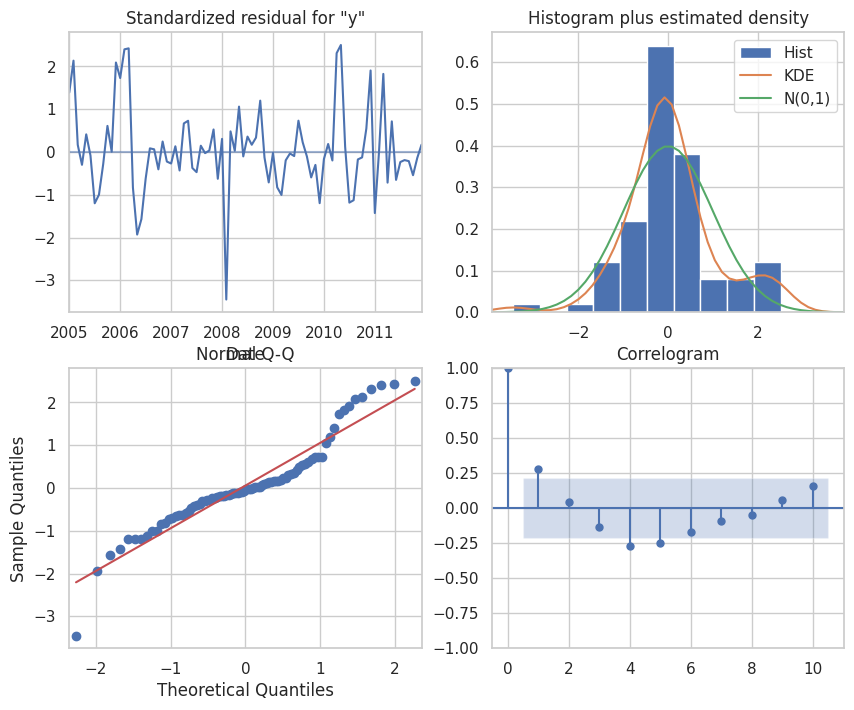

ZALA


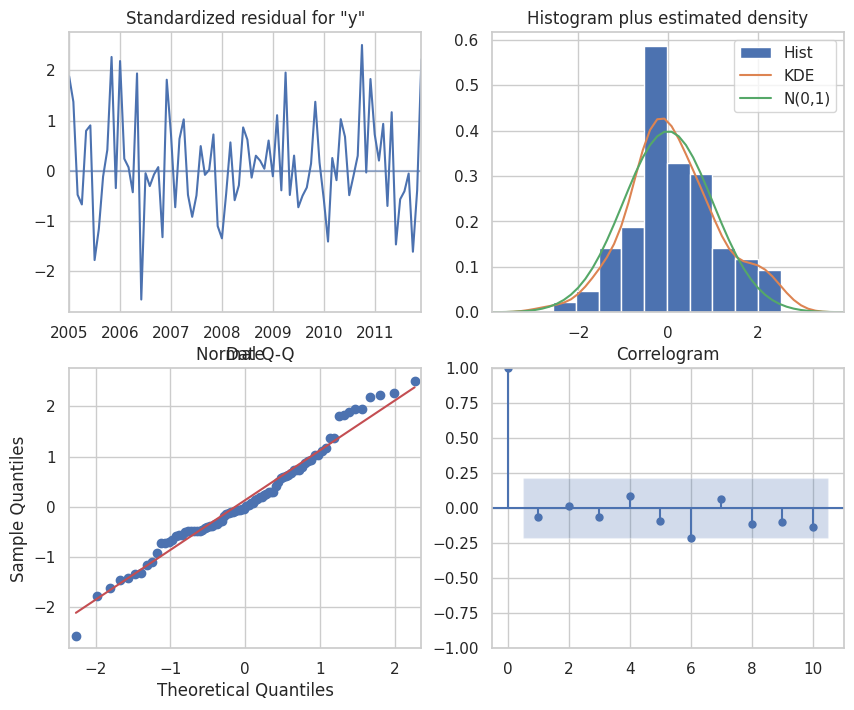

In [54]:
# Diagnostic plots
for column in temporal_monthly_mean.columns:
    print(column)
    sarimax_results[column].plot_diagnostics(figsize=(10, 8))
    plt.show()

In [55]:
sarimax_performance_metrics

{'BUDAPEST': {'mse': 3404.901322719511,
  'rmse': 58.351532308239435,
  'mae': 45.00979548440435},
 'BARANYA': {'mse': 562.2486318655078,
  'rmse': 23.71178255352195,
  'mae': 16.71713713342953},
 'BACS': {'mse': 276.2635469524489,
  'rmse': 16.62117766442706,
  'mae': 12.732500031424948},
 'BEKES': {'mse': 139.68906822456714,
  'rmse': 11.819012997055513,
  'mae': 7.526767654341526},
 'BORSOD': {'mse': 344.8115431949648,
  'rmse': 18.569101841364457,
  'mae': 12.903984409063838},
 'CSONGRAD': {'mse': 295.83141002454187,
  'rmse': 17.199750289598448,
  'mae': 13.233394423995207},
 'FEJER': {'mse': 766.2638437156522,
  'rmse': 27.681471126290457,
  'mae': 22.77506327460887},
 'GYOR': {'mse': 163.71967684082935,
  'rmse': 12.795299013341944,
  'mae': 9.186852783861925},
 'HAJDU': {'mse': 546.153694609814,
  'rmse': 23.36993142073408,
  'mae': 14.312839063922805},
 'HEVES': {'mse': 300.4018565850809,
  'rmse': 17.332104793852388,
  'mae': 12.645060040050168},
 'JASZ': {'mse': 578.76046883

The model performs fairly well with the Budapest Model having the highest error with an mse of 3404.90

### ARIMA

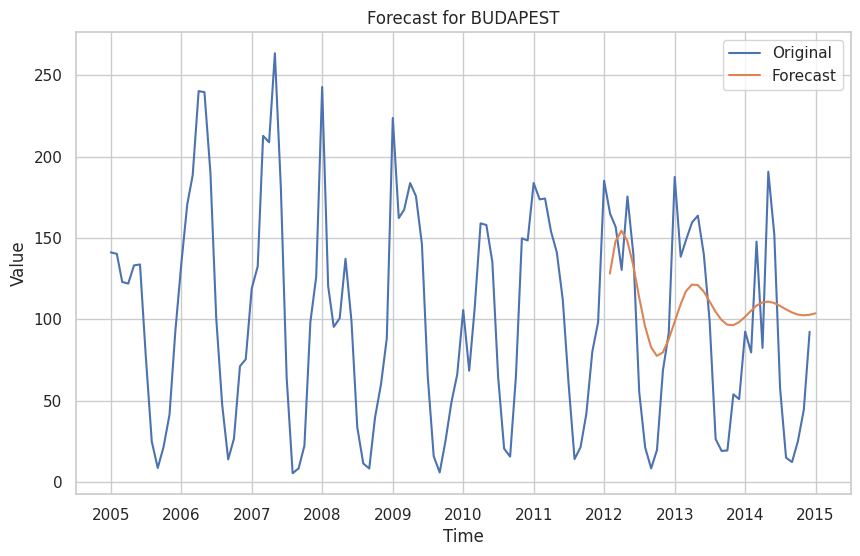

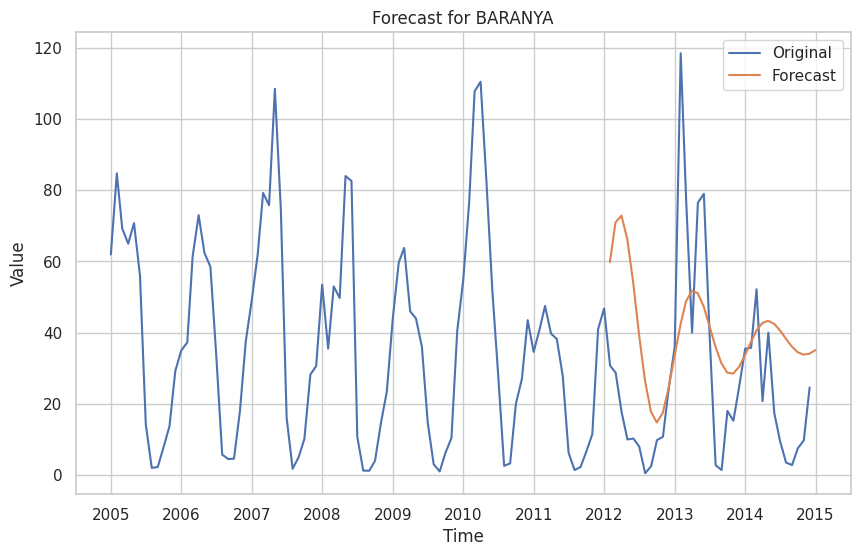

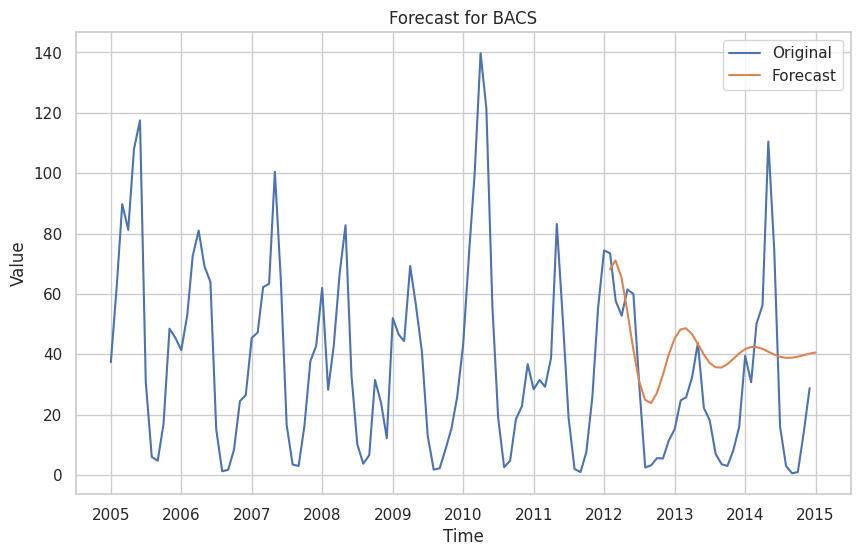

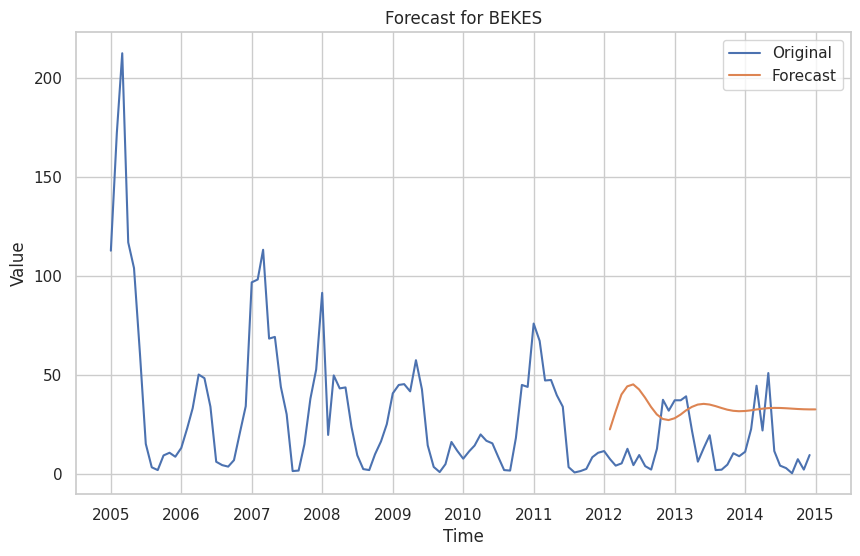

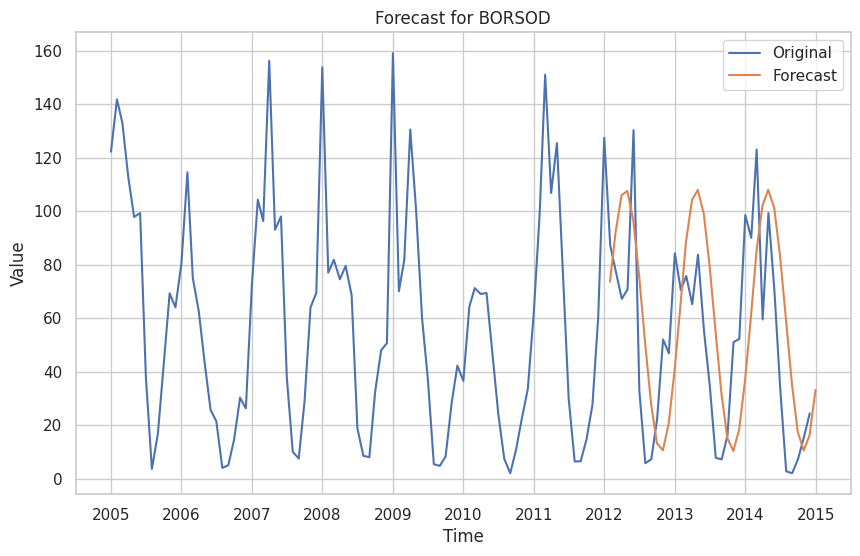

...

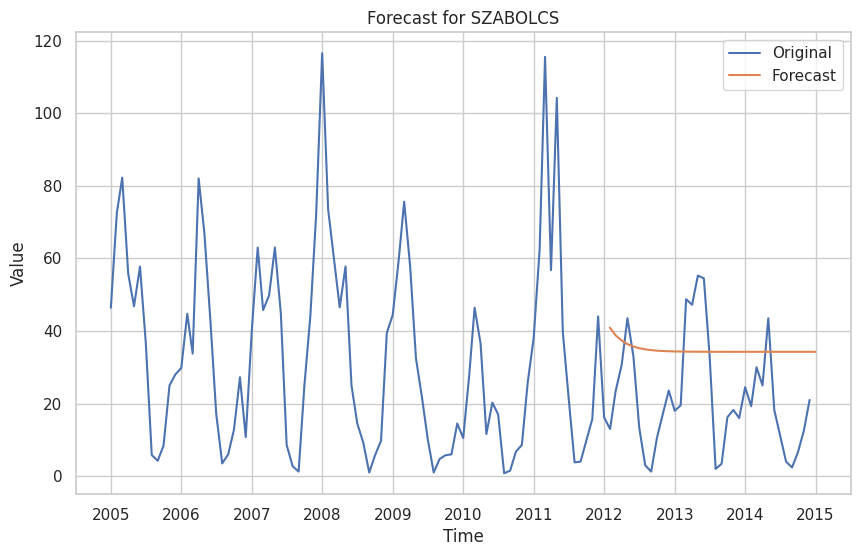

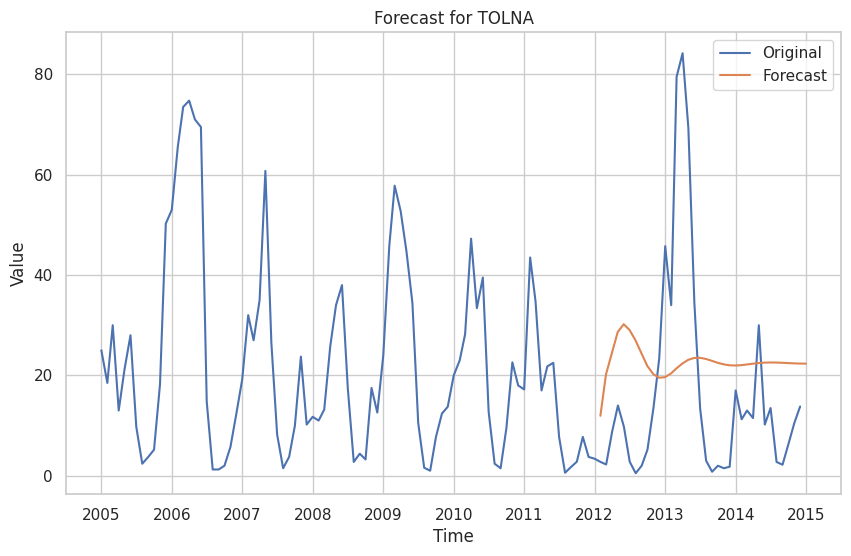

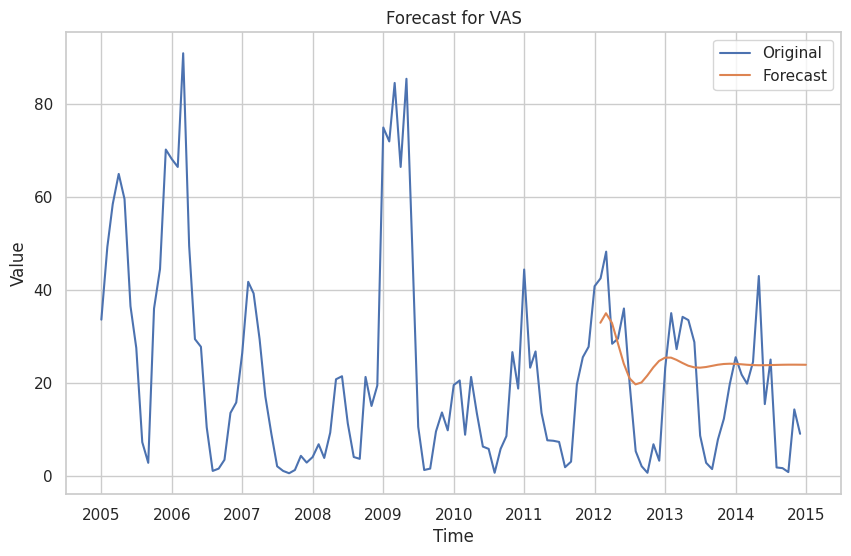

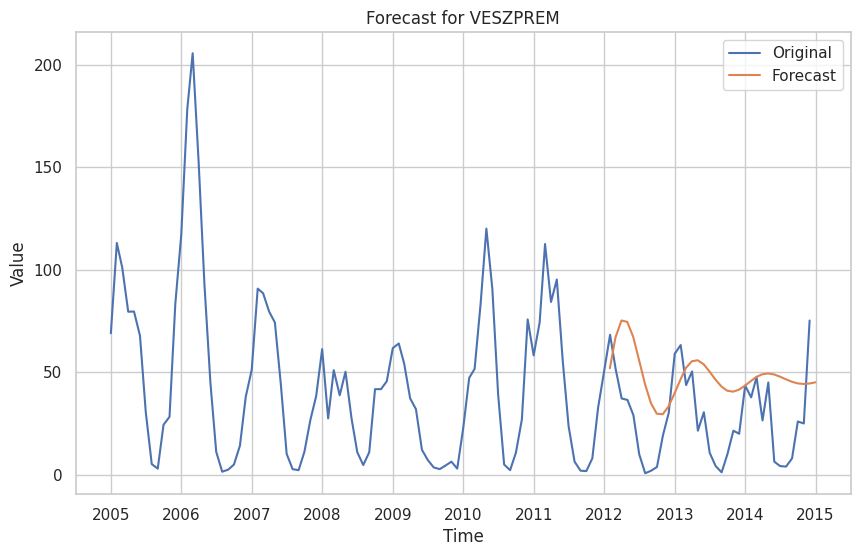

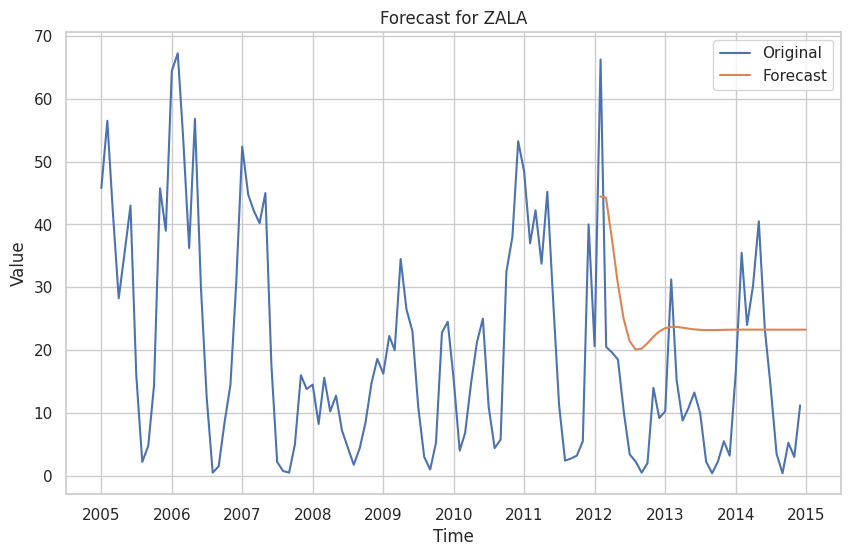

In [56]:
# Loop over each column in the dataset
arima_results = {}  # Dictionary to store model results
arima_performance_metrics = {}  # Dictionary to store performance metrics
arima_forecast = {}  # Dictionary to store forecast data

for column in decomposition_results:
    trend = decomposition_results[column]['trend']
    seasonal = decomposition_results[column]['seasonal']
    residual = decomposition_results[column]['residual']

    # Combine the components to get the original series
    data = trend + seasonal + residual
    
    # Split the data into training and testing sets
    train_data = data.loc['2005-01-01':'2011-12-31']
    test_data = data.loc['2012-01-01':'2015-12-31']

    # Perform grid search to find the best order
    model = pm.auto_arima(train_data, seasonal=False, suppress_warnings=True)
    order = model.order

    # Fit ARMA model with the best parameters
    model = ARIMA(train_data, order=order)
    model_result = model.fit()

    # Store the model results
    arima_results[column] = model_result

    # Obtain forecasts for the test data
    forecast_start = test_data.index[0]
    forecast_end = test_data.index[-1]
    forecast = model_result.predict(start=forecast_start, end=forecast_end)

    # Calculate performance metrics
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(test_data, forecast)

    # Store the performance metrics
    arima_performance_metrics[column] = {
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    }

    # Generate forecast dates
    forecast_dates = pd.date_range(start='2012-01-01', end='2015-12-31', freq='M')

    # Trim the forecasted values to match the length of the test data
    forecast_values = forecast[:len(test_data)]
    forecast_dates = forecast_dates[:len(test_data)]
    arima_forecast[column] = {
        'dates': forecast_dates,
        'values': forecast_values
    }

    # Plot the forecast
    plt.figure(figsize=(10, 6))
    plt.plot(data, label='Original')
    plt.plot(arima_forecast[column]['dates'], arima_forecast[column]['values'], label='Forecast')
    plt.title(f'Forecast for {column}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


### Evaluate the ARIMA Model
> Performance metrics

In [57]:
arima_performance_metrics

{'BUDAPEST': {'mse': 2607.84089808131,
  'rmse': 51.067023587451324,
  'mae': 44.32226158023006},
 'BARANYA': {'mse': 705.5931621588072,
  'rmse': 26.5630036358618,
  'mae': 21.921574058361937},
 'BACS': {'mse': 703.7103647383268,
  'rmse': 26.52753974152761,
  'mae': 22.501171530253874},
 'BEKES': {'mse': 577.5189357044806,
  'rmse': 24.031623659346877,
  'mae': 21.927959105459163},
 'BORSOD': {'mse': 664.9759376225262,
  'rmse': 25.78712736274683,
  'mae': 21.382074269056588},
 'CSONGRAD': {'mse': 550.6028224313669,
  'rmse': 23.464927496827407,
  'mae': 20.174477282058994},
 'FEJER': {'mse': 384.01533480432124,
  'rmse': 19.596309213837213,
  'mae': 17.172778089515674},
 'GYOR': {'mse': 306.8605731841888,
  'rmse': 17.517436261741864,
  'mae': 15.379481722916475},
 'HAJDU': {'mse': 1106.057283350518,
  'rmse': 33.257439518858305,
  'mae': 28.251105545991653},
 'HEVES': {'mse': 380.93087437382786,
  'rmse': 19.51745050906567,
  'mae': 16.486009602831878},
 'JASZ': {'mse': 957.2255087

The metrics suggest that the error is smaller but when the forecasted values are compared to the actual values then the model seems to perform poorly (visually).

## National Total
> Performing a time series analysis on the national figures

In [58]:
# Creating a new variable for national tallies
nation_df = chickenpox_df[['Date', 'National_Total']]

# setting date as the index for the time series
nation_df = index_date(nation_df)

# preview
nation_df.head()

,National_Total
Date,
2005-01-03,1807
2005-01-10,1407
2005-01-17,1284
2005-01-24,1255
2005-01-31,1478


In [59]:
# Sampling the national total to monthly data
nation_monthly = nation_df.resample('MS')


# Getting the mean case count for the month
nation_monthly_mean = nation_monthly.mean()

# Preview
nation_monthly_mean.head()

,National_Total
Date,
2005-01-01,1446.20
2005-02-01,1816.75
2005-03-01,1752.25
2005-04-01,1564.50
2005-05-01,1682.20


### Stationarity Check for the National Total

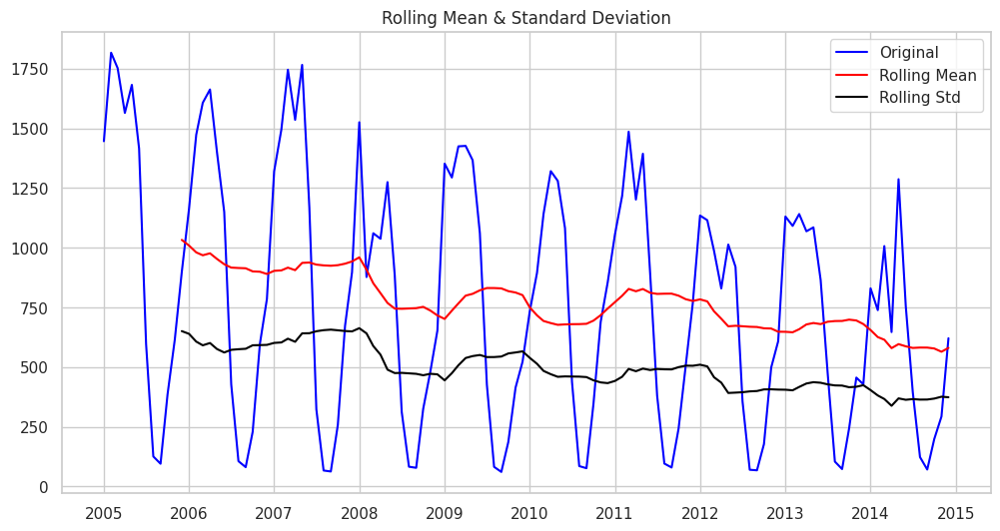

Results of Dickey-Fuller Test: 

Test Statistic                  -1.469722
p-value                          0.548433
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64



'The data is non-stationary'

In [60]:
stationarity_check(nation_monthly_mean, w=12)

### Dealing with non-stationarity for the National Tally

In [61]:
national_decompose_results = decompose_and_store(nation_monthly_mean)

# Preview
national_decompose_results

{'National_Total': {'trend': Date
  2005-01-01    1102.734695
  2005-02-01    1088.134313
  2005-03-01    1073.549890
  2005-04-01    1058.935719
  2005-05-01    1044.257682
                   ...     
  2014-08-01     583.345176
  2014-09-01     584.930780
  2014-10-01     586.710441
  2014-11-01     588.592497
  2014-12-01     590.523086
  Freq: MS, Name: trend, Length: 120, dtype: float64,
  'seasonal': Date
  2005-01-01    387.810661
  2005-02-01    608.063554
  2005-03-01    707.131042
  2005-04-01    629.900589
  2005-05-01    656.122162
                   ...    
  2014-08-01   -492.041350
  2014-09-01   -523.033555
  2014-10-01   -385.803672
  2014-11-01   -200.933627
  2014-12-01    -34.068002
  Freq: MS, Name: season, Length: 120, dtype: float64,
  'residual': Date
  2005-01-01    -44.345356
  2005-02-01    120.552133
  2005-03-01    -28.430932
  2005-04-01   -124.336308
  2005-05-01    -18.179843
                   ...    
  2014-08-01     31.696174
  2014-09-01      9.10277

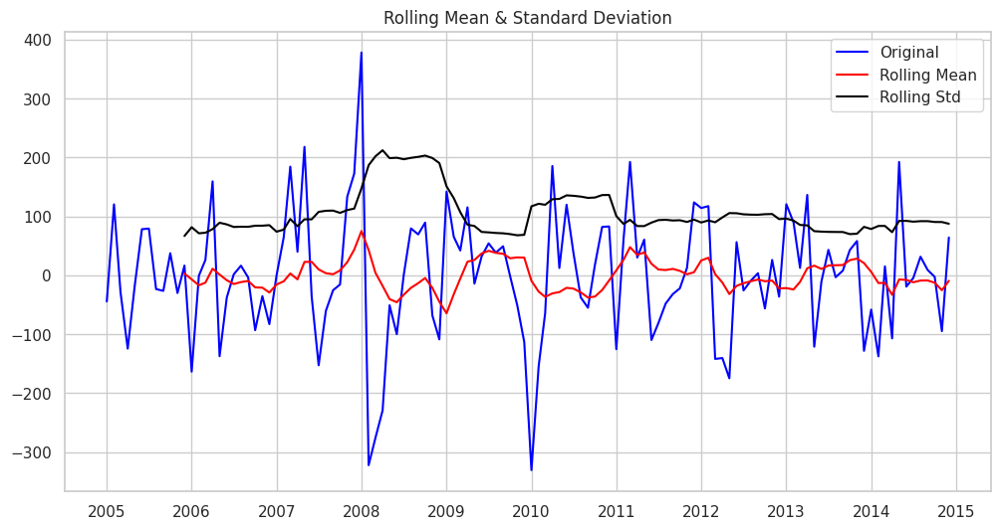

Results of Dickey-Fuller Test: 

Test Statistic                -7.735940e+00
p-value                        1.093674e-11
#Lags Used                     2.000000e+00
Number of Observations Used    1.170000e+02
Critical Value (1%)           -3.487517e+00
Critical Value (5%)           -2.886578e+00
Critical Value (10%)          -2.580124e+00
dtype: float64

Stationarity check for National_Total: The data is stationary


In [63]:
# Iterate through the dictionary of decomposition results
nat_verdict = {}
for column, decomposition in national_decompose_results.items():
    # Extract the components
    trend = decomposition['trend']
    seasonal = decomposition['seasonal']
    residuals = decomposition['residual']
    
    # Check for stationarity of the residuals
    stationarity_result = stationarity_check(residuals, w=12)
    nat_verdict[column] = stationarity_result
    print(f"Stationarity check for {column}: {stationarity_result}")

### Data Modelling

#### SARIMAX

In [64]:
# Train_test_split
nat_train_data = nation_monthly_mean.loc['2005-01-01':'2011-12-31']
nat_test_data = nation_monthly_mean.loc['2012-01-01':'2015-12-31']

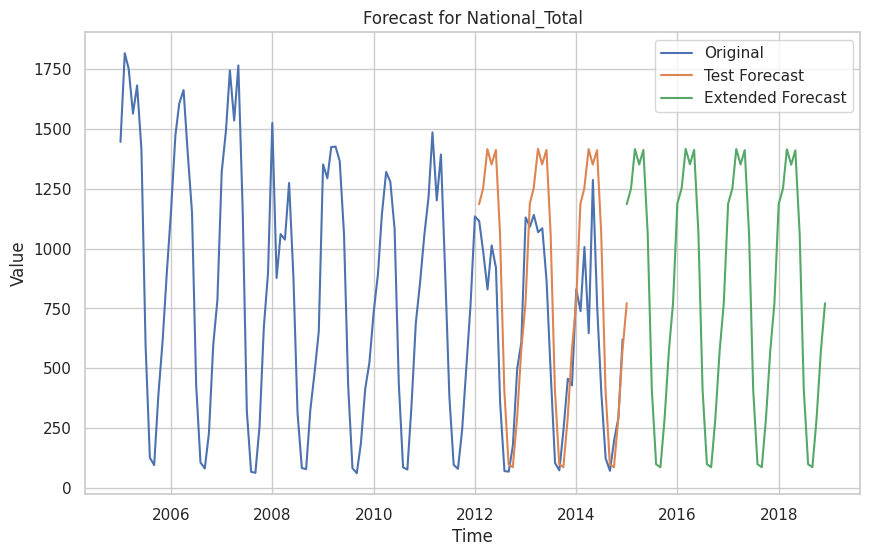

In [84]:
nat_sarimax_results = {}  # Dictionary to store model results
nat_sarimax_performance_metrics = {}  # Dictionary to store performance metrics
nat_sarimax_forecast = {}  # Dictionary to store forecast data

for column in national_decompose_results:
    trend = national_decompose_results[column]['trend']
    seasonal = national_decompose_results[column]['seasonal']
    residual = national_decompose_results[column]['residual']

    # Combine the components to get the original series
    data = trend + seasonal + residual

    # Split the data into training and testing sets
    train_data = data.loc['2005-01-01':'2011-12-31']
    test_data = data.loc['2012-01-01':'2014-12-31']

    # Perform grid search to find the best order and seasonal order
    model = pm.auto_arima(train_data, seasonal=True, m=12, suppress_warnings=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Fit SARIMAX model with the best parameters
    model = SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
    model_result = model.fit(disp=False)

    # Store the model results
    nat_sarimax_results[column] = model_result

    # Obtain forecasts for the test data
    forecast_start = test_data.index[0]
    forecast_end = test_data.index[-1]
    forecast = model_result.predict(start=forecast_start, end=forecast_end)

    # Calculate performance metrics
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(test_data, forecast)

    # Store the performance metrics
    nat_sarimax_performance_metrics[column] = {
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    }

    # Generate forecast dates
    forecast_dates = pd.date_range(start='2012-01-01', end='2014-12-31', freq='M')

    # Trim the forecasted values to match the length of the test data
    forecast_values = forecast[:len(test_data)]
    forecast_dates = forecast_dates[:len(test_data)]
    nat_sarimax_forecast[column] = {
        'dates': forecast_dates,
        'values': forecast_values
    }

    # Extend the predictions into the future
    num_forecast_periods = 12  # Number of periods to forecast into the future
    future_dates = pd.date_range(start='2014-12-29', periods=num_forecast_periods, freq='M')
    future_forecast = model_result.predict(start=len(data), end=len(data) + num_forecast_periods - 1)

    # Concatenate the forecasted values and dates
    extended_forecast_values = np.concatenate([forecast_values, future_forecast])
    extended_forecast_dates = pd.date_range(start='2014-12-29', periods=len(test_data) + num_forecast_periods, freq='M')

    # Plot the forecast
    plt.figure(figsize=(10, 6))
    plt.plot(data, label='Original')
    plt.plot(forecast_dates, forecast_values, label='Test Forecast')
    plt.plot(extended_forecast_dates, extended_forecast_values, label='Extended Forecast')
    plt.title(f'Forecast for {column}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### ARIMA

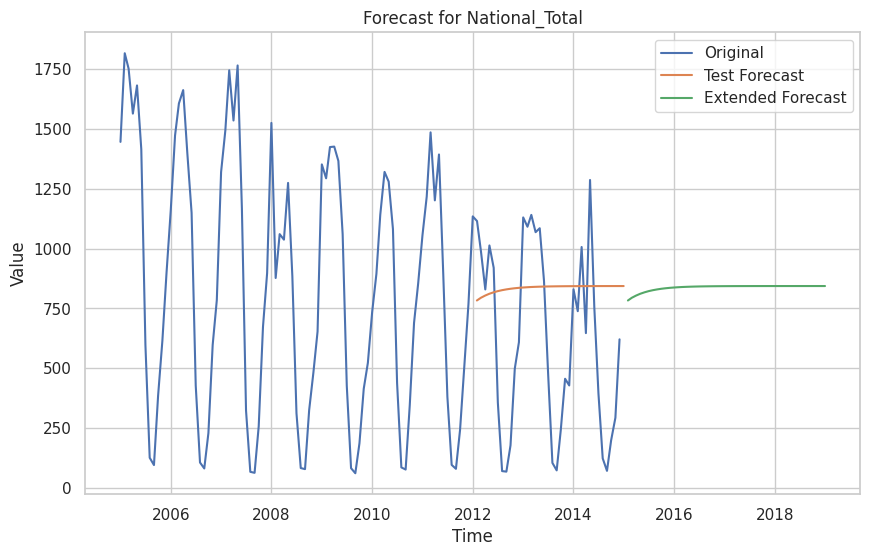

In [87]:
nat_arima_results = {}  # Dictionary to store model results
nat_arima_performance_metrics = {}  # Dictionary to store performance metrics
nat_arima_forecast = {}  # Dictionary to store forecast data

for column in national_decompose_results:
    trend = national_decompose_results[column]['trend']
    seasonal = national_decompose_results[column]['seasonal']
    residual = national_decompose_results[column]['residual']

    # Combine the components to get the original series
    data = trend + seasonal + residual

    # Split the data into training and testing sets
    train_data = data.loc['2005-01-01':'2011-12-31']
    test_data = data.loc['2012-01-01':'2014-12-31']
    
    # Perform grid search to find the best order and seasonal order
    model = pm.auto_arima(train_data, seasonal=True, m=12, suppress_warnings=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Fit ARIMA model
    model = ARIMA(train_data, order=order)
    model_result = model.fit()

    # Store the model results
    nat_arima_results[column] = model_result

    # Obtain forecasts for the test data
    forecast_start = test_data.index[0]
    forecast_end = test_data.index[-1]
    forecast = model_result.predict(start=forecast_start, end=forecast_end)

    # Calculate performance metrics
    mse = mean_squared_error(test_data, forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(test_data, forecast)

    # Store the performance metrics
    nat_arima_performance_metrics[column] = {
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    }

    # Generate forecast dates
    forecast_dates = pd.date_range(start='2012-01-01', end='2014-12-31', freq='M')

    # Trim the forecasted values to match the length of the test data
    forecast_values = forecast[:len(test_data)]
    forecast_dates = forecast_dates[:len(test_data)]
    nat_arima_forecast[column] = {
        'dates': forecast_dates,
        'values': forecast_values
    }

    # Extend the predictions into the future
    num_forecast_periods = 12  # Number of periods to forecast into the future
    future_dates = pd.date_range(start='2015-01-01', periods=num_forecast_periods, freq='M')
    future_forecast = model_result.predict(start=len(data), end=len(data) + num_forecast_periods - 1)

    # Concatenate the forecasted values and dates
    extended_forecast_values = np.concatenate([forecast_values, future_forecast])
    extended_forecast_dates = pd.date_range(start='2015-01-01', periods=len(test_data) + num_forecast_periods, freq='M')

    # Plot the forecast
    plt.figure(figsize=(10, 6))
    plt.plot(data, label='Original')
    plt.plot(forecast_dates, forecast_values, label='Test Forecast')
    plt.plot(extended_forecast_dates, extended_forecast_values, label='Extended Forecast')
    plt.title(f'Forecast for {column}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


The ARIMA performs quite poorly.